In [2]:
import sys
!{sys.executable} -m pip install git+https://github.com/aparrish/vsketch

  Cloning https://github.com/aparrish/vsketch to c:\users\shun\appdata\local\temp\pip-req-build-j_8acdax


  Running command git clone --filter=blob:none --quiet https://github.com/aparrish/vsketch 'C:\Users\Shun\AppData\Local\Temp\pip-req-build-j_8acdax'
  fatal: unable to access 'https://github.com/aparrish/vsketch/': Recv failure: Connection was reset
  error: subprocess-exited-with-error
  
  git clone --filter=blob:none --quiet https://github.com/aparrish/vsketch 'C:\Users\Shun\AppData\Local\Temp\pip-req-build-j_8acdax' did not run successfully.
  exit code: 128
  
  See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.

[notice] A new release of pip is available: 24.3.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip
error: subprocess-exited-with-error

git clone --filter=blob:none --quiet https://github.com/aparrish/vsketch 'C:\Users\Shun\AppData\Local\Temp\pip-req-build-j_8acdax' did not run successfully.
exit code: 128

See above for output.

note: This error originates from a subprocess, and is like

In [3]:
import sys
!{sys.executable} -m pip install --upgrade https://github.com/aparrish/bezmerizing/archive/main.zip

  Using cached https://github.com/aparrish/bezmerizing/archive/main.zip (242 kB)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'done'
  Preparing metadata (pyproject.toml): started
  Preparing metadata (pyproject.toml): finished with status 'done'



[notice] A new release of pip is available: 24.3.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
import random
import vsketch
from bezmerizing import Polyline, Bezier, QuadraticBezier, PolylineList
import bezmerizing
from numpy.random import uniform, normal, choice
import numpy as np
from random import choice, randrange

In [3]:
#Truncated normal distribution
from scipy.stats import truncnorm
def t_normal(a, b, mu, sigma):
    tn = truncnorm((a-mu)/sigma, (b-mu)/sigma, loc=mu, scale=sigma)
    return tn.rvs(1)[0]

# A

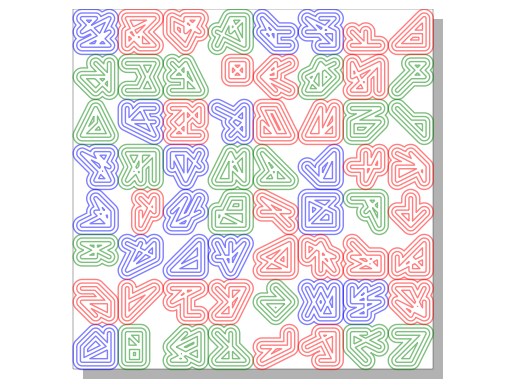

In [3]:
#A-1-1
def grid_glyph():
    pts = []
    for i in range(int(t_normal(8, 12, 10, 2))):
        x = (choice([-0.5, 0, 0.5]))
        y = (choice([-0.5, 0, 0.5]))
        pts.append([x, y])
    return pts
    
width = 100
height = 100
grid_size = 8
pen_size = 1

cell_size_x = width / grid_size
cell_size_y = height / grid_size

scale_val = (width / grid_size) * 0.6

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

vsk.penWidth(f"{pen_size}mm")
vsk.strokeWeight(int(cell_size_x / pen_size / 2))

for i in range(grid_size):
    for j in range(grid_size):
            glyph = grid_glyph()
            with vsk.pushMatrix():
                stroke_pen = choice([1, 2, 3])
                vsk.stroke(stroke_pen)
                vsk.translate(i * cell_size_x, j * cell_size_y)
                vsk.scale(scale_val_x, scale_val_y)
                
                vsk.polygon(glyph)           
vsk.display()
vsk.save("A-1-01.svg")

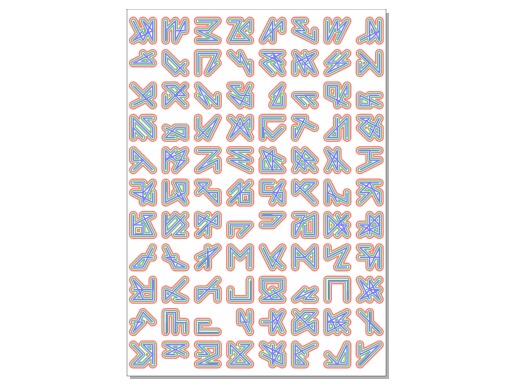

In [5]:
#A-1-2

from random import sample

def grid_glyph(k=9, values=(-0.5, 0, 0.5)):
    # 3×3 网格的所有坐标
    all_pts = [(x, y) for x in values for y in values]  # 共 9 个
    if k > len(all_pts):
        raise ValueError(f"k={k} exceeds the number of available unique points {len(all_pts)}")
    picked = sample(all_pts, k)  # 无放回抽样，保证不重复
    return [list(p) for p in picked]
    
width = 210
height = 297
grid_size = 8
pen_size = 1.5

cell_size_x = width / grid_size
cell_size_y = height / grid_size

scale_val_x = (width / grid_size) * 0.6

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")


for i in range(grid_size):
    for j in range(11):
            glyph = grid_glyph(choice([5,6,8]))
            with vsk.pushMatrix():
                
                vsk.translate(i * cell_size_x, j * cell_size_x)
                vsk.scale(scale_val_x, scale_val_x)          

                vsk.stroke(1)
                vsk.penWidth(f"{pen_size}mm")
                vsk.strokeWeight(1)
                vsk.polygon(glyph) 

                vsk.stroke(2)
                vsk.penWidth(f"{pen_size*2}mm")
                vsk.strokeWeight(2)
                vsk.polygon(glyph) 

                vsk.stroke(3)
                vsk.penWidth(f"{pen_size*4}mm")
                vsk.strokeWeight(2)
                vsk.polygon(glyph) 
vsk.display()
vsk.save("A-1-02.svg")

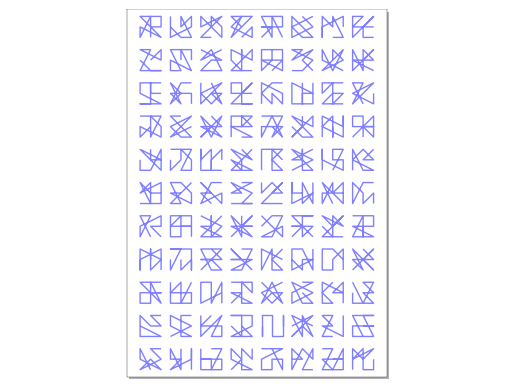

In [57]:
#A-1-3
import vsketch
from random import sample

# -------------------------------------------------------
# Glyph generator
# -------------------------------------------------------
def grid_glyph_norepeat(k=9, values=(-0.5, 0, 0.5)):
    all_pts = [(x, y) for x in values for y in values]  # 3×3 = 9 points total
    if k > len(all_pts):
        raise ValueError(f"k={k} exceeds the number of available unique points {len(all_pts)}")
    picked = sample(all_pts, k)
    return [list(p) for p in picked]


# -------------------------------------------------------
# Page + Grid Settings
# -------------------------------------------------------
page_width  = 297
page_height = 420

# margins (mm)
margin_left   = 22
margin_right  = 8
margin_top    = 8
margin_bottom = 8

grid_cols = 8
grid_rows = 11

gutter_mm = 14

# compute cell dimensions
cell_width  = (page_width  - margin_left - margin_right - gutter_mm*(grid_cols-1)) / grid_cols
cell_height = (page_height - margin_top  - margin_bottom - gutter_mm*(grid_rows-1)) / grid_rows

gutter_mm_x= (page_width - margin_left  - margin_right - cell_height*grid_cols) / (grid_cols-1)

# glyph scale factor relative to cell
scale_factor = 1
scale_val_x = cell_width  * scale_factor
scale_val_y = cell_height * scale_factor


# -------------------------------------------------------
# vsketch init
# -------------------------------------------------------
vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")


# -------------------------------------------------------
# Draw Grid
# -------------------------------------------------------
for row in range(grid_rows):
    for col in range(grid_cols):

        glyph = grid_glyph_norepeat()

        # top-left corner of each cell
        ox = margin_left + col*(cell_height  + gutter_mm_x)
        oy = margin_top  + row*(cell_height + gutter_mm)

        with vsk.pushMatrix():
            # translate to cell
            vsk.translate(ox, oy)

            # center glyph inside the cell
            vsk.translate(
                (cell_height  - scale_val_y) / 2,
                (cell_height  - scale_val_y) / 2
            )

            # scale glyph (uniform, not distorted)
            vsk.scale(scale_val_y)

            # draw polygon
            vsk.polygon(glyph)

vsk.display()
vsk.save("A-1-02.svg")

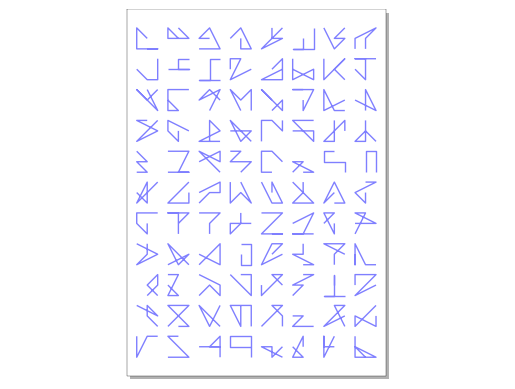

In [62]:
#A-1-4
import vsketch
from random import sample

# -------------------------------------------------------
# Glyph generator
# -------------------------------------------------------
def grid_glyph_norepeat(k=9, values=(-0.5, 0, 0.5)):
    all_pts = [(x, y) for x in values for y in values]  # 3×3 = 9 points total
    if k > len(all_pts):
        raise ValueError(f"k={k} exceeds the number of available unique points {len(all_pts)}")
    picked = sample(all_pts, k)
    return [list(p) for p in picked]


# -------------------------------------------------------
# Page + Grid Settings
# -------------------------------------------------------
page_width  = 210
page_height = 297

# margins (mm)
margin_left   = 8
margin_right  = 8
margin_top    = 8
margin_bottom = 22

grid_cols = 8
grid_rows = 11

gutter_mm = 8

# compute cell dimensions
cell_width  = (page_width  - margin_left - margin_right - gutter_mm*(grid_cols-1)) / grid_cols
cell_height = (page_height - margin_top  - margin_bottom - gutter_mm*(grid_rows-1)) / grid_rows

gutter_mm_x= (page_width - margin_left  - margin_right - cell_height*grid_cols) / (grid_cols-1)

# glyph scale factor relative to cell
scale_factor = 1
scale_val_x = cell_width  * scale_factor
scale_val_y = cell_height * scale_factor


# -------------------------------------------------------
# vsketch init
# -------------------------------------------------------
vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")


# -------------------------------------------------------
# Draw Grid
# -------------------------------------------------------
for row in range(grid_rows):
    for col in range(grid_cols):

        glyph = grid_glyph_norepeat(5)

        # top-left corner of each cell
        ox = margin_left + col*(cell_height  + gutter_mm_x)
        oy = margin_top  + row*(cell_height + gutter_mm)

        with vsk.pushMatrix():
            # translate to cell
            vsk.translate(ox, oy)

            # center glyph inside the cell
            vsk.translate(
                (cell_height  - scale_val_y) / 2,
                (cell_height  - scale_val_y) / 2
            )

            # scale glyph (uniform, not distorted)
            vsk.scale(scale_val_y)

            # draw polygon
            vsk.polygon(glyph)

vsk.display()
vsk.save("A-1-02.svg")

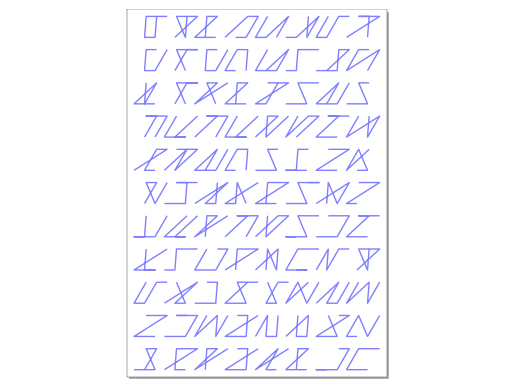

In [64]:
#A-1-5
import vsketch
from random import sample

# -------------------------------------------------------
# Glyph generator
# -------------------------------------------------------
def grid_glyph_norepeat_3x2(k=4, xs=(-0.5, 0, 0.5), ys=(-0.5, 0.5)):
    # 2×3 网格的所有坐标（3 个 x × 2 个 y = 6 个点）
    all_pts = [(x, y) for x in xs for y in ys] 
    if k > len(all_pts):
        raise ValueError(f"k={k} exceeds the number of available unique points {len(all_pts)}")
    picked = sample(all_pts, k)  # 无放回抽样，保证不重复
    return [list(p) for p in picked]

def italicize(pts, angle_deg=60):
    shear = math.tan(math.radians(angle_deg))
    return [[x + shear * y, y] for (x, y) in pts]

# -------------------------------------------------------
# Page + Grid Settings
# -------------------------------------------------------
page_width  = 297
page_height = 420

# margins (mm)
margin_left   = 22
margin_right  = 8
margin_top    = 8
margin_bottom = 8

grid_cols = 8
grid_rows = 11

gutter_mm = 14

# compute cell dimensions
cell_width  = (page_width  - margin_left - margin_right - gutter_mm*(grid_cols-1)) / grid_cols
cell_height = (page_height - margin_top  - margin_bottom - gutter_mm*(grid_rows-1)) / grid_rows

gutter_mm_x= (page_width - margin_left  - margin_right - cell_height*grid_cols) / (grid_cols-1)

# glyph scale factor relative to cell
scale_factor = 1
scale_val_x = cell_width  * scale_factor
scale_val_y = cell_height * scale_factor


# -------------------------------------------------------
# vsketch init
# -------------------------------------------------------
vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")


# -------------------------------------------------------
# Draw Grid
# -------------------------------------------------------
for row in range(grid_rows):
    for col in range(grid_cols):

        glyph =  grid_glyph_norepeat_3x2(5)
        glyph = italicize(glyph, angle_deg=-30)  

        # top-left corner of each cell
        ox = margin_left + col*(cell_height  + gutter_mm_x)
        oy = margin_top  + row*(cell_height + gutter_mm)

        with vsk.pushMatrix():
            # translate to cell
            vsk.translate(ox, oy)

            # center glyph inside the cell
            vsk.translate(
                (cell_height  - scale_val_y) / 2,
                (cell_height  - scale_val_y) / 2
            )

            # scale glyph (uniform, not distorted)
            vsk.scale(scale_val_y)

            # draw polygon
            vsk.polygon(glyph)

vsk.display()
vsk.save("A-1-02.svg")

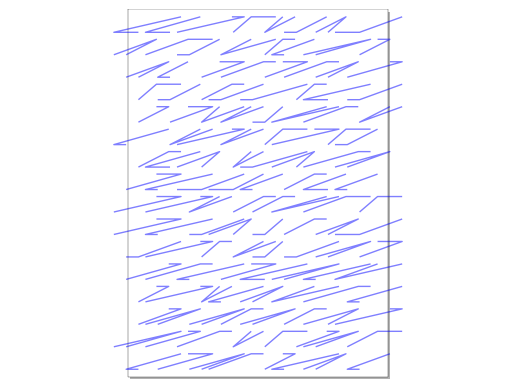

In [553]:
#D-7-1
import math
from random import sample

# -------------------------------------------------------
# Glyph generator
# -------------------------------------------------------
def grid_glyph_norepeat_nosamey_3x2(k=4, xs=(-0.5, 0, 0.5), ys=(-0.5, 0.5)):
    all_pts = [(x, y) for x in xs for y in ys]  # total 6
    if k > len(all_pts):
        raise ValueError(f"k={k} exceeds the number of available unique points {len(all_pts)}")

    def ok(seq):
        # reject triples with same y
        for i in range(len(seq) - 2):
            if seq[i][1] == seq[i+1][1] == seq[i+2][1]:
                return False
        return True

    while True:
        picked = sample(all_pts, k)
        if ok(picked):
            return [list(p) for p in picked]

def italicize(pts, angle_deg=60):
    shear = math.tan(math.radians(angle_deg))
    return [[x + shear * y, y] for (x, y) in pts]


# -------------------------------------------------------
# PAGE + GRID SETTINGS  (✨你要的 margin + gutter)
# -------------------------------------------------------
page_width  = 297
page_height = 420

margin_left   = 8
margin_right  = 8
margin_top    = 8
margin_bottom = 9

grid_cols = 8
grid_rows = 16

gutter_mm = 8

# compute cell sizes
cell_width  = (page_width  - margin_left - margin_right - gutter_mm*(grid_cols-1)) / grid_cols
cell_height = (page_height - margin_top  - margin_bottom - gutter_mm*(grid_rows-1)) / grid_rows

# glyph scale relative to cell
scale_factor = 1


# -------------------------------------------------------
# vsketch init
# -------------------------------------------------------
vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")


# -------------------------------------------------------
# DRAW GRID
# -------------------------------------------------------
for row in range(grid_rows):
    for col in range(grid_cols):

        # generate glyph
        glyph = grid_glyph_norepeat_nosamey_3x2(3)
        glyph = italicize(glyph, angle_deg=-60)

        # scale values (mm per unit glyph)
        scale_val_x = cell_width  * scale_factor
        scale_val_y = cell_height * scale_factor

        # position for this cell (top-left)
        x = margin_left + col*(cell_width + gutter_mm)
        y = margin_top  + row*(cell_height + gutter_mm)

        with vsk.pushMatrix():
            # translate to cell
            vsk.translate(x, y)

            # OPTIONAL: center glyph inside cell
            vsk.translate((cell_width - scale_val_x)/2,
                          (cell_height - scale_val_y)/2)

            # scale glyph
            vsk.scale(scale_val_x, scale_val_y)

            # draw
            vsk.polygon(glyph)

vsk.display()
vsk.save("A-1-02.svg")

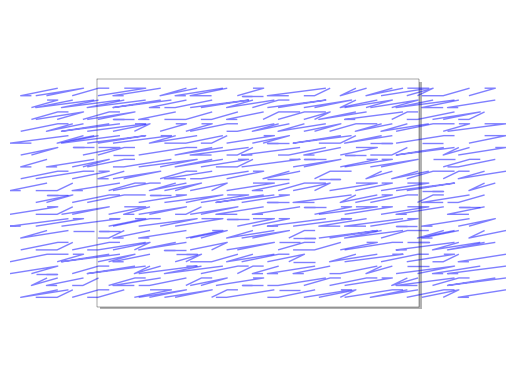

In [568]:
#D-7-2
import math
from random import sample

# -------------------------------------------------------
# Glyph generator
# -------------------------------------------------------
def grid_glyph_norepeat_3x2(k=4, xs=(-0.5, 0, 0.5), ys=(-0.5, 0.5)):
    # 2×3 网格的所有坐标（3 个 x × 2 个 y = 6 个点）
    all_pts = [(x, y) for x in xs for y in ys] 
    if k > len(all_pts):
        raise ValueError(f"k={k} exceeds the number of available unique points {len(all_pts)}")
    picked = sample(all_pts, k)  # 无放回抽样，保证不重复
    return [list(p) for p in picked]

def italicize(pts, angle_deg=60):
    shear = math.tan(math.radians(angle_deg))
    return [[x + shear * y, y] for (x, y) in pts]

def italicize(pts, angle_deg=60):
    shear = math.tan(math.radians(angle_deg))
    return [[x + shear * y, y] for (x, y) in pts]


# -------------------------------------------------------
# PAGE + GRID SETTINGS  (✨你要的 margin + gutter)
# -------------------------------------------------------
page_width  = 297
page_height = 210

margin_left   = 8
margin_right  = 8
margin_top    = 8
margin_bottom = 9

grid_cols = 12
grid_rows = 18

gutter_mm = 4

# compute cell sizes
cell_width  = (page_width  - margin_left - margin_right - gutter_mm*(grid_cols-1)) / grid_cols
cell_height = (page_height - margin_top  - margin_bottom - gutter_mm*(grid_rows-1)) / grid_rows

# glyph scale relative to cell
scale_factor = 1


# -------------------------------------------------------
# vsketch init
# -------------------------------------------------------
vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")


# -------------------------------------------------------
# DRAW GRID
# -------------------------------------------------------
for row in range(grid_rows):
    for col in range(grid_cols+6):

        # generate glyph
        glyph = grid_glyph_norepeat_3x2(3)
        glyph = italicize(glyph, angle_deg=-60)

        # scale values (mm per unit glyph)
        scale_val_x = cell_width  * scale_factor
        scale_val_y = cell_height * scale_factor

        # position for this cell (top-left)
        x = margin_left + col*(cell_width + gutter_mm)
        y = margin_top  + row*(cell_height + gutter_mm)

        with vsk.pushMatrix():
            # translate to cell
            vsk.translate(x, y)

            # OPTIONAL: center glyph inside cell
            vsk.translate((cell_width - scale_val_x)/2,
                          (cell_height - scale_val_y)/2)

            # scale glyph
            vsk.scale(scale_val_x, scale_val_y)

            # draw
            vsk.polygon(glyph)

vsk.display()
vsk.save("A-1-02.svg")

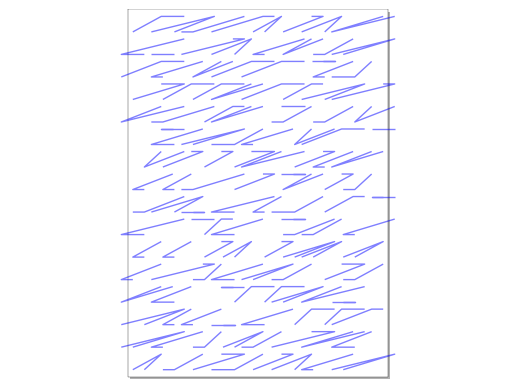

In [41]:
#G-4-
import math
from random import sample
import vsketch

# -------------------------------------------------------
# Glyph generator
# -------------------------------------------------------
def grid_glyph_norepeat_3x2(k=4, xs=(-0.5, 0, 0.5), ys=(-0.5, 0.5)):
    all_pts = [(x, y) for x in xs for y in ys] 
    if k > len(all_pts):
        raise ValueError(f"k={k} exceeds the number of available unique points {len(all_pts)}")
    picked = sample(all_pts, k)
    return [list(p) for p in picked]

def italicize(pts, angle_deg=60):
    shear = math.tan(math.radians(angle_deg))
    return [[x + shear * y, y] for (x, y) in pts]


# -------------------------------------------------------
# PAGE + GRID SETTINGS  (✨加入 margin + gutter)
# -------------------------------------------------------
page_width  = 297
page_height = 420

margin_left   = 8
margin_right  = 22
margin_top    = 8
margin_bottom = 8

grid_cols = 8
grid_rows = 16

gutter_mm = 8

# compute cell sizes
cell_width  = (page_width  - margin_left - margin_right - gutter_mm*(grid_cols-1)) / grid_cols
cell_height = (page_height - margin_top  - margin_bottom - gutter_mm*(grid_rows-1)) / grid_rows

# glyph scale relative to cell
scale_factor = 1


# -------------------------------------------------------
# vsketch init
# -------------------------------------------------------
vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")


# -------------------------------------------------------
# DRAW GRID
# -------------------------------------------------------
for row in range(grid_rows):
    for col in range(grid_cols):

        # generate glyph
        glyph = grid_glyph_norepeat_3x2(3)
        glyph = italicize(glyph, angle_deg=-60)

        # scale values (mm per unit glyph)
        scale_val_x = cell_width  * scale_factor
        scale_val_y = cell_height * scale_factor

        # cell origin (top-left corner)
        ox = margin_left + col * (cell_width + gutter_mm)
        oy = margin_top  + row * (cell_height + gutter_mm)

        with vsk.pushMatrix():
            # move to cell
            vsk.translate(ox, oy)

            # center glyph in the cell
            vsk.translate(
                (cell_width - scale_val_x) / 2,
                (cell_height - scale_val_y) / 2
            )

            # scale glyph
            vsk.scale(scale_val_x, scale_val_y)

            # draw
            vsk.polygon(glyph)

vsk.display()
vsk.save("A-1-02.svg")

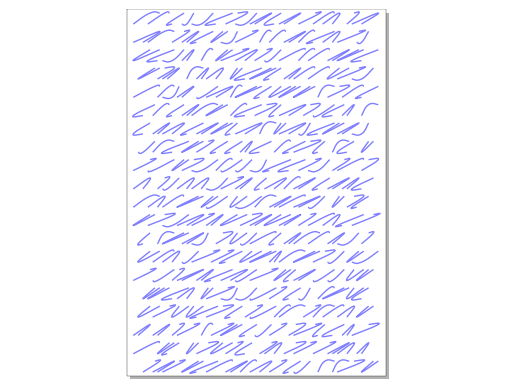

In [567]:
#D-7-3
import math
from random import sample

def grid_glyph_norepeat_nosamey_3x2(k=4, xs=(-0.5, 0, 0.5), ys=(-0.5, 0.5)):
    all_pts = [(x, y) for x in xs for y in ys]
    if k > len(all_pts):
        raise ValueError(f"k={k} exceeds the number of available unique points {len(all_pts)}")

    def ok(seq):
        for i in range(len(seq) - 2):
            if seq[i][1] == seq[i+1][1] == seq[i+2][1]:
                return False
        return True

    while True:
        picked = sample(all_pts, k) 
        if ok(picked):
            return [list(p) for p in picked]

def italicize(pts, angle_deg=60):
    shear = math.tan(math.radians(angle_deg))
    return [[x + shear * y, y] for (x, y) in pts]
    
width = 210
height = 297

grid_size_x = 16
grid_size_y = 20

cell_size_x = width / grid_size_x
cell_size_y = height / grid_size_y

scale_factor = 0.6
scale_val_x = (width / grid_size_x) * scale_factor
scale_val_y = (height / grid_size_y) * scale_factor

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

for i in range(grid_size_x):
    for j in range(grid_size_y):
        glyph = grid_glyph_norepeat_nosamey_3x2(3)
        glyph = italicize(glyph, angle_deg=-60)   

        with vsk.pushMatrix():
            vsk.translate(i * cell_size_x * 0.9, j * cell_size_y)
            vsk.scale(scale_val_x, scale_val_y)

            smooth = (
                bezmerizing.Polyline(glyph)
                .augment()
                .catmull_spline(tightness=-0.5)
                .to_polyline(10)
            )
            vsk.polygon(smooth)

vsk.display()
vsk.save("A-1-02.svg")

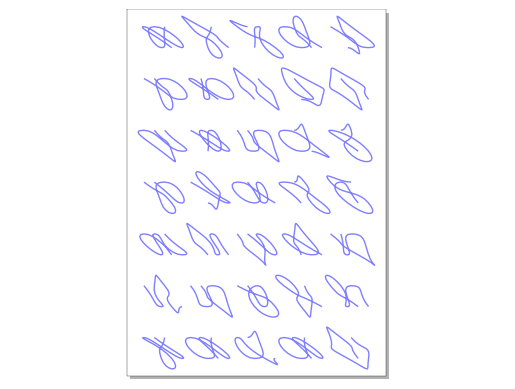

In [15]:
#D-7-4
import math
from random import sample

def grid_glyph_norepeat_nosamey_3x2(k=4, xs=(-0.5, 0, 0.5), ys=(-0.5, 0.5)):
    all_pts = [(x, y) for x in xs for y in ys]
    if k > len(all_pts):
        raise ValueError(f"k={k} exceeds the number of available unique points {len(all_pts)}")

    def ok(seq):
        for i in range(len(seq) - 2):
            if seq[i][1] == seq[i+1][1] == seq[i+2][1]:
                return False
        return True

    while True:
        picked = sample(all_pts, k) 
        if ok(picked):
            return [list(p) for p in picked]

def italicize(pts, angle_deg=60):
    shear = math.tan(math.radians(angle_deg))
    return [[x + shear * y, y] for (x, y) in pts]
    
width = 210
height = 297
grid_size_x = 5
grid_size_y = 7

cell_size_x = width / grid_size_x
cell_size_y = height / grid_size_y

scale_factor = 0.4
scale_val_x = (width / grid_size_x) * scale_factor
scale_val_y = (height / grid_size_y) * scale_factor

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

for i in range(grid_size_x):
    for j in range(grid_size_y):
        glyph = grid_glyph_norepeat_nosamey_3x2(6)
        glyph = italicize(glyph, angle_deg=40)   

        with vsk.pushMatrix():
            vsk.translate(i * cell_size_x * 0.9, j * cell_size_x)
            vsk.scale(scale_val_x, scale_val_y)

            smooth = (
                bezmerizing.Polyline(glyph)
                .augment()
                .catmull_spline(tightness=-3)
                .to_polyline(10)
            )
            vsk.polygon(smooth)

vsk.display()
# vsk.save("A-1-02.svg")

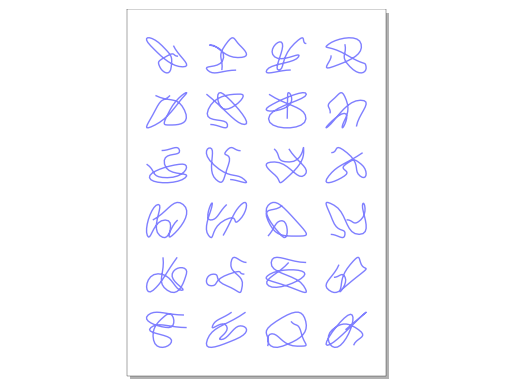

In [593]:
#A-1-6
import math
from random import sample, gauss
import vsketch
import bezmerizing
import numpy as np

# -------- 工具函数 --------
def t_normal(low, high, mean, sd):
    """截断正态分布"""
    while True:
        v = gauss(mean, sd)
        if low <= v <= high:
            return v

def grid_glyph_norepeat_nosamey_3x2(k=4, xs=(-0.5, 0, 0.5), ys=(-0.5, 0, 0.5)):
    all_pts = [(x, y) for x in xs for y in ys]
    if k > len(all_pts):
        raise ValueError(f"k={k} exceeds {len(all_pts)} available points")

    def ok(seq):
        for i in range(len(seq) - 2):
            if seq[i][1] == seq[i+1][1] == seq[i+2][1]:
                return False
        return True

    while True:
        picked = sample(all_pts, k)
        if ok(picked):
            return [list(p) for p in picked]

def italicize(pts, angle_deg=60):
    shear = math.tan(math.radians(angle_deg))
    return [[x + shear * y, y] for (x, y) in pts]


# -------- 页面 + 网格布局 --------
page_width  = 210
page_height = 297

margin_left   = 8 +8
margin_right  = 8+8
margin_top    = 8+8
margin_bottom = 22+8

grid_cols = 4
grid_rows = 6

# 12pt gutter -> mm
gutter_pt = 12
gutter_mm = 16

cell_width  = (page_width  - margin_left - margin_right - gutter_mm*(grid_cols-1)) / grid_cols
cell_height = (page_height - margin_top  - margin_bottom - gutter_mm*(grid_rows-1)) / grid_rows


# -------- vsk 初始化 --------
vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")

vsk.penWidth("1mm")
vsk.strokeWeight(1)


# -------- 绘制矩阵 --------
for row in range(grid_rows):
    for col in range(grid_cols):
        # 1) 生成 glyph 点
        glyph = grid_glyph_norepeat_nosamey_3x2(8)
        angle = t_normal(-60, 60, 0, 20)
        glyph = italicize(glyph, angle_deg=angle)

        # 2) 平滑成曲线
        smooth = (
            bezmerizing.Polyline(glyph)
            .augment()
            .catmull_spline(tightness=-2)
            .to_polyline(10)
        )
        verts = np.array(smooth)

        # 3) 计算 glyph 的 bbox，用来强行缩放到 cell 大小
        minx, miny = verts.min(axis=0)
        maxx, maxy = verts.max(axis=0)
        gw = maxx - minx
        gh = maxy - miny

        # 避免 0 宽高
        if gw == 0 or gh == 0:
            continue

        # 这里用非等比缩放：强行填满 cell（横向、纵向分别算）
        sx = cell_width  / gw
        sy = cell_height / gh

        ox = margin_left + col * (cell_width + gutter_mm)
        oy = margin_top  + row * (cell_height + gutter_mm)

        with vsk.pushMatrix():
            # 移到 cell 左上角
            vsk.translate(ox, oy)
            # 缩放到刚好等于 cell 尺寸
            vsk.scale(sx, sy)
            # 把 glyph bbox 的左上角对齐到 cell 原点
            vsk.translate(-minx, -miny)

            vsk.polygon(verts)

vsk.display()
vsk.save("A-1-02.svg")

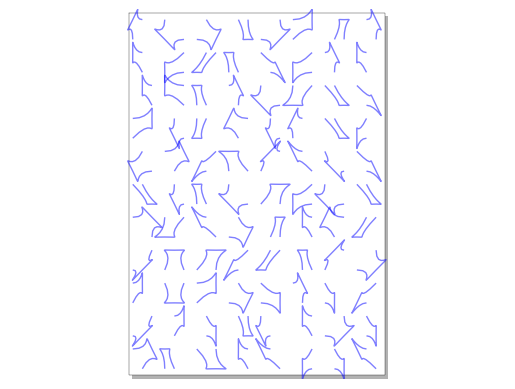

In [348]:
#D-7-5
import math
from random import sample

def grid_glyph_norepeat_nosamey_3x2(k=4, xs=(-0.5, 0, 0.5), ys=(-0.5, 0.5)):
    all_pts = [(x, y) for x in xs for y in ys]
    if k > len(all_pts):
        raise ValueError(f"k={k} exceeds the number of available unique points {len(all_pts)}")

    def ok(seq):
        for i in range(len(seq) - 2):
            if seq[i][1] == seq[i+1][1] == seq[i+2][1]:
                return False
        return True

    while True:
        picked = sample(all_pts, k) 
        if ok(picked):
            return [list(p) for p in picked]

def italicize(pts, angle_deg=60):
    shear = math.tan(math.radians(angle_deg))
    return [[x + shear * y, y] for (x, y) in pts]
    
width = 210
height = 297

grid_size_x = 8
grid_size_y = 11

cell_size_x = width / grid_size_x
cell_size_y = height / grid_size_y

scale_factor = 0.6
scale_val_x = (width / grid_size_x) * scale_factor
scale_val_y = (height / grid_size_y) * scale_factor

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

for i in range(grid_size_x):
    for j in range(grid_size_y):
        glyph = grid_glyph_norepeat_nosamey_3x2(3)
        glyph = italicize(glyph, angle_deg=-0)   

        with vsk.pushMatrix():
            vsk.translate(i * cell_size_x, j * cell_size_y)
            # vsk.rect(-cell_size_x/2, -cell_size_y/2, cell_size_x, cell_size_y)  #gpt
            vsk.scale(scale_val_x, scale_val_y)

            smooth = (
                bezmerizing.Polyline(glyph)
                .augment()
                .catmull_spline(tightness=-6)
                .to_polyline(10)
            )
            vsk.polygon(smooth)
        

vsk.display()
vsk.save("A-1-02.svg")

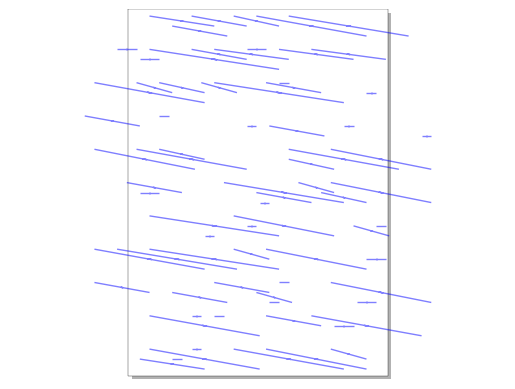

In [22]:
#D-7-6
import math
from random import sample

def grid_glyph():
    pts = []
    for i in range(2):
        x = (choice([-0.5, 0, 0.5]))
        y = (choice([-0.5, 0, 0.5]))
        pts.append([x, y])
    return pts

def italicize(pts, angle_deg=60):
    shear = math.tan(math.radians(angle_deg))
    return [[x + shear * y, y] for (x, y) in pts]
    
width = 210
height = 297

grid_size_x = 8
grid_size_y = 11

cell_size_x = width / grid_size_x
cell_size_y = height / grid_size_y

scale_factor = 0.6
scale_val_x = (width / grid_size_x) * scale_factor
scale_val_y = (height / grid_size_y) * scale_factor

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

for i in range(grid_size_x):
    for j in range(grid_size_y):
        glyph = grid_glyph()
        glyph = italicize(glyph, angle_deg=80)   

        with vsk.pushMatrix():
            vsk.translate(i * cell_size_x, j * cell_size_y)
            vsk.scale(scale_val_x, scale_val_y)

            smooth = (
                bezmerizing.Polyline(glyph)
                .augment()
                .catmull_spline(tightness=-6)
                .to_polyline(10)
            )
            vsk.polygon(smooth)

vsk.display()
vsk.save("A-1-02.svg") 

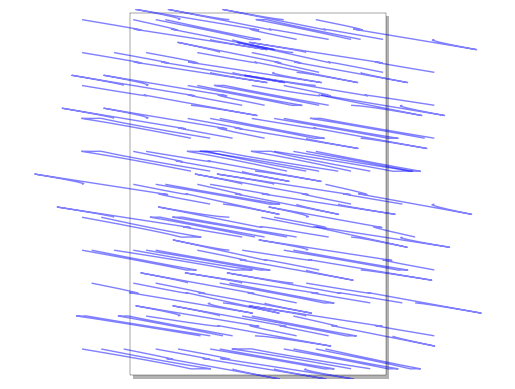

In [67]:
#D-7-7
import math
from random import sample

def grid_glyph_norepeat_nosamey_3x2(k=4, xs=(-0.5, 0, 0.5), ys=(-0.5, 0.5)):
    all_pts = [(x, y) for x in xs for y in ys]
    if k > len(all_pts):
        raise ValueError(f"k={k} exceeds the number of available unique points {len(all_pts)}")

    def ok(seq):
        for i in range(len(seq) - 2):
            if seq[i][1] == seq[i+1][1] == seq[i+2][1]:
                return False
        return True

    while True:
        picked = sample(all_pts, k) 
        if ok(picked):
            return [list(p) for p in picked]

def italicize(pts, angle_deg=60):
    shear = math.tan(math.radians(angle_deg))
    return [[x + shear * y, y] for (x, y) in pts]
    
width = 210
height = 297

grid_size_x = 8
grid_size_y = 11

cell_size_x = width / grid_size_x
cell_size_y = height / grid_size_y

scale_factor = 0.6
scale_val_x = (width / grid_size_x) * scale_factor
scale_val_y = (height / grid_size_y) * scale_factor

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

for i in range(grid_size_x):
    for j in range(grid_size_y):
        glyph = grid_glyph_norepeat_nosamey_3x2(3)
        glyph = italicize(glyph, angle_deg=80)   

        with vsk.pushMatrix():
            vsk.translate(i * cell_size_x, j * cell_size_y)
            vsk.scale(scale_val_x, scale_val_y)

            smooth = (
                bezmerizing.Polyline(glyph)
                .augment()
                .catmull_spline(tightness=-6)
                .to_polyline(10)
            )
            vsk.polygon(smooth)

vsk.display()
# vsk.save("A-1-02.svg") 

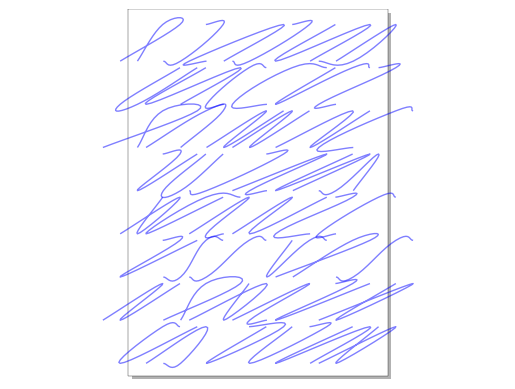

In [581]:
#D-7-8
import math
from random import sample

def grid_glyph_norepeat_nosamey_3x2(k=4, xs=(-0.5, 0, 0.5), ys=(-0.5, 0.5)):
    all_pts = [(x, y) for x in xs for y in ys]
    if k > len(all_pts):
        raise ValueError(f"k={k} exceeds the number of available unique points {len(all_pts)}")

    def ok(seq):
        for i in range(len(seq) - 2):
            if seq[i][1] == seq[i+1][1] == seq[i+2][1]:
                return False
        return True

    while True:
        picked = sample(all_pts, k) 
        if ok(picked):
            return [list(p) for p in picked]

def italicize(pts, angle_deg=60):
    shear = math.tan(math.radians(angle_deg))
    return [[x + shear * y, y] for (x, y) in pts]
    
width = 210
height = 297

grid_size_x = 6
grid_size_y = 8

cell_size_x = width / grid_size_x
cell_size_y = height / grid_size_y

scale_factor = 0.8
scale_val_x = (width / grid_size_x) * scale_factor
scale_val_y = (height / grid_size_y) * scale_factor

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

for i in range(grid_size_x):
    for j in range(grid_size_y):
        glyph = grid_glyph(4)
        glyph = italicize(glyph, angle_deg=-60)   

        with vsk.pushMatrix():
            vsk.translate(i * cell_size_x * 1, j * cell_size_x)
            vsk.scale(scale_val_x,scale_val_y)

            vsk.stroke(1)
            vsk.penWidth(f"{pen_size}mm")
            vsk.strokeWeight(1)

            smooth = (
                bezmerizing.Polyline(glyph)
                .augment()
                .catmull_spline(tightness=-0.5)
                .to_polyline(10)
            )
            vsk.polygon(smooth)

vsk.display()
vsk.save("A-1-02.svg")

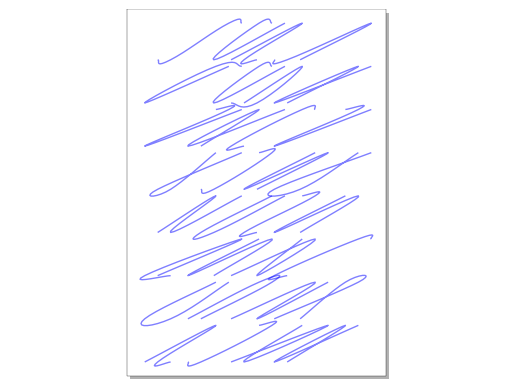

In [94]:
#D-7-9
import math
from random import sample

def grid_glyph(k=4, xs=(-0.5, 0, 0.5), ys=(-0.5, 0.5)):
    # 2×3 网格的所有坐标（3 个 x × 2 个 y = 6 个点）
    all_pts = [(x, y) for x in xs for y in ys]  # 共 6 个
    if k > len(all_pts):
        raise ValueError(f"k={k} exceeds the number of available unique points {len(all_pts)}")

    def ok(seq):
        """检查是否不存在连续三个 y 相同的点"""
        for i in range(len(seq) - 2):
            if seq[i][1] == seq[i+1][1] == seq[i+2][1]:
                return False
        return True

    # 不断重抽直到满足条件
    while True:
        picked = sample(all_pts, k)  # 无放回抽样，保证不重复
        if ok(picked):
            return [list(p) for p in picked]

def italicize(pts, angle_deg=60):
    shear = math.tan(math.radians(angle_deg))
    return [[x + shear * y, y] for (x, y) in pts]
    
width = 210
height = 297
grid_size = 6
pen_size = 2

cell_size_x = width / grid_size 

scale_val_x = (width / grid_size) * 0.6
scale_val_y = (height / grid_size) * 0.6


vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

for i in range(4):
    for j in range(8):
        glyph = grid_glyph(4)
        glyph = italicize(glyph, angle_deg=-70)   

        with vsk.pushMatrix():
            vsk.translate(i * cell_size_x * 1, j * cell_size_x)
            vsk.scale(scale_val_x,scale_val_y)

            vsk.stroke(1)
            vsk.penWidth(f"{pen_size}mm")
            vsk.strokeWeight(1)

            smooth = (
                bezmerizing.Polyline(glyph)
                .augment()
                .catmull_spline(tightness=-0.5)
                .to_polyline(10)
            )
            vsk.polygon(smooth)

vsk.display()
vsk.save("A-1-02.svg")

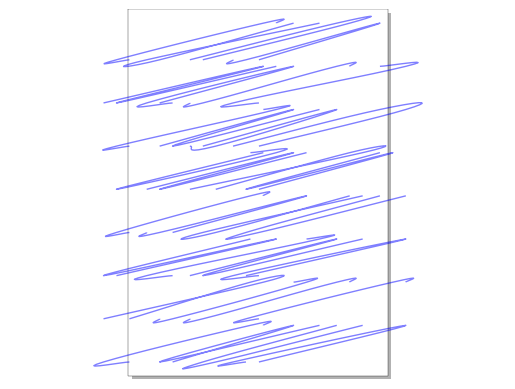

In [103]:
#D-8-9
import math
from random import sample

def grid_glyph(k=4, xs=(-0.5, 0, 0.5), ys=(-0.5, 0.5)):
    # 2×3 网格的所有坐标（3 个 x × 2 个 y = 6 个点）
    all_pts = [(x, y) for x in xs for y in ys]  # 共 6 个
    if k > len(all_pts):
        raise ValueError(f"k={k} exceeds the number of available unique points {len(all_pts)}")

    def ok(seq):
        """检查是否不存在连续三个 y 相同的点"""
        for i in range(len(seq) - 2):
            if seq[i][1] == seq[i+1][1] == seq[i+2][1]:
                return False
        return True

    # 不断重抽直到满足条件
    while True:
        picked = sample(all_pts, k)  # 无放回抽样，保证不重复
        if ok(picked):
            return [list(p) for p in picked]

def italicize(pts, angle_deg=60):
    shear = math.tan(math.radians(angle_deg))
    return [[x + shear * y, y] for (x, y) in pts]
    
width = 210
height = 297
grid_size = 6
pen_size = 2

cell_size_x = width / grid_size 

scale_val_x = (width / grid_size) * 0.6
scale_val_y = (height / grid_size) * 0.6


vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

for i in range(4):
    for j in range(8):
        glyph = grid_glyph(4)
        glyph = italicize(glyph, angle_deg=-80)   

        with vsk.pushMatrix():
            vsk.translate(i * cell_size_x * 1, j * cell_size_x)
            vsk.scale(scale_val_x,scale_val_y)

            vsk.stroke(1)
            vsk.penWidth(f"{pen_size}mm")
            vsk.strokeWeight(1)

            smooth = (
                bezmerizing.Polyline(glyph)
                .augment()
                .catmull_spline(tightness=-0.5)
                .to_polyline(10)
            )
            vsk.polygon(smooth)

vsk.display()
vsk.save("A-1-02.svg")

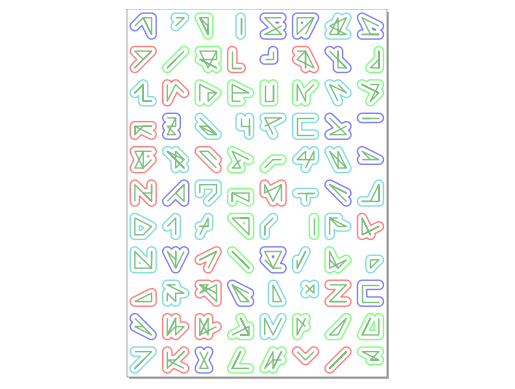

In [197]:
#A-1-7
def grid_glyph():
    pts = []
    for i in range(int(t_normal(4, 10, 6, 2))):
        x = (choice([-0.5, 0, 0.5]))
        y = (choice([-0.5, 0, 0.5]))
        pts.append([x, y])
    return pts

width = 297
height = 420
grid_x = 8
grid_y = 11
pen_size = 6

cell_size_x = width / grid_x
cell_size_y = height / grid_y

scale_val = width / grid_x - pen_size*3

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

for i in range(grid_x):
    for j in range(grid_y):
        glyph = grid_glyph()
        with vsk.pushMatrix():
            stroke_pen = choice([1, 2, 3, 4])
            vsk.stroke(stroke_pen)
            vsk.penWidth(f"{cell_size_x / 2 - 8}mm")
            vsk.strokeWeight(2)
            vsk.translate(i * cell_size_x, j * cell_size_y)
            vsk.scale(scale_val_x, scale_val_y)
            vsk.polygon(glyph)

            vsk.stroke(5)
            vsk.penWidth("1mm")
            vsk.strokeWeight(1)
            vsk.polygon(glyph)
vsk.display()
vsk.save("A-1-05.svg")

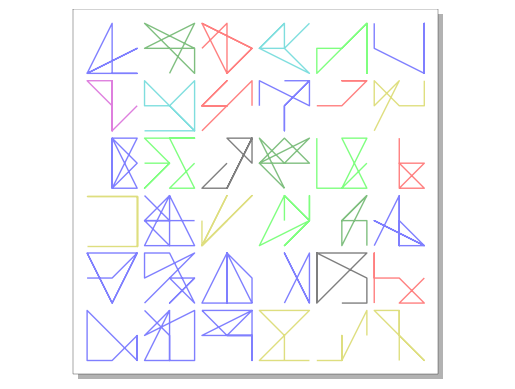

In [47]:
#A-2-1
import vsketch
import numpy as np
from numpy.random import choice, uniform
from random import gauss

# ---------------------------------------------------
# normal sampler (你原来用 t_normal，这里我补成正常函数)
# ---------------------------------------------------
def t_normal(low, high, mean, sd):
    """生成一个截断正态分布的整数"""
    while True:
        v = gauss(mean, sd)
        if low <= v <= high:
            return int(v)

# ---------------------------------------------------
# Glyph generator
# ---------------------------------------------------
def grid_glyph():
    pts = []
    n = t_normal(6, 12, 10, 2)
    for i in range(n):
        x = choice([-0.5, 0, 0.5])
        y = choice([-0.5, 0, 0.5])
        pts.append([x, y])
    return pts

# ---------------------------------------------------
# PAGE + GRID SETTINGS
# ---------------------------------------------------
page_width  = 210
page_height = 210

# margins (mm)
margin_left   = 8
margin_right  = 8
margin_top    = 8
margin_bottom = 8   # bottom larger

grid_cols = 6
grid_rows = 6

# gutter 12pt → mm
gutter_pt = 12
gutter_mm = gutter_pt * 25.4 / 72.0   # 12pt ≈ 4.233 mm

# calculate cell size inside margins + gutters
cell_width  = (page_width  - margin_left - margin_right - gutter_mm*(grid_cols-1)) / grid_cols
cell_height = (page_height - margin_top  - margin_bottom - gutter_mm*(grid_rows-1)) / grid_rows

# glyph scale relative to cell (reduces by pen thickness)
scale_factor = 1   # 实际 glyph 占 cell 的比例，也可以调得更大
scale_x = cell_width  * scale_factor
scale_y = cell_height * scale_factor

# ---------------------------------------------------
# vsketch init
# ---------------------------------------------------
vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")

# ---------------------------------------------------
# DRAW THE GRID
# ---------------------------------------------------
for row in range(grid_rows):
    for col in range(grid_cols):

        glyph = grid_glyph()

        # cell origin (top-left)
        ox = margin_left + col*(cell_width + gutter_mm)
        oy = margin_top  + row*(cell_height + gutter_mm)

        with vsk.pushMatrix():
            # 随机笔色
            vsk.stroke(int(uniform(1, 10)))

            # 移动到 cell 左上角
            vsk.translate(ox, oy)

            # 居中 glyph
            vsk.translate(
                (cell_width - scale_x) / 2,
                (cell_height - scale_y) / 2
            )

            # 缩放 glyph
            vsk.scale(scale_x, scale_y)

            # 绘制
            vsk.polygon(glyph)

vsk.display()
vsk.save("A-2-01.svg")

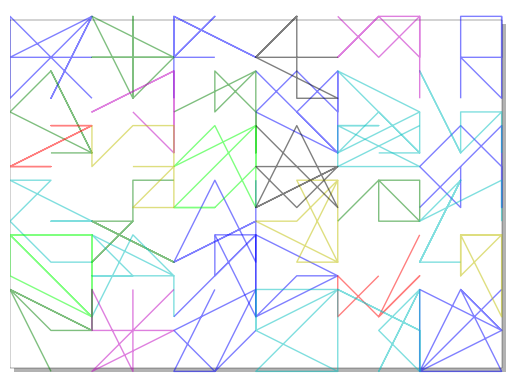

In [13]:
#A-2-2
def grid_glyph():
    pts = []
    for i in range(int(t_normal(6, 12, 10, 2))):
        x = (choice([-0.5, 0, 0.5]))
        y = (choice([-0.5, 0, 0.5]))
        pts.append([x, y])
    return pts
    
width = 297
height = 210
grid_size = 6
pen_size = 1

cell_size_x = width / grid_size
cell_size_y = width / grid_size / 3 * 2

scale_val = width / grid_size

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

vsk.penWidth(f"{pen_size}mm")
vsk.strokeWeight(1)

for i in range(grid_size):
    for j in range(grid_size):
            glyph = grid_glyph()
            with vsk.pushMatrix():
                stroke_pen = int(uniform(1,10))
                vsk.stroke(stroke_pen)
                vsk.translate(i * cell_size_x, j * cell_size_y)
                vsk.scale(scale_val_x, scale_val_y)
                
                vsk.polygon(glyph)           
vsk.display()
vsk.save("A-2-02.svg")

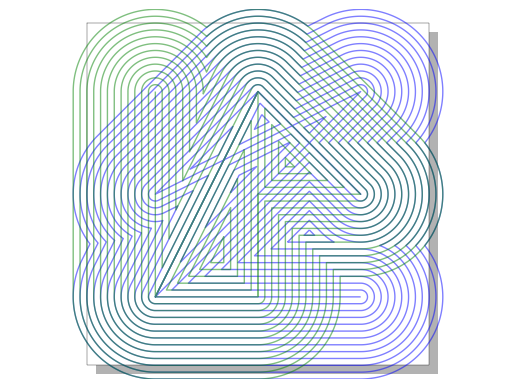

In [111]:
#A-3-1
def grid_glyph():
    pts = []
    for i in range(int(t_normal(8, 12, 10, 2))):
        x = (choice([-0.5, 0, 0.5]))
        y = (choice([-0.5, 0, 0.5]))
        pts.append([x, y])
    return pts
    
width = 100
height = 100
grid_size = 1
pen_size = 2

cell_size_x = width / grid_size
scale_val = (width / grid_size) * 0.6

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

vsk.penWidth(f"{pen_size}mm")
vsk.strokeWeight(int(cell_size_x / pen_size / 2))

for i in range(2):
            glyph = grid_glyph()
            with vsk.pushMatrix():
                stroke_pen = i+1
                vsk.stroke(stroke_pen)
                vsk.scale(scale_val, scale_val)
                vsk.polygon(glyph)           
vsk.display()
vsk.save("A-3-05.svg")

# A-1-2
* Points N ∈ [4,12] (μ≈8); x,y ∈ {−0.5,0,0.5}; angle set {k·45° | k=0..7}.
* Canvas 100×100 mm; 8×8 grid; glyph width ≈ 7.5 mm; leading = 12.5 mm, column spacing = 12.5 mm.
* Overdraw ×8 with 2 mm penWidth; pen ∈ {1,2,3,4}.
* Layout = **fixed grid (column-major)**; no variable width, no line wrapping.

# B

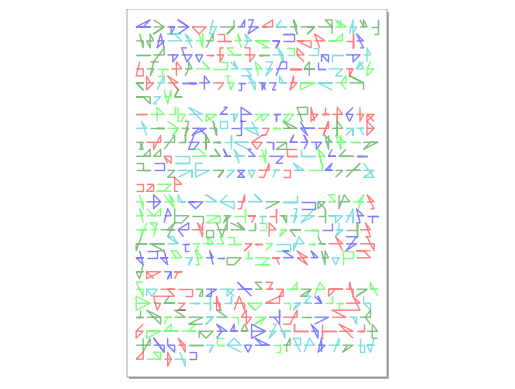

In [69]:
#B-1-1
def baseline_glyph_varwidth(n=10, width=1.0):
    pts = [[0, 0], [width, 0]]
    for i in range(n):
        x = (choice([-0.5, 0, 0.5])) * width + width/2
        y = (choice([-0.5, 0, 0.5])) 
        pts.append([x, y])
    return pts

# ---- page + drawing params ----
width = 297
height = 420
page_margin = 10

pen_width = 1
stroke_w = 2

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")
vsk.penWidth(f"{pen_width}mm")
vsk.strokeWeight(1)

em_width = 16
em_height = 16
line_height = 16
kerning = 4

# ---- block grid ----
cols = 1
rows = 4
gutter = 0  # spacing between blocks

avail_w = width - 2 * page_margin
avail_h = height - 2 * page_margin
block_w = (avail_w - (cols - 1) * gutter) / cols
block_h = (avail_h + (rows - 1) * gutter) / rows

def draw_block(x0, y0, w, h):
    current_x = 0
    current_y = 0

    # generate widths for this block (enough to fill typical block)
    glyph_count = 95
    glyph_widths = [choice([0.5, 1, 0.75], p=[0.5, 0.25, 0.25]) for i in range(glyph_count)]

    for width_factor in glyph_widths:
        glyph = baseline_glyph_varwidth(random.randrange(3, 4), width_factor)
        g_width = em_width * width_factor

        if current_x + g_width > (w):
            current_x = 0
            current_y += line_height

        # stop when next line would exceed block
        if current_y + em_height > h:
            break

        with vsk.pushMatrix():
            vsk.translate(x0 + current_x, y0 + current_y + em_height)
            vsk.scale(em_width)
            vsk.stroke(choice([1, 2, 3, 4, 5]))
            vsk.polygon(glyph)

        current_x += g_width + kerning

# ---- render all blocks ----
for r in range(rows):
    for c in range(cols):
        x_origin = page_margin + c * (block_w + gutter)
        y_origin = page_margin + r * (block_h + gutter)
        draw_block(x_origin, y_origin, block_w, block_h)

vsk.display()
vsk.save("test2.svg")

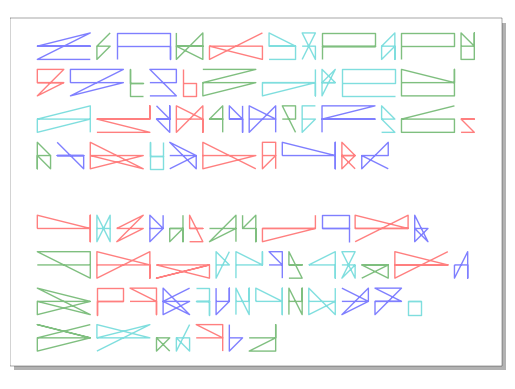

In [130]:
#B-1-2
def baseline_glyph_varwidth(n=10, width=1.0):
    pts = [[0, 0], [width, 0]]
    for i in range(n):
        x = (choice([-0.5, 0, 0.5])) * width + width/2
        y = (choice([-0.5, 0, 0.5])) 
        pts.append([x, y])
    return pts

def grid_glyph_norepeat_3x2(k=4, xs=(-0.5, 0.5), ys=(-0.5, 0, 0.5)):
    all_pts = [(x, y) for x in xs for y in ys] 
    if k > len(all_pts):
        raise ValueError(f"k={k} exceeds the number of available unique points {len(all_pts)}")
    picked = sample(all_pts, k) 
    return [list(p) for p in picked]

from random import sample, choice

def baseline_glyph_varwidth_norepeat(
    k=4,                       # 想要多少个“上方”控制点
    width=1.0,
    xs=(-0.5, 0.5),           # 和 grid_glyph_norepeat_3x2 一样的 2×3 网格
    ys=(-0.5, 0.0, 0.5),
):
    """
    生成一条 baseline + 若干不重复的控制点：
    - baseline 固定为 [0,0] 到 [width,0]
    - 额外的 k 个点从 (xs × ys) 网格里无放回抽样
    """
    # 所有候选控制点（先在 [-0.5,0.5] 的单位格上，之后乘 width 再平移到宽度中心）
    all_pts = [((x * width) + width / 2.0, y) for x in xs for y in ys]

    if k > len(all_pts):
        raise ValueError(f"k={k} exceeds available unique points {len(all_pts)}")

    picked = sample(all_pts, k)  # 无放回，不重复

    # 最终折线：先 baseline，再上方点
    pts = [[0.0, 0.0], [width, 0.0]]
    pts.extend([list(p) for p in picked])
    return pts


    
# ---- page + drawing params ----
width = 297
height = 210
page_margin = 10

margin_left   = 8
margin_right  = 22
margin_top    = 8
margin_bottom = 8

pen_width = 1
stroke_w = 2

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")
vsk.penWidth(f"{pen_width}mm")
vsk.strokeWeight(1)



# ---- block grid ----
cols = 1
rows = 2
gutter_pt = 12
gutter_mm = gutter_pt * 25.4 / 72.0   # 12pt ≈ 4.233 mm

avail_w = width - margin_left - margin_right
avail_h = height - margin_bottom - margin_top

line_height = (avail_h - gutter_mm*8) / 9
em_width = 16
em_height = line_height
kerning = 4

block_w = avail_w
block_h = gutter_mm*3 + line_height*4

block_gutter = line_height + gutter_mm*2


def draw_block(x0, y0, w, h):
    current_x = 0
    current_y = 0

    # generate widths for this block (enough to fill typical block)
    glyph_count = 44
    glyph_widths = [choice([2, 1, 0.5]) for i in range(glyph_count)]

    for width_factor in glyph_widths:
        glyph = baseline_glyph_varwidth_norepeat(random.randrange(4, 6), width_factor)
        g_width = em_width * width_factor

        if current_x + g_width > (w):
            current_x = 0
            current_y += line_height + gutter_mm

        # # stop when next line would exceed block
        # if current_y + em_height > h:
        #     break

        with vsk.pushMatrix():
            vsk.translate(x0 + current_x, y0 + current_y + em_height)
            vsk.scale(em_width)
            vsk.stroke(choice([1, 2, 3, 4]))
            vsk.polygon(glyph)

        current_x += g_width + kerning

# ---- render all blocks ----
for r in range(rows):
    for c in range(cols):
        x_origin =  c * (block_w + block_gutter)
        y_origin =  r * (block_h + block_gutter)
        draw_block(x_origin, y_origin, block_w, block_h)

vsk.display()
vsk.save("test2.svg")

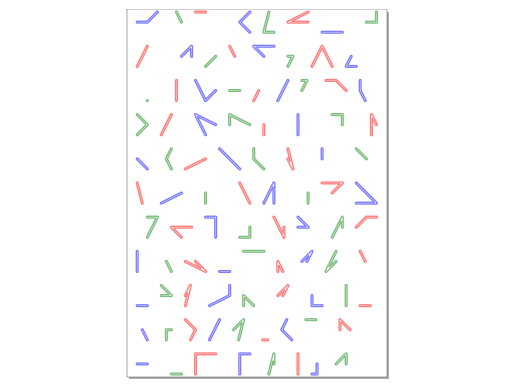

In [123]:
#B-1-3

def baseline_glyph_varwidth(n=10, width=1.0):
    pts = []
    for i in range(n):
        x = (choice([-0.5, 0, 0.5])) * width + width/2
        y = (choice([-0.5, 0, 0.5])) 
        pts.append([x, y])
    return pts
    
glyph_count = 150

glyph_widths = [
    choice([0.5, 1]) for i in range(glyph_count)
]

width = 297
height = 420
margin = 10
pen_width = 2
stroke_w = 8

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

vsk.penWidth(f"{pen_width}mm")
vsk.strokeWeight(2)
stroke_pen = 1

current_x = 0
current_y = 0

em_width = (width - margin * 2)/12
em_height = em_width
line_height = em_height + pen_width * stroke_w 
kerning = pen_width * stroke_w 

for width_factor in glyph_widths:

    glyph = baseline_glyph_varwidth(3, width_factor)
    g_width = em_width * width_factor

    if current_x + g_width > (width - margin * 2):
        current_x = 0
        current_y += line_height
    if current_y > height:
        break
    with vsk.pushMatrix():
        vsk.translate(current_x + margin, current_y + margin + em_height)
        vsk.scale(em_width)
        vsk.stroke(stroke_pen)
        vsk.polygon(glyph)
    current_x += g_width + kerning
    stroke_pen += 1
    if stroke_pen > 3:
        stroke_pen = 1
vsk.display()
vsk.save("test.svg")

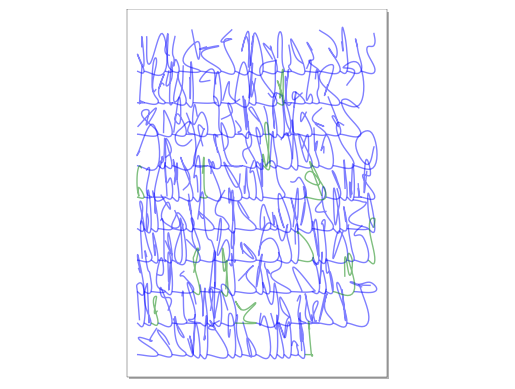

In [161]:
#B-2-1

def baseline_glyph_varwidth(n=10, width=1.0):
    pts = [[0, 0], [width, 0]]
    for i in range(n):
        pts.append([uniform(0, width), uniform(0, -2)])
    return pts


glyph_count = 190
glyph_widths = [
    choice([1, 0.333, 0.667, 1], p=[0.1, 0.5, 0.3, 0.1]) for i in range(glyph_count)
]

width = 297
height = 420
pen_width = 4
stroke_w = 6
margin = 10


vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

vsk.penWidth(f"{stroke_w*pen_width/2}mm")
# vsk.strokeWeight(2)

current_x = 0
current_y = 0

em_width = 24
em_height = 24
line_height = em_height + pen_width * stroke_w / 2
kerning = 0

for width_factor in glyph_widths:

    glyph = baseline_glyph_varwidth(random.randrange(3, 6), width_factor)
    smooth = (
        bezmerizing.Polyline(glyph)
        .augment()
        .catmull_spline(tightness=-0.5)
        .to_polyline(10)
    )

    g_width = em_width * width_factor

    if current_x + g_width > (width - margin * 2):
        current_x = 0
        current_y += line_height
    if current_y > height:
        break
    with vsk.pushMatrix():
        vsk.translate(current_x + margin, current_y + margin + em_height)
        vsk.scale(em_width)
        stroke_pen = choice([1, 2], p=[0.9,0.1])
        vsk.stroke(stroke_pen)
        vsk.polygon(smooth)
    current_x += g_width + kerning
vsk.display()
vsk.save("test2.svg")

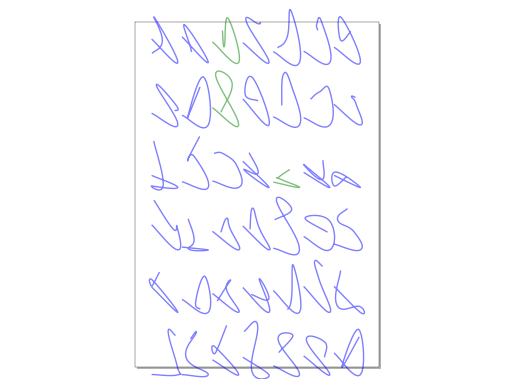

In [179]:
#B-2-2

def baseline_glyph_varwidth(n=10, width=1.0):
    pts = [[0, uniform(0, -0.5)], [width, 0]]
    for i in range(n):
        pts.append([uniform(0, width), uniform(0, -1)])
    return pts


glyph_count = 190
glyph_widths = [
    0.5 for i in range(glyph_count)
]

width = 297
height = 420
pen_width = 4
stroke_w = 6
margin = 10


vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

vsk.penWidth(f"{stroke_w*pen_width/2}mm")
# vsk.strokeWeight(2)

current_x = 0
current_y = 0

em_width = 64
em_height = 64
line_height = em_height + pen_width * stroke_w / 2
kerning = 5

for width_factor in glyph_widths:

    glyph = baseline_glyph_varwidth(random.randrange(3, 4), width_factor)
    smooth = (
        bezmerizing.Polyline(glyph)
        .augment()
        .catmull_spline(tightness=-0.5)
        .to_polyline(10)
    )

    g_width = em_width * width_factor

    if current_x + g_width > (width - margin * 2):
        current_x = 0
        current_y += line_height
    if current_y > height:
        break
    with vsk.pushMatrix():
        vsk.translate(current_x + margin, current_y + margin + em_height)
        vsk.scale(em_width)
        stroke_pen = choice([1, 2], p=[0.9,0.1])
        vsk.stroke(stroke_pen)
        vsk.polygon(smooth)
    current_x += g_width + kerning
vsk.display()
vsk.save("test2.svg")

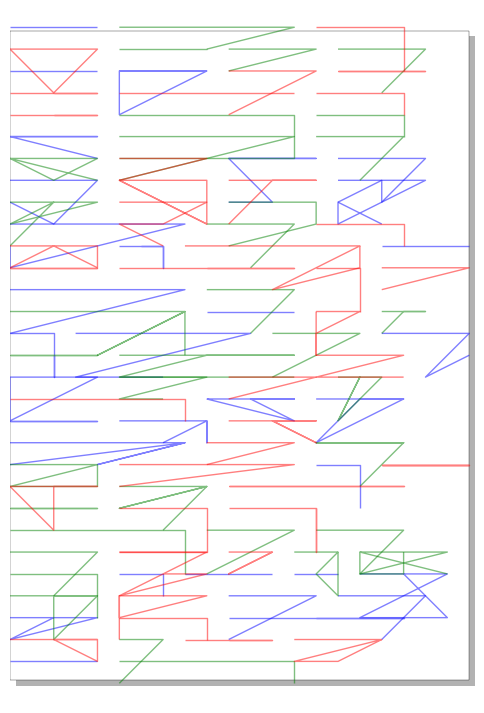

In [242]:
#B-3-1
def baseline_glyph_varwidth(n=10, width=1.0):
    pts = [[0, 0], [width, 0]]
    for i in range(n):
        x = (choice([-0.5, 0, 0.5])) * width + width/2
        y = (choice([1, 0, 0.5])) 
        pts.append([x, y])
    return pts

glyph_count = 140
glyph_widths = [choice([4, 2, 1], p=[0.2, 0.7, 0.1]) for i in range(glyph_count)]

width = 210
height = 297

margin = 0

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

current_x = 0
current_y = 0

em_width = 20 
em_height = 20 
line_height = em_height / 2
kerning = 10

for width_factor in glyph_widths:

    glyph = baseline_glyph_varwidth(choice([3, 1]), width_factor)

    g_width = em_width * width_factor

    if current_x + g_width > (width - margin*2):
        current_x = 0
        current_y += line_height
    if current_y > height:
        break
    with vsk.pushMatrix():

        vsk.translate(current_x + margin, current_y + em_height)

        vsk.scale(em_width)

        stroke_pen = choice([1, 2, 3])
        vsk.stroke(stroke_pen)
        vsk.polygon(glyph)

    current_x += g_width + kerning
vsk.display(fig_size=(6, 9))
vsk.save("#TYPE-B-V11.svg")

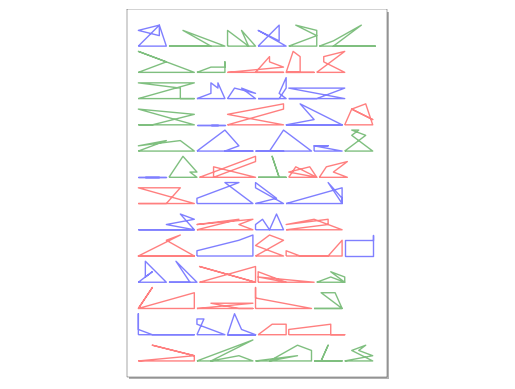

In [251]:
#B-4-1
def baseline_glyph_varwidth(n=10, width=1.0):

    pts = [[0, 0], [width, 0]]

    grid_vals = [0.0, 0.25, 0.5, 0.75, 1.0]
    x_choices = [width * g for g in grid_vals]   
    y_choices = [-g for g in grid_vals]          

    n = max(1, int(n))  

    for i in range(n):
        if i == n - 1:

            pts.append([0, 0])
        else:

            x = choice(x_choices)
            y = choice(y_choices)*3
            pts.append([x, y])

    return pts

glyph_count = 64
glyph_widths = [choice([8, 4], p=[0.5, 0.5]) for i in range(glyph_count)]

width = 297
height = 420

margin = 7

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

vsk.penWidth("1.5mm")
vsk.strokeWeight(1)

current_x = 0
current_y = 0

em_width = 8 
em_height = 16 
line_height = 30 
kerning = 3 

for width_factor in glyph_widths:

    glyph = baseline_glyph_varwidth(random.randrange(4, 6), width_factor)

    g_width = em_width * width_factor

    if current_x + g_width > (width - margin*2):
        current_x = 0
        current_y += line_height
    if current_y > height:
        break
    with vsk.pushMatrix():

        vsk.translate(current_x + margin, current_y + margin + em_height)

        vsk.scale(em_width)

        stroke_pen = choice([1, 2, 3])
        vsk.stroke(stroke_pen)

        vsk.polygon(glyph)

    current_x += g_width + kerning
vsk.display()

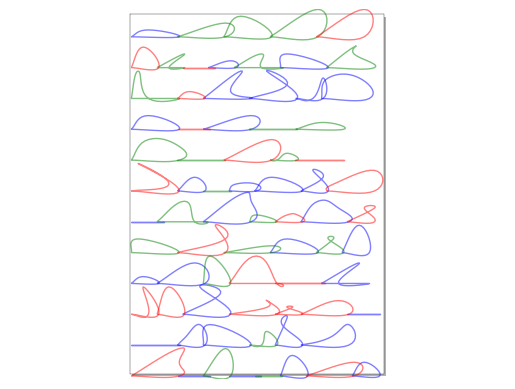

In [249]:
#B-4-2
def baseline_glyph_varwidth(n=10, width=1.0):

    pts = [[-1, 0], [width, 0]]

    grid_vals = [0.0, 0.25, 0.5, 0.75, 1.0]
    x_choices = [width * g for g in grid_vals]   
    y_choices = [-g for g in grid_vals]          

    n = max(1, int(n))  

    for i in range(n):
        if i == n - 1:

            pts.append([-1, 0])
        else:

            x = choice(x_choices)
            y = choice(y_choices)*4
            pts.append([x, y])

    return pts

glyph_count = 80
glyph_widths = [choice([3, 6], p=[0.5, 0.5]) for i in range(glyph_count)]

width = 297
height = 420

margin = 7

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

vsk.penWidth("1.5mm")
vsk.strokeWeight(1)

current_x = 0
current_y = 0

em_width = 8 
em_height = 20 
line_height = 36 
kerning = 6 

for width_factor in glyph_widths:

    glyph = baseline_glyph_varwidth(random.randrange(2, 4), width_factor)

    g_width = em_width * width_factor

    if current_x + g_width > (width - margin*2):
        current_x = 0
        current_y += line_height
    if current_y > height:
        break
    with vsk.pushMatrix():

        vsk.translate(current_x + margin, current_y + margin + em_height)

        vsk.scale(em_width)

        stroke_pen = choice([1, 2, 3])
        vsk.stroke(stroke_pen)
        smooth = (
            bezmerizing.Polyline(glyph)
            .augment()
            .catmull_spline(tightness=-0.5)
            .to_polyline(10)
        )
        vsk.polygon(smooth)

    current_x += g_width + kerning
vsk.display()

# C

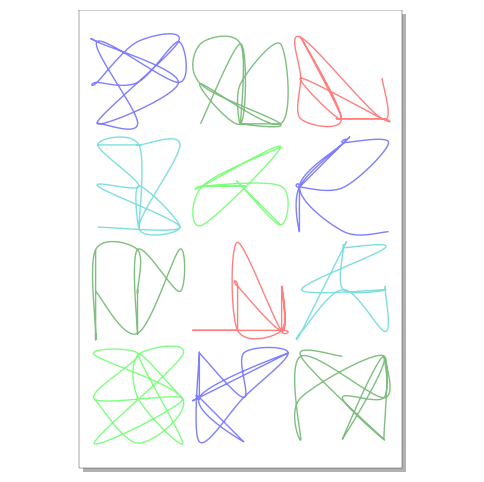

In [472]:
#C-1-1
import vsketch
import bezmerizing
import numpy as np
from numpy.random import choice

# -------------------------------------------------------
# glyph generator
# -------------------------------------------------------
def grid_glyph():
    pts = []
    for _ in range(14):
        x = choice([-0.5, 0, 0.5])
        y = choice([-0.5, 0, 0.5])
        pts.append([x, y])
    return pts


# -------------------------------------------------------
# PAGE + GRID SETTINGS
# -------------------------------------------------------
page_width  = 210
page_height = 297

margin_left   = 8
margin_right  = 8
margin_top    = 8
margin_bottom = 22

grid_cols = 3
grid_rows = 4

# gutter 12pt → mm
gutter_mm = 12 * 25.4 / 72.0    # ≈ 4.233 mm

# compute cell sizes
cell_width  = (page_width  - margin_left - margin_right 
               - gutter_mm*(grid_cols-1)) / grid_cols

cell_height = (page_height - margin_top - margin_bottom 
               - gutter_mm*(grid_rows-1)) / grid_rows

# glyph scale factor inside cell
scale_factor = 1


# -------------------------------------------------------
# vsketch setup
# -------------------------------------------------------
vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")
vsk.penWidth("1mm")
vsk.strokeWeight(1)


# -------------------------------------------------------
# DRAW GRID
# -------------------------------------------------------
stroke_pen = 1

for row in range(grid_rows):
    for col in range(grid_cols):

        # --- generate & smooth glyph ---
        glyph = grid_glyph()
        smooth = (
            bezmerizing.Polyline(glyph)
            .augment()
            .catmull_spline(tightness=0)
            .to_polyline(30)
        )

        smooth = np.array(smooth)

        # --- compute glyph bbox (unit coords) ---
        minx, miny = smooth.min(axis=0)
        maxx, maxy = smooth.max(axis=0)
        gw = maxx - minx
        gh = maxy - miny

        # scale glyph to cell
        sx = cell_width  * scale_factor / gw
        sy = cell_height * scale_factor / gh
        scale_val = min(sx, sy)

        # --- cell origin ---
        ox = margin_left + col * (cell_width + gutter_mm)
        oy = margin_top  + row * (cell_height + gutter_mm)

        with vsk.pushMatrix():
            vsk.stroke(stroke_pen)

            # move to cell origin
            vsk.translate(ox, oy)

            # center glyph inside the cell
            vsk.translate(
                (cell_width  - scale_val * gw) / 2,
                (cell_height - scale_val * gh) / 2
            )

            # scale and shift glyph
            vsk.scale(scale_val)
            vsk.translate(-minx, -miny)

            # draw
            vsk.polygon(smooth)

        stroke_pen += 1
        if stroke_pen > 5:
            stroke_pen = 1

vsk.display(fig_size=(6, 6))
vsk.save("C-1-03.svg")

C:\Users\Shun\AppData\Local\Temp\ipykernel_22684\867155672.py:79: RuntimeWarning: divide by zero encountered in scalar divide
  sx = cell_width  / gw


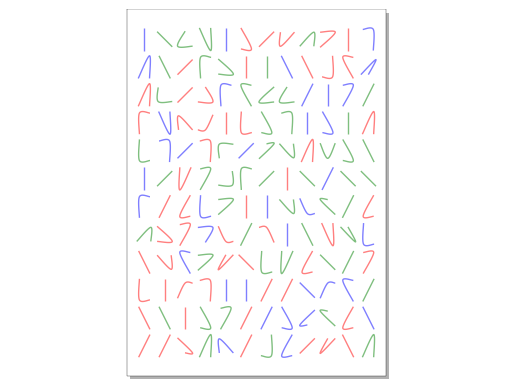

In [599]:
#C-1-2
import vsketch
import bezmerizing
import numpy as np
from random import sample, choice
import math

# -------------------------------------------------------
# Glyph generator
# -------------------------------------------------------
ALL_CELLS = [(x, y) for x in (-0.5, 0, 0.5) for y in (-0.5, 0.5)]

def grid_glyph():
    """Pick 2~3 pts from a 3×2 grid but must span both rows."""
    while True:
        pts = sample(ALL_CELLS, choice([2, 3]))
        rows = {y for _, y in pts}
        if len(rows) == 2:
            return [list(p) for p in pts]


# -------------------------------------------------------
# PAGE + GRID SETTINGS (专业排版系统)
# -------------------------------------------------------
page_width  = 210   # mm
page_height = 297   # mm

margin_left   = 8
margin_right  = 8
margin_top    = 8
margin_bottom = 22

grid_cols = 12
grid_rows = 12

# gutter 12pt → mm
gutter_mm = 12 * 25.4 / 72.0    # = 4.233 mm

# --- 每格尺寸 ---
cell_width  = (page_width  - margin_left - margin_right - (grid_cols - 1)*gutter_mm) / grid_cols
cell_height = (page_height - margin_top  - margin_bottom - (grid_rows - 1)*gutter_mm) / grid_rows


# -------------------------------------------------------
# vsketch init
# -------------------------------------------------------
vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")

vsk.penWidth("1mm")
vsk.strokeWeight(1)


# -------------------------------------------------------
# DRAW — 每个 glyph 强行填满 cell
# -------------------------------------------------------
for r in range(grid_rows):
    for c in range(grid_cols):

        glyph = grid_glyph()
        stroke_pen = choice([1, 2, 3])

        # spline → smooth
        smooth = (
            bezmerizing.Polyline(glyph)
            .augment()
            .catmull_spline(tightness=0)
            .to_polyline(40)
        )
        pts = np.array(smooth)

        # --- Fit glyph into cell (强行 scale to cell) ---
        minx, miny = pts.min(axis=0)
        maxx, maxy = pts.max(axis=0)
        gw = maxx - minx
        gh = maxy - miny

        sx = cell_width  / gw
        sy = cell_height / gh
        scale_val = min(sx, sy)

        with vsk.pushMatrix():
            vsk.stroke(stroke_pen)

            # 1) 移到 cell 左上
            ox = margin_left + c*(cell_width + gutter_mm)
            oy = margin_top  + r*(cell_height + gutter_mm)
            vsk.translate(ox, oy)

            # 2) 居中 （可调为 baseline / top-align）
            vsk.translate(
                (cell_width  - gw * scale_val) / 2,
                (cell_height - gh * scale_val) / 2
            )

            # 3) scale
            vsk.scale(scale_val)

            # 4) 移回点的最小值
            vsk.translate(-minx, -miny)

            # 5) draw
            vsk.polygon(pts)

# -------------------------------------------------------
vsk.display()
vsk.save("C-1-03.svg")

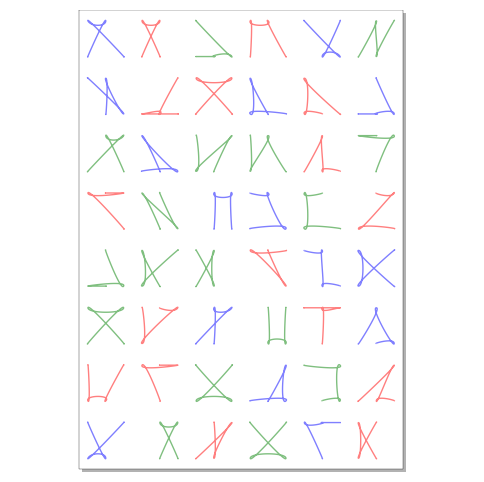

In [26]:
#C-1-3
import random

ALL_CELLS = [(x, y) for x in (-0.5, 0, 0.5) for y in (-0.5, 0.5)]

def grid_glyph():
    while True:
        cells = ALL_CELLS[:]          # copy
        random.shuffle(cells)         # no sample()
        pts = cells[:4]               # first 3 are distinct
        if len({y for _, y in pts}) == 2:   # use both rows
            return pts

    
width = 297
height = 420
grid_x = 6
grid_y = 8

cell_size_x = width / grid_x
cell_size_y = height / grid_y

scale_val = (width / grid_x) * 0.66

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

vsk.penWidth("1mm")
vsk.strokeWeight(1)
stroke_pen = 1

for i in range(grid_x):
    for j in range(grid_y):
        glyph = grid_glyph()
        stroke_pen = choice([1, 2, 3])
        smooth = (
            bezmerizing.Polyline(glyph)
            .augment()
            .catmull_spline(tightness=2)
            .to_polyline(30)
        )
        with vsk.pushMatrix():
            vsk.stroke(stroke_pen)
            vsk.translate(i * cell_size_x, j * cell_size_y)
            vsk.scale(scale_val_x, scale_val_y)
            vsk.polygon(smooth)
vsk.display(fig_size=(6, 6))
vsk.save("C-1-3.svg")

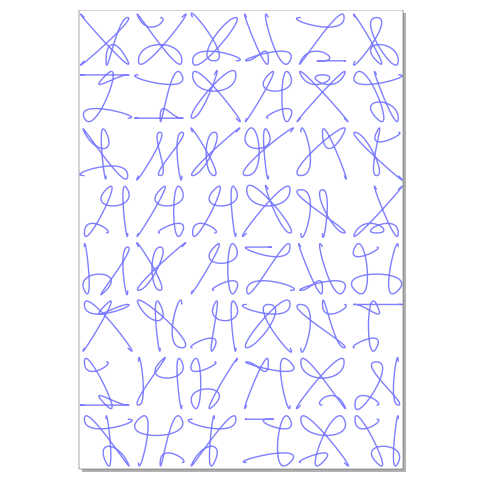

In [38]:
#C-1-4
ALL_CELLS = [(x, y) for x in (-0.5, 0, 0.5) for y in (-0.5, 0.5)]

def grid_glyph():
    while True:
        cells = ALL_CELLS[:]          # copy
        random.shuffle(cells)         # no sample()
        pts = cells[:5]               # first 3 are distinct
        if len({y for _, y in pts}) == 2:   # use both rows
            return pts

    
width = 297
height = 420
grid_x = 6
grid_y = 8

cell_size_x = width / grid_x
cell_size_y = height / grid_y

scale_val = (width / grid_x) * 0.8

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

vsk.penWidth("1mm")
vsk.strokeWeight(1)
stroke_pen = 1

for i in range(grid_x):
    for j in range(grid_y):
        glyph = grid_glyph()
        stroke_pen = choice([1])
        smooth = (
            bezmerizing.Polyline(glyph)
            .augment()
            .catmull_spline(tightness=4)
            .to_polyline(30)
        )
        with vsk.pushMatrix():
            vsk.stroke(stroke_pen)
            vsk.translate(i * cell_size_x, j * cell_size_y)
            vsk.scale(scale_val_x, scale_val_y)
            vsk.polygon(smooth)
vsk.display(fig_size=(6, 6))
# vsk.save("C-1-3.svg")

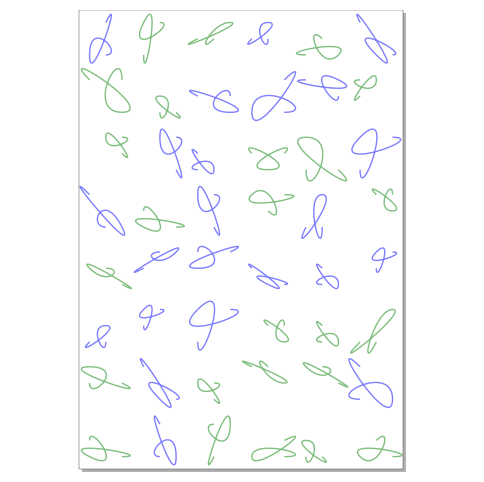

In [30]:
#C-1-5
ALL_CELLS = [(x, y) for x in (-0.5,0, 0.5) for y in (-0.5,0, 0.5)]

def grid_glyph():
    while True:
        cells = ALL_CELLS[:]          # copy
        random.shuffle(cells)         # no sample()
        pts = cells[:choice([3])]               # first 3 are distinct
        if len({y for _, y in pts}) == 2:   # use both rows
            return pts
    
width = 297
height = 420
grid_x = 6
grid_y = 8

cell_size_x = width / grid_x
cell_size_y = height / grid_y

scale_val = (width / grid_x) * 0.6

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

vsk.penWidth("1mm")
vsk.strokeWeight(1)
stroke_pen = 1

for i in range(grid_x):
    for j in range(grid_y):
        glyph = grid_glyph()
        stroke_pen = choice([1,2])
        smooth = (
            bezmerizing.Polyline(glyph)
            .augment()
            .catmull_spline(tightness=8)
            .to_polyline(30)
        )
        with vsk.pushMatrix():
            vsk.stroke(stroke_pen)
            vsk.translate(i * cell_size_x, j * cell_size_y)
            vsk.scale(scale_val_x, scale_val_y)
            vsk.polygon(smooth)
vsk.display(fig_size=(6, 6))
vsk.save("C-1-3.svg")

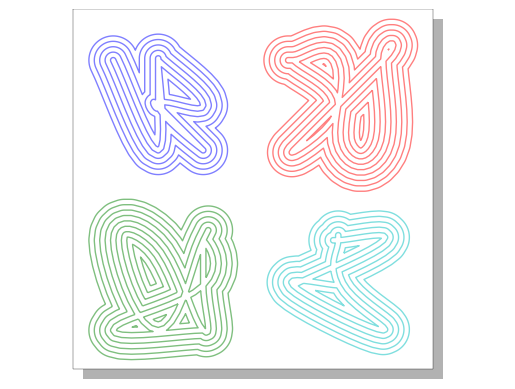

In [377]:
#C-2-1
def grid_glyph():
    pts = []
    for i in range(int(t_normal(4, 12, 10, 2))):
        x = (choice([-0.5, 0, 0.5]))
        y = (choice([-0.5, 0, 0.5]))
        pts.append([x, y])
    return pts
    
width = 100
height = 100
grid_size = 2

cell_size_x = width / grid_size
cell_size_y = height / grid_size

scale_val = (width / grid_size) * 0.5

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

vsk.penWidth("1.5mm")
vsk.strokeWeight(10)
stroke_pen = 1

for i in range(grid_size):
    for j in range(grid_size):
        glyph = grid_glyph()
        smooth = (
            bezmerizing.Polyline(glyph)
            .augment()
            .catmull_spline(tightness=-0.5)
            .to_polyline(10)
        )
        with vsk.pushMatrix():
            vsk.stroke(stroke_pen)
            vsk.translate(i * cell_size_x, j * cell_size_y)
            vsk.scale(scale_val_x, scale_val_y)
            vsk.polygon(smooth)
        stroke_pen += 1
vsk.display()

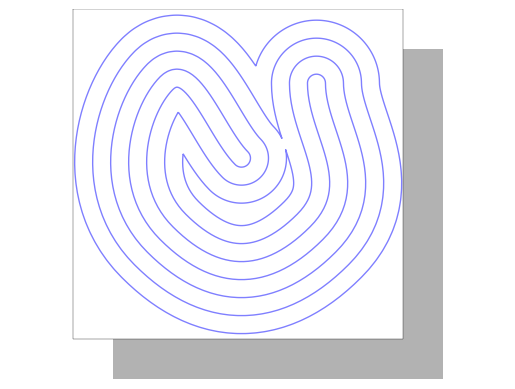

In [248]:
#C-2-2
# def grid_glyph():
#     pts = []
#     for i in range(5):
#         x = (choice([-0.5, 0.5]))
#         y = (choice([-0.5, 0.5]))
#         pts.append([x, y])
#     return pts

# def grid_glyph():
#     return [
#         [-0.5, -0.5],
#         [-0.5,  0.5],
#         [ 0.5,  0.5],
#         [ 0.5, -0.5],
#         [ -0.5, -0.5],
#     ]

# def grid_glyph():
#     return [
#         [-0.7, 0],
#         [-0.5, 0.55],
#         [0.5, 0.5],
#         [0.5, -0.5],
#         [-0.5, -0.55],
#         [-0.7, 0],
#     ]

# def grid_glyph():
#     return [
#         [-0.5, -0.5],
#         [-0.5,  0.5],
#         [ 0.5,  0.5],
#         [ 0.5, -0.5],
#     ]

# def grid_glyph():
#     return [
#         [-0.7, 0],
#         [-0.5,  0.6],
#         [ 0.5,  0.5],
#         [ -0.5, -0.5],
#         [-0.7, 0],
#     ]

def grid_glyph():
    return [
        [0, 0],
        [-0.5, -0.5],
        [-0.5,  0.5],
        [ 0.5,  0.5],
        [ 0.5, -0.5],
    ]
    
width = 22
height = 22
scale_val = 10

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

vsk.penWidth("1.2mm")
vsk.strokeWeight(8)

for i in range(1):
    glyph = grid_glyph()
    smooth = (
        bezmerizing.Polyline(glyph)
        .augment()
        .catmull_spline(-1)
        .to_polyline(30)
    )
    with vsk.pushMatrix():
        stroke_pen = i+1
        vsk.stroke(stroke_pen)
        vsk.scale(scale_val_x, scale_val_y)
        vsk.polygon(smooth)
            
vsk.display()
vsk.save("C-2-02.svg")

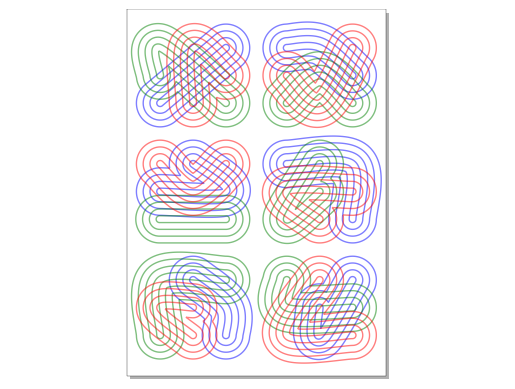

In [255]:
#E-1-1

import random
from random import sample
import numpy as np
import bezmerizing
import vsketch

# --- Page + layout settings ---
page_width  = 210  # mm
page_height = 297  # mm

# Margins
margin_left   = 5
margin_right  = 5
margin_top    = 5
margin_bottom = 15

rows, cols = 3, 2

# Gutter: 12 pt → mm
gutter_mm = 15 * 25.4 / 72.0  # ≈ 4.23mm

# Cell Size (fit perfectly into page)
cell_width = (page_width - margin_left - margin_right - (cols-1)*gutter_mm) / cols
cell_height = (page_height - margin_top - margin_bottom - (rows-1)*gutter_mm) / rows

# 3×3 grid coordinate options
values = (-0.5, 0, 0.5)
all_pts = [(x, y) for x in values for y in values]  # 9 unique nodes

# --- vsk setup ---
vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")

pen_width = 5.5  # mm physical pen
stroke_weight = 8  # determines drawn stroke thickness in vsk
vsk.penWidth(f"{pen_width}mm")
vsk.strokeWeight(stroke_weight)

# Compensation for drawing thickness (fit cell tightly)
# Cell content reduced by half physical total thickness
shrink = pen_width * stroke_weight * 0.5  # empirical scale factor
usable_w = cell_width - 2*shrink
usable_h = cell_height - 2*shrink
scale_val_x = usable_w / 1.0  # domain is [-0.5..0.5] => full width = 1
scale_val_y = usable_h / 1.0

# --- Draw the grid ---
for r in range(rows):
    for c in range(cols):
        # Randomly group 3 nodes per stroke (3 strokes per glyph)
        shuffled = sample(all_pts, len(all_pts))
        groups = [shuffled[i*3:(i+1)*3] for i in range(3)]
        
        # each cell has 3 strokes from the same shuffled grouping
        for s in range(3):
            glyph = [list(p) for p in groups[s]]  # copy raw stroke points

            # enforce endpoints pass-through
            padded = [glyph[0]] + glyph + [glyph[-1]]
            spline = (
                bezmerizing.Polyline(padded)
                .catmull_spline(tightness=0)
                .to_polyline(40)
            )
            smooth_pts = np.array(spline)
            smooth_pts[0] = glyph[0]
            smooth_pts[-1] = glyph[-1]

            with vsk.pushMatrix():
                # move into cell
                ox = margin_left + c*(cell_width + gutter_mm) + shrink
                oy = margin_top + r*(cell_height + gutter_mm) + shrink
                vsk.translate(ox, oy)

                # scale strokes to fill cell exactly
                vsk.scale(scale_val_x, scale_val_y)

                # choose pen color per stroke
                vsk.stroke(s+1)
                vsk.polygon(smooth_pts)

vsk.display()
vsk.save("E-1-2.svg")

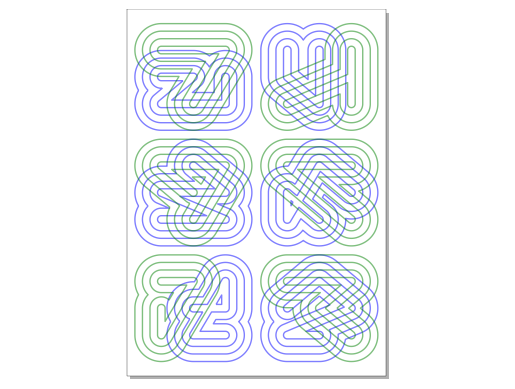

In [278]:
#C-2-3

import random
from random import sample
import numpy as np
import bezmerizing
import vsketch

# --- Page + layout settings ---
page_width  = 210  # mm
page_height = 297  # mm

# Margins
margin_left   = 5
margin_right  = 5
margin_top    = 5
margin_bottom = 15

rows, cols = 3, 2

# Gutter: 12 pt → mm
gutter_mm = 12 * 25.4 / 72.0  # ≈ 4.23mm

# Cell Size (fit perfectly into page)
cell_width = (page_width - margin_left - margin_right - (cols-1)*gutter_mm) / cols
cell_height = (page_height - margin_top - margin_bottom - (rows-1)*gutter_mm) / rows

# 3×3 grid coordinate options
values = (-0.5, 0, 0.5)
all_pts = [(x, y) for x in values for y in values]  # 9 unique nodes

# --- vsk setup ---
vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")


stroke_weight = 8  # determines drawn stroke thickness in vsk
pen_width = cell_width / 16 # mm physical pen
vsk.penWidth(f"{pen_width}mm")
vsk.strokeWeight(stroke_weight)

# Compensation for drawing thickness (fit cell tightly)
# Cell content reduced by half physical total thickness
shrink = pen_width * (stroke_weight - 0.5) * 0.5  # empirical scale factor
usable_w = cell_width - 2*shrink
usable_h = cell_height - 2*shrink
scale_val_x = usable_w / 1.0  # domain is [-0.5..0.5] => full width = 1
scale_val_y = usable_h / 1.0

# --- Draw the grid ---
for r in range(rows):
    for c in range(cols):
        # Randomly group 3 nodes per stroke (3 strokes per glyph)
        shuffled = sample(all_pts, len(all_pts))
        groups = [shuffled[i*5:(i+1)*5] for i in range(3)]
        
        # each cell has 3 strokes from the same shuffled grouping
        for s in range(2):
            glyph = [list(p) for p in groups[s]]  # copy raw stroke points

            # enforce endpoints pass-through
            padded = [glyph[0]] + glyph + [glyph[-1]]
            spline = (
                bezmerizing.Polyline(padded)
                .catmull_spline(tightness=0)
                .to_polyline(40)
            )
            smooth_pts = np.array(spline)
            smooth_pts[0] = glyph[0]
            smooth_pts[-1] = glyph[-1]

            with vsk.pushMatrix():
                # move into cell
                ox = margin_left + c*(cell_width + gutter_mm) + shrink
                oy = margin_top + r*(cell_height + gutter_mm) + shrink
                vsk.translate(ox, oy)

                # scale strokes to fill cell exactly
                vsk.scale(scale_val_x, scale_val_y)

                # choose pen color per stroke
                vsk.stroke(s+1)
                vsk.polygon(glyph)

vsk.display()
vsk.save("C-2-02.svg")

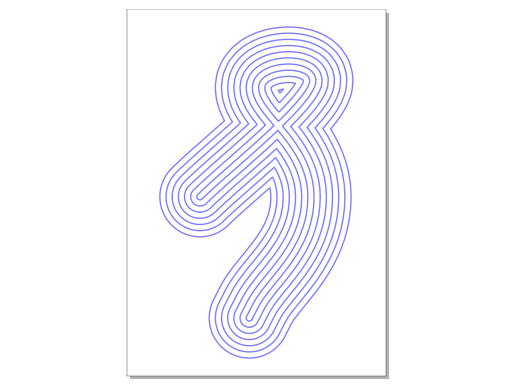

In [249]:
#C-2-4
def grid_glyph():
    pts = []
    for i in range(int(t_normal(4, 8, 6, 2))):
        x = (choice([-0.5, 0, 0.5]))
        y = (choice([-0.5, 0, 0.5]))
        pts.append([x, y])
    return pts
    
width = 210
height = 297
margin = 60

cell_size_x = width-margin*2
cell_size_y = height-margin*2

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

vsk.penWidth("5mm")
vsk.strokeWeight(14)

for i in range(1):
    glyph = grid_glyph()
    smooth = (
        bezmerizing.Polyline(glyph)
        .augment()
        .catmull_spline(tightness=-0.5)
        .to_polyline(20)
    )
    with vsk.pushMatrix():
        vsk.stroke(i+1)
        vsk.scale(cell_size_x, cell_size_y)
        vsk.polygon(smooth)
vsk.display()
vsk.save("C-2-03.svg")

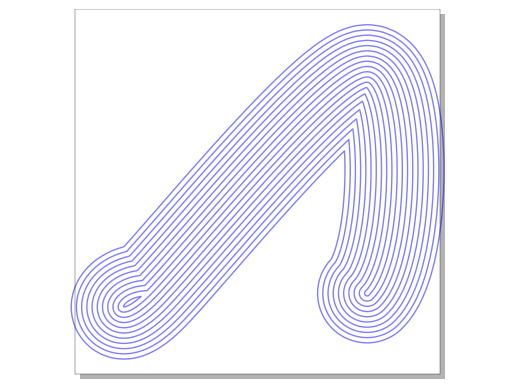

In [104]:
#C-2-5
def grid_glyph():
    pts = []
    for i in range(int(t_normal(4, 8, 6, 2))):
        x = (choice([-0.5, 0.5]))
        y = (choice([-0.5, 0.5]))
        pts.append([x, y])
    return pts
    
width = 210
height = 210
grid_size = 2

cell_size_x = width / grid_size
cell_size_y = height / grid_size

scale_val = width * 0.6 

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

vsk.penWidth("3mm")
vsk.strokeWeight(20)

for i in range(1):
    vsk.stroke(i+1)
    glyph = grid_glyph()
    
    smooth = (
        bezmerizing.Polyline(glyph)
        .catmull_spline()
        .to_polyline(40)
    )
    
    with vsk.pushMatrix():
        vsk.scale(scale_val_x, scale_val_y)
        vsk.polygon(smooth)
vsk.display()
vsk.save("C-2-04.svg")

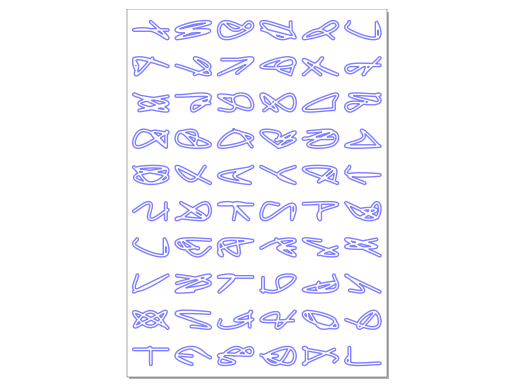

In [172]:
#C-2-6
import vsketch
import bezmerizing
import numpy as np
from numpy.random import choice, uniform
from random import gauss


# ---------------------------------------------------------
# util: truncated normal
# ---------------------------------------------------------
def t_normal(low, high, mean, sd):
    """Generate integer from truncated normal distribution"""
    while True:
        v = gauss(mean, sd)
        if low <= v <= high:
            return int(v)


# ---------------------------------------------------------
# glyph generator (same as your original logic)
# ---------------------------------------------------------
def grid_glyph():
    pts = []
    n = t_normal(6, 10, 8, 2)
    for i in range(n):
        x = choice([-0.5, 0, 0.5])
        y = choice([-0.5, 0, 0.5])
        pts.append([x, y])
    return pts


# ---------------------------------------------------------
# PAGE + GRID LAYOUT (same system as A/B/D files)
# ---------------------------------------------------------
page_w = 297
page_h = 420

margin_left   = 8
margin_right  = 8
margin_top    = 8
margin_bottom = 8

grid_cols = 6
grid_rows = 10  # your original “grid_size + 4”

# gutter = 12pt → mm
gutter_mm = 10


# final cell size
cell_w = (page_w - margin_left - margin_right - (grid_cols - 1)*gutter_mm) / grid_cols
cell_h = (page_h - margin_top - margin_bottom - (grid_rows - 1)*gutter_mm) / grid_rows

# glyph scale (relative to cell)
scale_factor_x = 1    # same meaning as your original
scale_factor_y = 0.6   # you originally used scale_val/2

pen_width = 3
# ---------------------------------------------------------
# vsketch init
# ---------------------------------------------------------
vsk = vsketch.Vsketch()
vsk.size(f"{page_w}mm", f"{page_h}mm")
vsk.scale("1mm")

vsk.penWidth(f"{pen_width}mm")
vsk.strokeWeight(2)


# ---------------------------------------------------------
# DRAW GRID
# ---------------------------------------------------------
for r in range(grid_rows):
    for c in range(grid_cols):

        glyph = grid_glyph()

        # smooth curve
        smooth = (
            bezmerizing.Polyline(glyph)
            .augment()
            .catmull_spline(tightness=-0.5)
            .to_polyline(20)
        )
        smooth = np.array(smooth)

        # ------------------------
        # Fit glyph to cell
        # ------------------------
        minx, miny = smooth.min(axis=0)
        maxx, maxy = smooth.max(axis=0)
        gw = maxx - minx
        gh = maxy - miny

        scale_x = cell_w * scale_factor_x
        scale_y = cell_h * scale_factor_y

        # ------------------------
        # Draw
        # ------------------------
        with vsk.pushMatrix():

            # move to cell
            ox = margin_left + c*(cell_w + gutter_mm)
            oy = margin_top  + r*(cell_h + gutter_mm)
            vsk.translate(ox, oy)

            # center glyph in the cell
            vsk.translate(
                (cell_w - scale_x) / 2,
                (cell_h - scale_y) / 2
            )

            # scale to cell
            vsk.scale(scale_x / gw, scale_y / gh)

            # shift glyph origin
            vsk.translate(-minx, -miny)

            # draw
            vsk.polygon(smooth)


vsk.display()
vsk.save("C-2-06.svg")

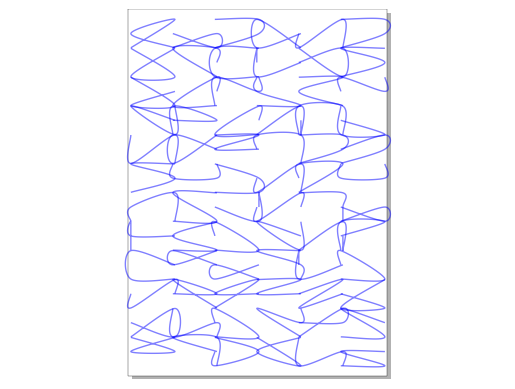

In [488]:
#C-2-7

from random import sample
import vsketch
import bezmerizing

def grid_glyph_norepeat_3x2(k=4, xs=(-0.5, 0.5), ys=(-0.5, 0.0, 0.5)):
    """
    在 2×3 网格上抽 k 个不重复点。
    xs: 2 个 x 坐标
    ys: 3 个 y 坐标
    """
    all_pts = [(x, y) for x in xs for y in ys]  # 共 6 个点
    if k > len(all_pts):
        raise ValueError(f"k={k} exceeds the number of available unique points {len(all_pts)}")
    picked = sample(all_pts, k)
    return [list(p) for p in picked]


# -----------------------------
# Page + layout settings
# -----------------------------
page_width  = 210   # mm
page_height = 297   # mm

# margins (和前面系统一致：上左右 5mm，下 15mm)
margin_left   = 5
margin_right  = 5
margin_top    = 5
margin_bottom = 15

rows, cols = 12, 6

# gutter: 12pt → mm
gutter_pt = 12
gutter_mm = gutter_pt * 25.4 / 72.0   # ≈ 4.233 mm

# cell size
cell_width  = (page_width  - margin_left - margin_right - gutter_mm * (cols - 1)) / cols
cell_height = (page_height - margin_top  - margin_bottom - gutter_mm * (rows - 1)) / rows

# glyph 在 cell 里的占比
scale_factor = 1.2
scale_x = cell_width  * scale_factor
scale_y = cell_height * scale_factor


# -----------------------------
# vsketch init
# -----------------------------
vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")

vsk.penWidth("1mm")
vsk.strokeWeight(1)


# -----------------------------
# Draw grid
# -----------------------------
for row in range(rows):
    for col in range(cols):
        # glyph 在归一化 2×3 网格坐标里（-0.5..0.5）
        glyph = grid_glyph_norepeat_3x2(k=4)

        # 平滑
        smooth = (
            bezmerizing.Polyline(glyph)
            .augment()
            .catmull_spline(tightness=0)
            .to_polyline(20)
        )

        # 当前 cell 左上角位置
        ox = margin_left + col * (cell_width + gutter_mm)
        oy = margin_top  + row * (cell_height + gutter_mm)

        with vsk.pushMatrix():
            # 先移到 cell，再在 cell 内居中
            vsk.translate(
                ox + (cell_width  - scale_x) / 2,
                oy + (cell_height - scale_y) / 2
            )
            # 把 [-0.5,0.5] 的 glyph 放大到 cell 内
            vsk.scale(scale_x, scale_y)

            vsk.polygon(smooth)

vsk.display()
vsk.save("C-2-06.svg")

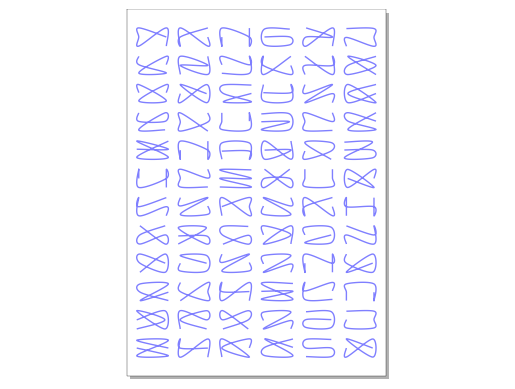

In [497]:
#C-2-8

from random import sample
import vsketch
import bezmerizing

def grid_glyph_norepeat_3x2(k=4, xs=(-0.5, 0.5), ys=(-0.5, 0.0, 0.5)):
    """
    在 2×3 网格上抽 k 个不重复点。
    xs: 2 个 x 坐标
    ys: 3 个 y 坐标
    """
    all_pts = [(x, y) for x in xs for y in ys]  # 共 6 个点
    if k > len(all_pts):
        raise ValueError(f"k={k} exceeds the number of available unique points {len(all_pts)}")
    picked = sample(all_pts, k)
    return [list(p) for p in picked]


# -----------------------------
# Page + layout settings
# -----------------------------
page_width  = 210   # mm
page_height = 297   # mm

# margins (和前面系统一致：上左右 5mm，下 15mm)
margin_left   = 8
margin_right  = 8
margin_top    = 8
margin_bottom = 22

rows, cols = 12, 6

# gutter: 12pt → mm
gutter_mm = 8

# cell size
cell_width  = (page_width  - margin_left - margin_right - gutter_mm * (cols - 1)) / cols
cell_height = (page_height - margin_top  - margin_bottom - gutter_mm * (rows - 1)) / rows

# glyph 在 cell 里的占比
scale_factor = 0.8
scale_x = cell_width  * scale_factor
scale_y = cell_height * scale_factor


# -----------------------------
# vsketch init
# -----------------------------
vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")

vsk.penWidth("1mm")
vsk.strokeWeight(1)


# -----------------------------
# Draw grid
# -----------------------------
for row in range(rows):
    for col in range(cols):
        glyph = grid_glyph_norepeat_3x2(
            k=6,
            xs=(-0.5, 0.5),
            ys=(-0.5, 0, 0.5)
        )

        # 平滑
        smooth = (
            bezmerizing.Polyline(glyph)
            .augment()
            .catmull_spline(tightness=0)
            .to_polyline(20)
        )

        pts = np.array(smooth)
        minx, miny = pts.min(axis=0)
        maxx, maxy = pts.max(axis=0)
        gw, gh = maxx - minx, maxy - miny   # glyph 原始宽高

        # ⭐ 关键：计算“拉伸”缩放因子，让它刚好填满 cell
        sx = cell_width  / gw
        sy = cell_height / gh

        # cell 左上角
        ox = margin_left + col * (cell_width + gutter_mm)
        oy = margin_top  + row * (cell_height + gutter_mm)

        with vsk.pushMatrix():
            # 先平移到 cell
            vsk.translate(ox, oy)
            # 再缩放到正好 cell 大小（允许变形）
            vsk.scale(sx, sy)
            # 把 glyph 的 bbox 左上角对齐到 cell (0,0)
            vsk.translate(-minx, -miny)

            vsk.polygon(pts)

vsk.display()
vsk.save("C-2-06.svg")

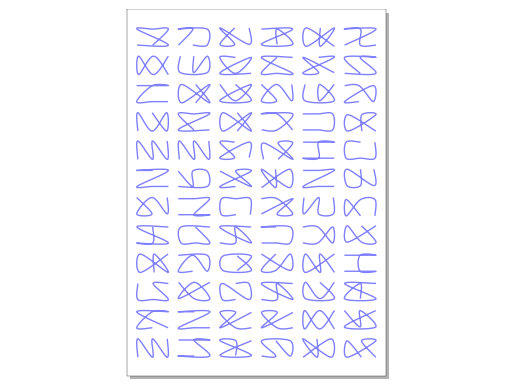

In [498]:
#C-2-9

from random import sample
import vsketch
import bezmerizing

def grid_glyph_norepeat_3x2(k=4, xs=(-0.5, 0.5), ys=(-0.5, 0.0, 0.5)):
    """
    在 2×3 网格上抽 k 个不重复点。
    xs: 2 个 x 坐标
    ys: 3 个 y 坐标
    """
    all_pts = [(x, y) for x in xs for y in ys]  # 共 6 个点
    if k > len(all_pts):
        raise ValueError(f"k={k} exceeds the number of available unique points {len(all_pts)}")
    picked = sample(all_pts, k)
    return [list(p) for p in picked]


# -----------------------------
# Page + layout settings
# -----------------------------
page_width  = 210   # mm
page_height = 297   # mm

# margins (和前面系统一致：上左右 5mm，下 15mm)
margin_left   = 8
margin_right  = 8
margin_top    = 8
margin_bottom = 22

rows, cols = 12, 6

# gutter: 12pt → mm
gutter_mm = 8

# cell size
cell_width  = (page_width  - margin_left - margin_right - gutter_mm * (cols - 1)) / cols
cell_height = (page_height - margin_top  - margin_bottom - gutter_mm * (rows - 1)) / rows

# glyph 在 cell 里的占比
scale_factor = 0.8
scale_x = cell_width  * scale_factor
scale_y = cell_height * scale_factor


# -----------------------------
# vsketch init
# -----------------------------
vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")

vsk.penWidth("1mm")
vsk.strokeWeight(1)


# -----------------------------
# Draw grid
# -----------------------------
for row in range(rows):
    for col in range(cols):
        glyph = grid_glyph_norepeat_3x2(
            k=6,
            xs=(-0.5, 0, 0.5),
            ys=(-0.5, 0.5)
        )

        # 平滑
        smooth = (
            bezmerizing.Polyline(glyph)
            .augment()
            .catmull_spline(tightness=0)
            .to_polyline(20)
        )

        pts = np.array(smooth)
        minx, miny = pts.min(axis=0)
        maxx, maxy = pts.max(axis=0)
        gw, gh = maxx - minx, maxy - miny   # glyph 原始宽高

        # ⭐ 关键：计算“拉伸”缩放因子，让它刚好填满 cell
        sx = cell_width  / gw
        sy = cell_height / gh

        # cell 左上角
        ox = margin_left + col * (cell_width + gutter_mm)
        oy = margin_top  + row * (cell_height + gutter_mm)

        with vsk.pushMatrix():
            # 先平移到 cell
            vsk.translate(ox, oy)
            # 再缩放到正好 cell 大小（允许变形）
            vsk.scale(sx, sy)
            # 把 glyph 的 bbox 左上角对齐到 cell (0,0)
            vsk.translate(-minx, -miny)

            vsk.polygon(pts)

vsk.display()
vsk.save("C-2-06.svg")

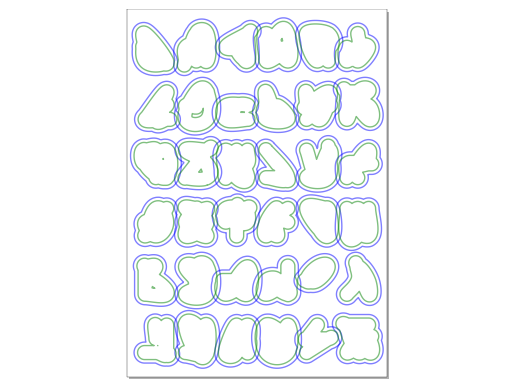

In [479]:
#C-7-1
def grid_glyph():
    pts = []
    for i in range(int(t_normal(8, 12, 10, 2))):
        x = (choice([-0.5, 0, 0.5]))
        y = (choice([-0.5, 0, 0.5]))
        pts.append([x, y])
    return pts
    
width = 297
height = 420
grid_size = 6
margin = 10

cell_size_x = (width - margin*2) / grid_size
cell_size_y = (height - margin*2) / grid_size

scale_val_x = (width / grid_size) * 0.5
scale_val_y = (height / grid_size - 7) * 0.5


vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

for i in range(grid_size):
    for j in range(grid_size):
        glyph = grid_glyph()
        smooth = (
            bezmerizing.Polyline(glyph)
            .augment()
            .catmull_spline(tightness=-0.5)
            .to_polyline(20)
        )
        with vsk.pushMatrix():
            vsk.translate(i * cell_size_x, j * cell_size_y)
            vsk.scale(scale_val_x,scale_val_y)

            vsk.stroke(1)
            vsk.penWidth("24mm")
            vsk.strokeWeight(2)
            vsk.polygon(smooth)

            vsk.stroke(2)
            vsk.penWidth("16mm")
            vsk.strokeWeight(2)
            vsk.polygon(smooth)
vsk.display()

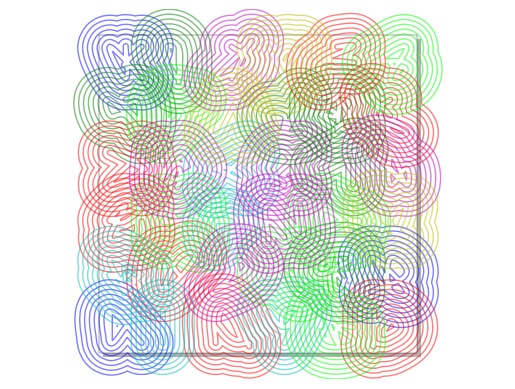

In [409]:
#C-7-2
def grid_glyph():
    pts = []
    for i in range(int(t_normal(4, 12, 8, 2))):
        x = (choice([-0.5, 0, 0.5]))
        y = (choice([-0.5, 0, 0.5]))
        pts.append([x, y])
    return pts
    
width = 210
height = 210
grid_size = 6

cell_size_x = width / grid_size
cell_size_y = height / grid_size

scale_val = (width / grid_size) * 0.6

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

vsk.penWidth("3.2mm")
vsk.strokeWeight(14)

for i in range(grid_size):
    for j in range(grid_size):
        glyph = grid_glyph()
        smooth = (
            bezmerizing.Polyline(glyph)
            .augment()
            .catmull_spline(tightness=-0.5)
            .to_polyline(10)
        )
        with vsk.pushMatrix():
            stroke_pen = choice([1, 2, 3, 4, 5, 6, 7])
            vsk.stroke(stroke_pen)
            vsk.translate(i * cell_size_x, j * cell_size_y)
            vsk.scale(scale_val_x, scale_val_y)
            vsk.polygon(smooth)
vsk.display()
vsk.save("C-1-09.svg")

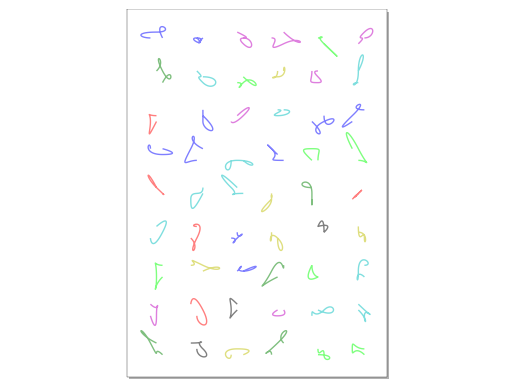

In [60]:
#C-3-1
def grid_glyph():
    pts = []
    for i in range(8):
        x = (choice([-0.5, 0, 0.5]))
        y = (choice([-0.5, 0, 0.5]))
        pts.append([x, y])
    return pts
    
width = 297
height = 420
margin = 10

grid_x = 6
grid_y = 9

cell_size_x = (width - margin*2) / grid_x 
cell_size_y = (height - margin*2) / grid_y

scale_factor = 0.3
scale_val_x = cell_size_x * scale_factor
scale_val_y = cell_size_y * scale_factor

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")
vsk.penWidth("1mm")

for i in range(grid_x):
    for j in range(grid_y):
        stroke_pen = choice([1, 2, 3, 4, 5, 6, 7, 8])
        vsk.stroke(stroke_pen)        
        tightness_val = random.uniform(-3, 3)
        glyph = grid_glyph()
        smooth = (
            bezmerizing.Polyline(glyph)
            .catmull_spline(-10)
            .to_polyline(1)
        )
        smooth1 = (
            bezmerizing.Polyline(smooth)
            .catmull_spline(-10)
            .to_polyline(100)
        )
        with vsk.pushMatrix():
            vsk.translate(i * cell_size_x, j * cell_size_y)
            vsk.scale(scale_val_x, scale_val_y)
            vsk.polygon(smooth1)
vsk.display()
vsk.save("C-3-01.svg")

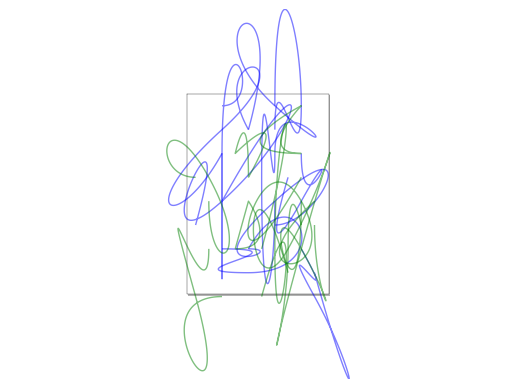

In [80]:
#C-3-2
def grid_glyph():
    pts = []
    for i in range(8):
        x = (choice([-0.5, 0, 0.5]))
        y = (choice([-0.5, 0, 0.5]))
        pts.append([x, y])
    return pts
    
width = 297
height = 420

grid_x = 5
grid_y = 4

margin = 10

cell_size_x = (width - margin*2) / grid_x 
cell_size_y = (height - margin*2) / grid_y

scale_factor = 1
scale_val_x = cell_size_x * scale_factor 
scale_val_y = cell_size_y * scale_factor

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

for i in range(grid_x):
    for j in range(grid_y):
        stroke_pen = choice([1, 1, 2, 1])
        vsk.stroke(stroke_pen)         
        
        glyph = grid_glyph()
        smooth = (
            bezmerizing.Polyline(glyph)
            .catmull_spline(-1)
            .to_polyline(1)
        )
        smooth1 = (
            bezmerizing.Polyline(smooth)
            .catmull_spline(-20)
            .to_polyline(100)
        )
        with vsk.pushMatrix():
            vsk.translate(i * cell_size_x, j * cell_size_y)
            vsk.scale(scale_val_x, scale_val_y)
            vsk.polygon(smooth1)
vsk.display()
vsk.save("C-3-02.svg")

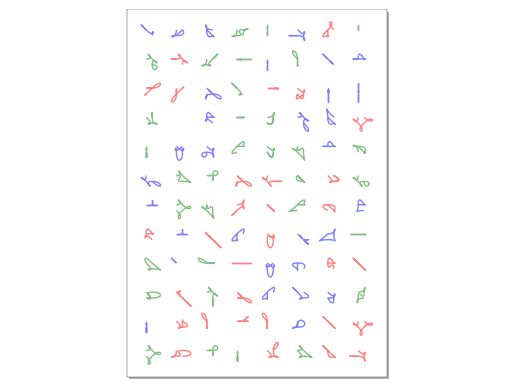

In [106]:
#C-3-3
def grid_glyph():
    pts = [[0, 0], [0, 0]]
    for i in range(4):
        x = (choice([0, 0.5]))
        y = (choice([0, 0.5]))
        pts.append([x, y])
    return pts
    
width = 297
height = 420
margin = 10

grid_x = 8
grid_y = 12

cell_size_x = (width - margin*2) / grid_x
cell_size_y = (height - margin*2) / grid_y

scale_factor = 0.4
scale_val_x = cell_size_x * scale_factor 
scale_val_y = cell_size_y * scale_factor

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

for i in range(grid_x):
    for j in range(grid_y):
        stroke_pen = choice([1, 2, 3])
        vsk.stroke(stroke_pen)     
        
        tightness_val = random.uniform(-3, 3)
        glyph = grid_glyph()
        smooth = (
            bezmerizing.Polyline(glyph)
            .catmull_spline(-10)
            .to_polyline(100)
        )
        with vsk.pushMatrix():
            vsk.translate(i * cell_size_x, j * cell_size_y)
            vsk.scale(scale_val_x, scale_val_y)
            vsk.polygon(smooth)
vsk.display()
vsk.save("C-3-04.svg")

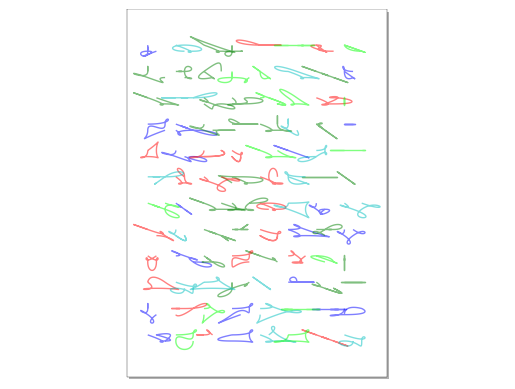

In [95]:
#C-3-4
def grid_glyph():
    pts = [[0, 0], [0, 0]]
    for i in range(4):
        x = (choice([0, 0.5, 1]))
        y = (choice([0, 0.5]))
        pts.append([x, y])
    return pts
    
width = 297
height = 420
grid_x = 8
grid_y = 12
margin = 0

cell_size = (width - margin*2) / grid_x - 5

scale_val = (width - margin*2) / grid_x * 0.4

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

for i in range(grid_x):
    for j in range(grid_y):
        stroke_pen = choice([1, 2, 3, 4, 5])
        vsk.stroke(stroke_pen)     
        
        tightness_val = random.uniform(-3, 3)
        glyph = grid_glyph()
        smooth = (
            bezmerizing.Polyline(glyph)
            .catmull_spline(-10)
            .to_polyline(100)
        )
        with vsk.pushMatrix():
            vsk.translate(i * cell_size, j * (cell_size - 2))
            vsk.scale(scale_val_x, scale_val_y)
            vsk.polygon(smooth)
vsk.display()
vsk.save("C-3-05.svg")

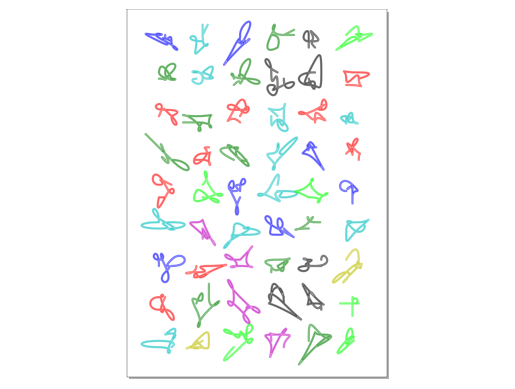

In [283]:
#C-3-5
def grid_glyph():
    pts = []
    for i in range(8):
        x = (choice([-0.5, 0, 0.5]))
        y = (choice([-0.5, 0, 0.5]))
        pts.append([x, y])
    return pts
    
width = 297
height = 420
grid_x = 6
grid_y = 9
margin = 5

cell_size = (width - margin*2) / grid_x - 5

scale_val = (width - margin*2) / grid_x * 0.3

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")
vsk.penWidth("1mm")
vsk.strokeWeight(2)

for i in range(grid_x):
    for j in range(grid_y):
        stroke_pen = choice([1, 2, 3, 4, 5, 6, 7, 8])
        vsk.stroke(stroke_pen)           
        tightness_val = random.uniform(-3, 3)
        glyph = grid_glyph()
        smooth = (
            bezmerizing.Polyline(glyph)
            .catmull_spline(-10)
            .to_polyline(100)
        )

        with vsk.pushMatrix():
            vsk.translate(i * cell_size, j * cell_size)
            vsk.scale(scale_val_x, scale_val_y)
            vsk.polygon(smooth)
vsk.display()
vsk.save("C-3-06.svg")

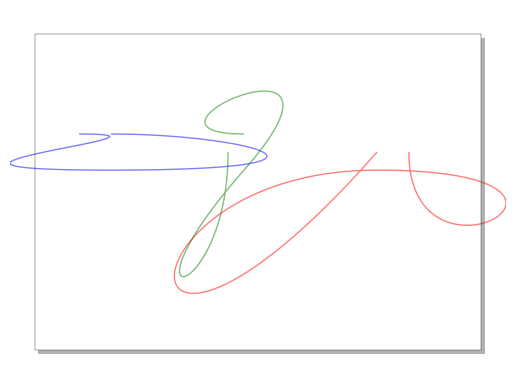

In [182]:
#C-3-6
def grid_glyph():
    pts = []
    for i in range(8):
        x = (choice([-0.5, 0, 0.5]))
        y = (choice([-0.5, 0, 0.5]))
        pts.append([x, y])
    return pts
    
width = 297
height = 210
grid_size = 3

cell_size = width / grid_size

scale_val = (width / grid_size) * 0.2

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

for i in range(3):
    vsk.stroke(i+1)
    tightness_val = random.uniform(-3, 3)
    glyph = grid_glyph()
    smooth = (
        bezmerizing.Polyline(glyph)
        .catmull_spline(1)
        .to_polyline(1)
    )
    smooth1 = (
        bezmerizing.Polyline(smooth)
        .catmull_spline(-50)
        .to_polyline(100)
    )
    with vsk.pushMatrix():
        vsk.translate(i * cell_size, 0)
        vsk.scale(scale_val_x, scale_val_y)
        vsk.polygon(smooth1)
vsk.display()
vsk.save("test.svg")

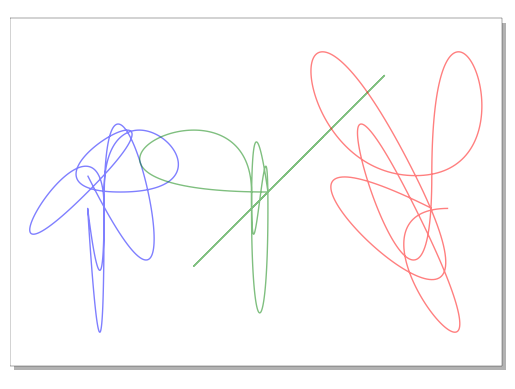

In [360]:
#C-3-7
def grid_glyph():
    pts = []
    #for i in range(8):
    for i in range(int(t_normal(10, 16, 12, 2))):
        x = (choice([-0.5, 0, 0.5]))
        y = (choice([-0.5, 0, 0.5]))
        pts.append([x, y])
    return pts
    
width = 297
height = 210
grid_size = 3

cell_size = width / grid_size

scale_val = (width / grid_size) * 0.2

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

for i in range(3):
    vsk.stroke(i+1)
    tightness_val = random.uniform(-3, 3)
    glyph = grid_glyph()
    smooth = (
        bezmerizing.Polyline(glyph)
        .catmull_spline(1)
        .to_polyline(1)
    )
    smooth1 = (
        bezmerizing.Polyline(smooth)
        .catmull_spline(-50)
        .to_polyline(100)
    )
    with vsk.pushMatrix():
        vsk.translate(i * cell_size, 0)
        vsk.scale(scale_val_x, scale_val_y)
        vsk.polygon(smooth1)
vsk.display()
vsk.save("test.svg")

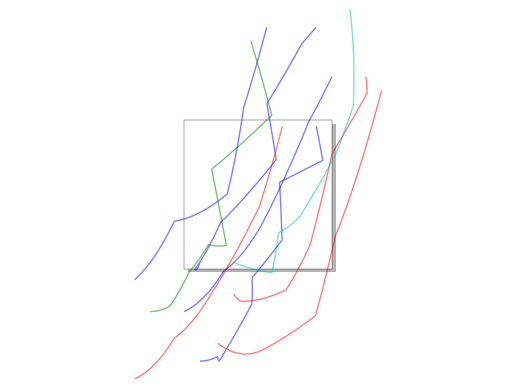

In [185]:
#C-4-1
def grid_glyph():
    pts = []
    for i in range(int(t_normal(4, 12, 6, 2))):
        x = (choice([-0.5, 0, 0.5]))
        y = (choice([-0.5, 0, 0.5]))
        pts.append([x, y])
    return pts
    
width = 100
height = 100
grid_size = 3

cell_size_x = width / grid_size
cell_size_y = height / grid_size

scale_val = (width / grid_size) * 0.6

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

for i in range(grid_size):
    for j in range(grid_size):
        glyph = grid_glyph()
        with vsk.pushMatrix():
            stroke_pen = choice([1, 2, 3, 4])
            vsk.stroke(stroke_pen)
            vsk.translate(i * cell_size_x, j * cell_size_x)
            vsk.scale(scale_val_x, scale_val_y)
            resampled = Polyline(glyph).resample(10)
            wavy = Polyline(
                resampled.vertices + np.stack(
                    [np.sin(np.linspace(0, 1, len(resampled)))*5,
                    np.cos(np.linspace(0, 2, len(resampled)))*5]).T
            )
            vsk.polygon(wavy)
vsk.display()
vsk.save("test.svg")

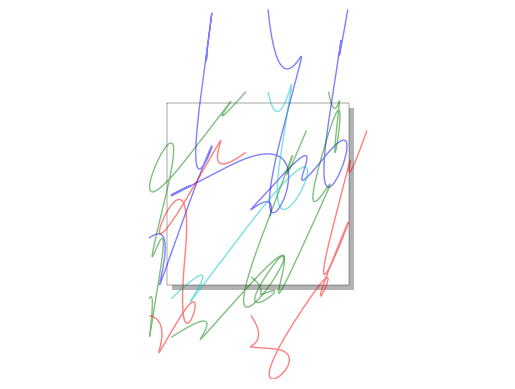

In [218]:
#C-4-2
def grid_glyph():
    pts = []
    for i in range(int(t_normal(4, 12, 6, 2))):
        x = (choice([-0.5, 0, 0.5]))
        y = (choice([-0.5, 0, 0.5]))
        pts.append([x, y])
    return pts
    
width = 100
height = 100
grid_size = 3

cell_size_x = width / grid_size
cell_size_y = height / grid_size

scale_val = (width / grid_size) * 0.6

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

for i in range(3):
    for j in range(grid_size):
        glyph = grid_glyph()
        with vsk.pushMatrix():
            stroke_pen = choice([1, 2, 3, 4])
            vsk.stroke(stroke_pen)
            vsk.translate(i * cell_size_x, j * cell_size_x)
            vsk.scale(scale_val_x, scale_val_y)
            resampled = Polyline(glyph).resample(1)
            wavy = Polyline(
                resampled.vertices + np.stack(
                    [np.sin(np.linspace(0, 1, len(resampled)))*3,
                    np.cos(np.linspace(0, 2, len(resampled)))*3]).T
            )
            curve_spline = (
                bezmerizing.Polyline(wavy)
                .augment()
                .catmull_spline(tightness=-6)
                .to_polyline(100)
            )
            vsk.polygon(curve_spline)
vsk.display()
vsk.save("test.svg")

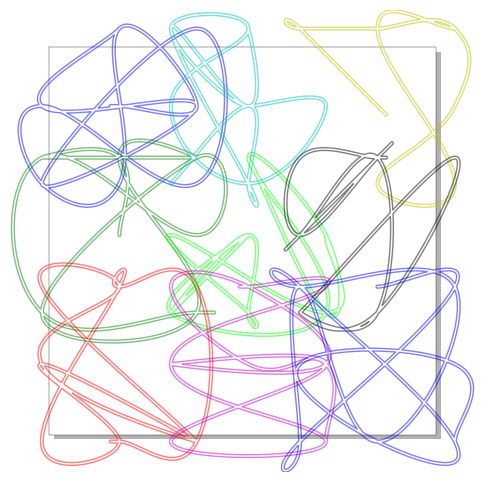

In [124]:
#C-5-1
def grid_glyph():
    pts = []
    for i in range(14):
        x = (choice([-0.5, 0, 0.5]))
        y = (choice([-0.5, 0, 0.5]))
        pts.append([x, y])
    return pts
    
width = 210
height = 210
grid_size = 3

cell_size_x = width / grid_size
cell_size_y = height / grid_size

scale_val = (width / grid_size) * 1.2

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

vsk.penWidth("1.5mm")
vsk.strokeWeight(2)
stroke_pen = 1

for i in range(grid_size):
    for j in range(grid_size):
        glyph = grid_glyph()
        smooth = (
            bezmerizing.Polyline(glyph)
            .augment()
            .catmull_spline(tightness=-0.5)
            .to_polyline(100)
        )
        with vsk.pushMatrix():
            vsk.stroke(stroke_pen)
            vsk.translate(i * cell_size_x, j * cell_size_y)
            vsk.scale(scale_val)
            vsk.polygon(smooth)
        stroke_pen += 1
vsk.display(fig_size=(6, 6))
vsk.save("C-5-03.svg")

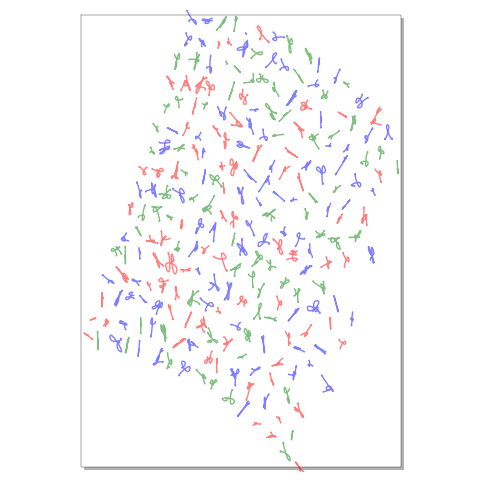

In [102]:
#C-6-1
def grid_glyph():
    pts = []
    for i in range(int(t_normal(3, 8, 4, 1))):
        x = (choice([-0.5, 0, 0.5])+normal(0, 0.1))
        y = (choice([-0.5, 0, 0.5])+normal(0, 0.1))
        pts.append([x, y])
    return pts

width = 297
height = 420

cols = 16
rows = 12

cell_size_x = 210 / cols
cell_size_y = 240 / rows

scale_factor = 0.6
scale_val_x = cell_size_x * scale_factor
scale_val_y = cell_size_y * scale_factor

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

vsk.penWidth("1mm")
vsk.strokeWeight(1)

for j in range(cols):                           
    skip = int(round(t_normal(0, 6, 0, 1)))

    limit_i = max(0, cols - min(skip, cols - 1))
    for i in range(limit_i):                        
        glyph = grid_glyph()
        smooth = (
            bezmerizing.Polyline(glyph)
            .augment()
            .catmull_spline(tightness=5)
            .to_polyline(10)
        )
        
        t = i / (cols - 1)          
        y_offset = (1 - t**2) * (cell_size_y * 6)  
        with vsk.pushMatrix():
            vsk.stroke(choice([1, 2, 3]))
            x_offset = - j * (cell_size_x / 2)
            vsk.translate(i * cell_size_x + x_offset, j * cell_size_y - y_offset)
            vsk.scale(scale_val_x, scale_val_y)
            vsk.polygon(smooth)

vsk.display(fig_size=(6, 6))
vsk.save("C-6-02.svg")

# D

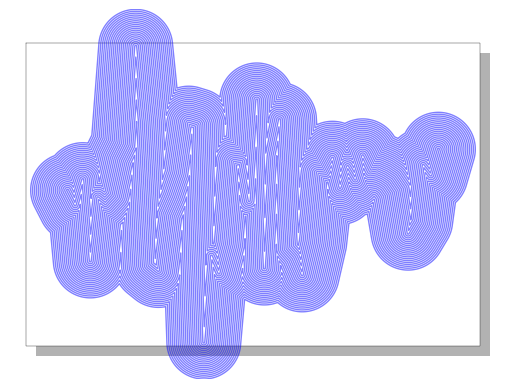

In [497]:
#D-1-1
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = normal(0, height)
        pts.append([x, y])
    return pts
    
vsk = vsketch.Vsketch()
vsk.size("120mm", "80mm")
vsk.scale("1mm")
vsk.penWidth("0.5mm")
vsk.strokeWeight(40)
pts = make_scribble(width=100, height=15, steps=50, stddev=0)
vsk.polygon(pts)
vsk.display()
vsk.save("#TYPE-E-V2.svg")

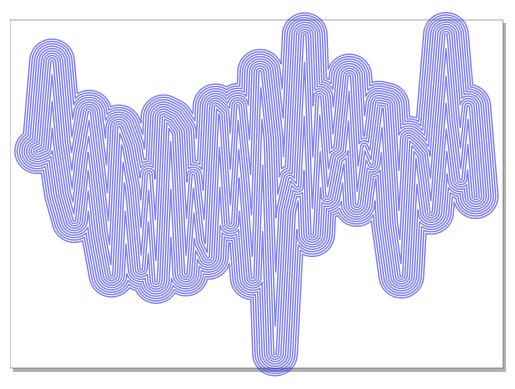

In [498]:
#D-1-2
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = normal(0, height)
        pts.append([x, y])
    return pts
    
vsk = vsketch.Vsketch()
vsk.size("420mm", "297mm")
vsk.scale("1mm")
vsk.penWidth("2mm")
vsk.strokeWeight(20)
pts = make_scribble(width=380, height=55, steps=60, stddev=0)
vsk.polygon(pts)
vsk.display()

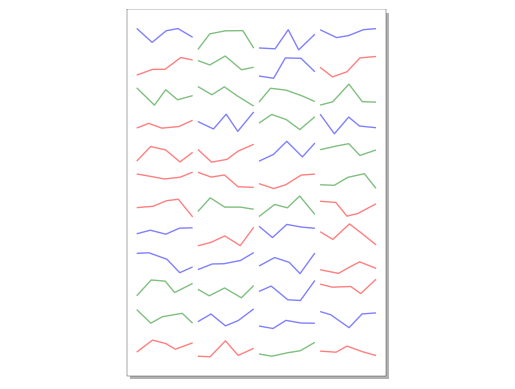

In [548]:
#D-6-1
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        base_x = (width / steps) * i

        # 第一个和最后一个点不加 stddev
        if i == 0 or i == steps - 1:
            x = base_x
        else:
            x = base_x + normal(0, stddev)

        y = uniform(-height/2, height/2)
        pts.append([x, y])
    return pts

# --- Page + layout settings ---
page_width  = 210   # mm
page_height = 297   # mm

# Margins (mm)
margin_left   = 8
margin_right  = 8
margin_top    = 8
margin_bottom = 22

rows, cols = 12, 4

# Gutter: 12 pt -> mm (1pt ≈ 0.35278 mm)
gutter_pt = 12
gutter_mm = gutter_pt * 25.4 / 72.0   # 这里=0，不过公式留着

# Cell size
cell_width = (page_width - margin_left - margin_right - gutter_mm * (cols - 1)) / cols
available_height = page_height - margin_top - margin_bottom - gutter_mm * (rows - 1)
cell_height = available_height / rows

vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")

# vsk.penWidth("1mm")
# vsk.strokeWeight(2)

# 双重循环：行 × 列（r 控制 y，c 控制 x）
for r in range(rows):
    for c in range(cols):
        with vsk.pushMatrix():
            # 每个格子的左上角坐标，加上边距和 gutter
            x = margin_left + c * (cell_width + gutter_mm)
            y = margin_top + r * (cell_height + gutter_mm)
            vsk.translate(x, y)

            # 让 scribble 直接在 cell 尺寸里生成 → 填满格子
            pts = make_scribble(
                width=cell_width,
                height=cell_height,
                steps=5,
                stddev=1,
            )

            pts = np.array(pts)
            min_x = pts[:,0].min()
            max_x = pts[:,0].max()
            span  = max_x - min_x
            if span > 0:
                pts[:,0] = (pts[:,0] - min_x) / span * cell_width

            vsk.stroke(choice([1, 2, 3]))
            vsk.polygon(pts)

vsk.display()
vsk.save("D-2-3.svg")

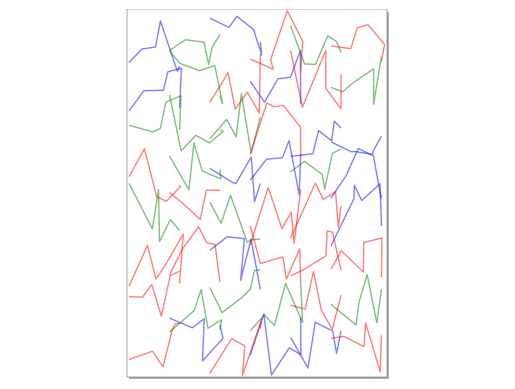

In [14]:
#D-6-2
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        base_x = (width / steps) * i

        # 第一个和最后一个点不加 stddev
        if i == 0 or i == steps - 1:
            x = base_x
        else:
            x = base_x + uniform(0, stddev)

        y = uniform(-height/2, height/2)
        pts.append([x, y])
    return pts


# --- Page + layout settings ---
page_width  = 297   # mm
page_height = 420   # mm

# Margins (mm)
margin_left   = 10
margin_right  = 10
margin_top    = 10
margin_bottom = 10

rows, cols = 8, 6

# Gutter: 12 pt -> mm (1pt ≈ 0.35278 mm)
gutter_pt = 0
gutter_mm = gutter_pt * 25.4 / 72.0   # 这里=0，不过公式留着

# Cell size
cell_width = (page_width - margin_left - margin_right - gutter_mm * (cols - 1)) / cols
available_height = page_height - margin_top - margin_bottom - gutter_mm * (rows - 1)
cell_height = available_height / rows

vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")

# vsk.penWidth("2mm")
# vsk.strokeWeight(2)

# 双重循环：行 × 列（r 控制 y，c 控制 x）
for r in range(rows):
    for c in range(cols):
        with vsk.pushMatrix():
            # 每个格子的左上角坐标，加上边距和 gutter
            x = margin_left + c * (cell_width + gutter_mm)
            y = margin_top + r * (cell_height + gutter_mm)
            vsk.translate(x, y)
            vsk.scale(1.5)

            # 让 scribble 直接在 cell 尺寸里生成 → 填满格子
            pts = make_scribble(
                width=cell_width,
                height=cell_height,
                steps=6,
                stddev=cell_width/4,
            )

            vsk.stroke(choice([1, 2, 3]))
            vsk.polygon(pts)

vsk.display()
# vsk.save("D-2-1.svg")

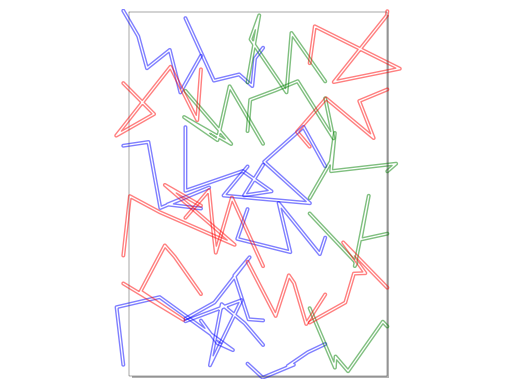

In [139]:
#D-6-3
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        base_x = (width / steps) * i

        # 第一个和最后一个点不加 stddev
        if i == 0 or i == steps - 1:
            x = base_x
        else:
            x = base_x + normal(0, stddev)

        y = uniform(-height/2, height/2)
        pts.append([x, y])
    return pts


# --- Page + layout settings ---
page_width  = 297   # mm
page_height = 420   # mm

# Margins (mm)
margin_left   = 5
margin_right  = 5
margin_top    = 5
margin_bottom = 15

rows, cols = 6, 4

# Gutter: 12 pt -> mm (1pt ≈ 0.35278 mm)
gutter_pt = 0
gutter_mm = gutter_pt * 25.4 / 72.0   # 这里=0，不过公式留着

# Cell size
cell_width = (page_width - margin_left - margin_right - gutter_mm * (cols - 1)) / cols
available_height = page_height - margin_top - margin_bottom - gutter_mm * (rows - 1)
cell_height = available_height / rows

vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")

vsk.penWidth("3mm")
vsk.strokeWeight(2)

# 双重循环：行 × 列（r 控制 y，c 控制 x）
for r in range(rows):
    for c in range(cols):
        with vsk.pushMatrix():
            # 每个格子的左上角坐标，加上边距和 gutter
            x = margin_left + c * (cell_width + gutter_mm)
            y = margin_top + r * (cell_height + gutter_mm)
            vsk.translate(x, y)
            vsk.scale(1.5)

            # 让 scribble 直接在 cell 尺寸里生成 → 填满格子
            pts = make_scribble(
                width=cell_width,
                height=cell_height,
                steps=6,
                stddev=cell_width/4,
            )

            vsk.stroke(choice([1, 2, 3]))
            vsk.polygon(pts)

vsk.display()
vsk.save("D-2-1.svg")

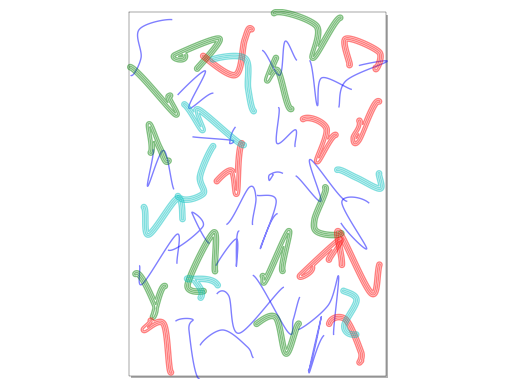

In [633]:
#D-6-4
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        base_x = (width / steps) * i

        # 第一个和最后一个点不加 stddev
        if i == 0 or i == steps - 1:
            x = base_x
        else:
            x = base_x + normal(0, stddev)

        y = uniform(-height/2, height/2)
        pts.append([x, y])
    return pts


# --- Page + layout settings ---
page_width  = 297   # mm
page_height = 420   # mm

# Margins (mm)
margin_left   = 5
margin_right  = 5
margin_top    = 5
margin_bottom = 15

rows, cols = 8, 6

# Gutter: 12 pt -> mm (1pt ≈ 0.35278 mm)
gutter_pt = 0
gutter_mm = gutter_pt * 25.4 / 72.0   # 这里=0，不过公式留着

# Cell size
cell_width = (page_width - margin_left - margin_right - gutter_mm * (cols - 1)) / cols
available_height = page_height - margin_top - margin_bottom - gutter_mm * (rows - 1)
cell_height = available_height / rows

vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")

vsk.penWidth("2mm")

# 双重循环：行 × 列（r 控制 y，c 控制 x）
for r in range(rows):
    for c in range(cols):
        with vsk.pushMatrix():
            # 每个格子的左上角坐标，加上边距和 gutter
            x = margin_left + c * (cell_width + gutter_mm)
            y = margin_top + r * (cell_height + gutter_mm)
            vsk.translate(x, y)
            vsk.scale(1.5)

            # 让 scribble 直接在 cell 尺寸里生成 → 填满格子
            pts = make_scribble(
                width=cell_width,
                height=cell_height,
                steps=6,
                stddev=cell_width/6,
            )
            curve_pts = bezmerizing.Polyline(pts).catmull_spline(tightness=0).to_polyline(30)

            stroke_weight = choice([1, 4])
            vsk.strokeWeight(stroke_weight)
            if stroke_weight == 1:
                vsk.stroke(1)
            else:
                vsk.stroke(choice([2, 3, 4]))
                
            vsk.polygon(curve_pts)

vsk.display()
vsk.save("D-2-1.svg")

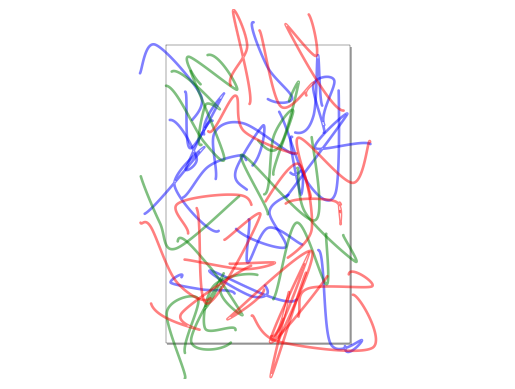

In [540]:
#D-6-5
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        base_x = (width / steps) * i

        # 第一个和最后一个点不加 stddev
        if i == 0 or i == steps - 1:
            x = base_x
        else:
            x = base_x + normal(0, stddev)

        y = uniform(-height/2, height/2)
        pts.append([x, y])
    return pts


# --- Page + layout settings ---
page_width  = 297   # mm
page_height = 480   # mm

# Margins (mm)
margin_left   = 5
margin_right  = 5
margin_top    = 0
margin_bottom = 0

rows, cols = 8, 6

# Gutter: 12 pt -> mm (1pt ≈ 0.35278 mm)
gutter_pt = 0
gutter_mm = gutter_pt * 25.4 / 72.0   # 这里=0，不过公式留着

# Cell size
cell_width = (page_width - margin_left - margin_right - gutter_mm * (cols - 1)) / cols
available_height = page_height - margin_top - margin_bottom - gutter_mm * (rows - 1)
cell_height = available_height / rows

vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")

vsk.penWidth("2mm")
vsk.strokeWeight(2)

# 双重循环：行 × 列（r 控制 y，c 控制 x）
for r in range(rows):
    for c in range(cols):
        with vsk.pushMatrix():
            # 每个格子的左上角坐标，加上边距和 gutter
            x = margin_left + c * (cell_width + gutter_mm)
            y = margin_top + r * (cell_height + gutter_mm)
            vsk.translate(x, y)
            vsk.scale(3)

            # 让 scribble 直接在 cell 尺寸里生成 → 填满格子
            pts = make_scribble(
                width=cell_width,
                height=cell_height,
                steps=6,
                stddev=cell_width/4,
            )
            curve_pts = bezmerizing.Polyline(pts).catmull_spline(tightness=0).to_polyline(30)
        
            vsk.stroke(choice([1, 2, 3]))
            vsk.polygon(curve_pts)

vsk.display()
vsk.save("D-2-1.svg")

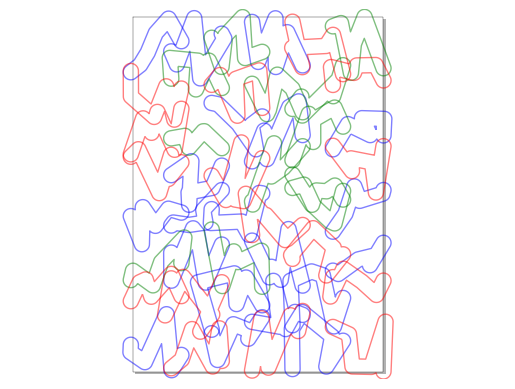

In [4]:
#D-6-6
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        base_x = (width / steps) * i

        # 第一个和最后一个点不加 stddev
        if i == 0 or i == steps - 1:
            x = base_x
        else:
            x = base_x + normal(0, stddev)

        y = uniform(-height/2, height/2)
        pts.append([x, y])
    return pts


# --- Page + layout settings ---
page_width  = 297   # mm
page_height = 420   # mm

# Margins (mm)
margin_left   = 5
margin_right  = 5
margin_top    = 5
margin_bottom = 15

rows, cols = 8, 6

# Gutter: 12 pt -> mm (1pt ≈ 0.35278 mm)
gutter_pt = 0
gutter_mm = gutter_pt * 25.4 / 72.0   # 这里=0，不过公式留着

# Cell size
cell_width = (page_width - margin_left - margin_right - gutter_mm * (cols - 1)) / cols
available_height = page_height - margin_top - margin_bottom - gutter_mm * (rows - 1)
cell_height = available_height / rows

vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")

vsk.penWidth("18mm")
vsk.strokeWeight(2)

# 双重循环：行 × 列（r 控制 y，c 控制 x）
for r in range(rows):
    for c in range(cols):
        with vsk.pushMatrix():
            # 每个格子的左上角坐标，加上边距和 gutter
            x = margin_left + c * (cell_width + gutter_mm)
            y = margin_top + r * (cell_height + gutter_mm)
            vsk.translate(x, y)
            vsk.scale(1.5)

            # 让 scribble 直接在 cell 尺寸里生成 → 填满格子
            pts = make_scribble(
                width=cell_width,
                height=cell_height,
                steps=6,
                stddev=cell_width/8,
            )

            vsk.stroke(choice([1, 2, 3]))
            vsk.polygon(pts)

vsk.display()
vsk.save("D-2-1.svg")

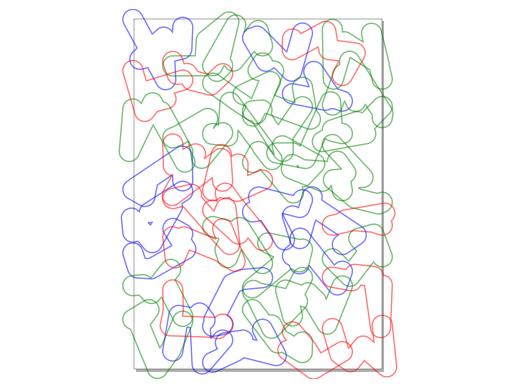

In [5]:
#D-6-7
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        base_x = (width / steps) * i

        # 第一个和最后一个点不加 stddev
        if i == 0 or i == steps - 1:
            x = base_x
        else:
            x = base_x + normal(0, stddev)

        y = uniform(-height/2, height/2)
        pts.append([x, y])
    return pts


# --- Page + layout settings ---
page_width  = 297   # mm
page_height = 420   # mm

# Margins (mm)
margin_left   = 5
margin_right  = 5
margin_top    = 5
margin_bottom = 15

rows, cols = 8, 6

# Gutter: 12 pt -> mm (1pt ≈ 0.35278 mm)
gutter_pt = 0
gutter_mm = gutter_pt * 25.4 / 72.0   # 这里=0，不过公式留着

# Cell size
cell_width = (page_width - margin_left - margin_right - gutter_mm * (cols - 1)) / cols
available_height = page_height - margin_top - margin_bottom - gutter_mm * (rows - 1)
cell_height = available_height / rows

vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")

vsk.penWidth("24mm")
vsk.strokeWeight(2)

# 双重循环：行 × 列（r 控制 y，c 控制 x）
for r in range(rows):
    for c in range(cols):
        with vsk.pushMatrix():
            # 每个格子的左上角坐标，加上边距和 gutter
            x = margin_left + c * (cell_width + gutter_mm)
            y = margin_top + r * (cell_height + gutter_mm)
            vsk.translate(x, y)
            vsk.scale(1.5)

            # 让 scribble 直接在 cell 尺寸里生成 → 填满格子
            pts = make_scribble(
                width=cell_width,
                height=cell_height,
                steps=6,
                stddev=cell_width/4,
            )

            vsk.stroke(choice([1, 2, 3]))
            vsk.polygon(pts)

vsk.display()
vsk.save("D-2-1.svg")

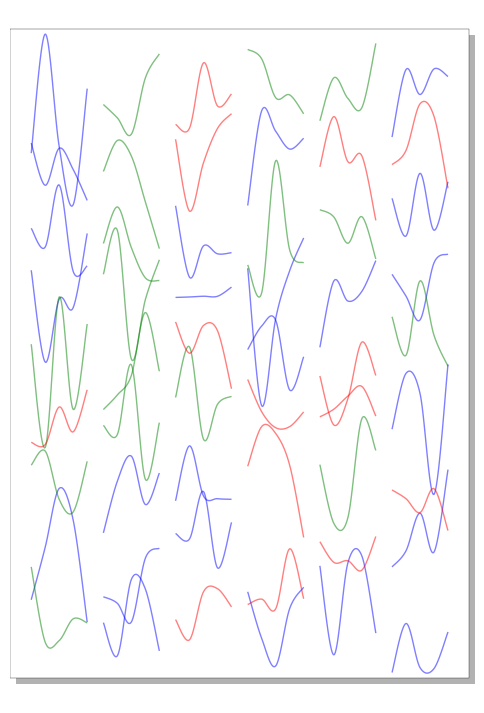

In [63]:
#D-2-1
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = normal(0, height)
        pts.append([x, y])
    return pts
    
rows, cols = 9, 6

width = 210
height = 297
margin = 7

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

em_width   = 16     
em_height  = 8     
line_height = 30   
kerning     = 6  

for r in range(rows):
    for c in range(cols):

        with vsk.pushMatrix():
            x = margin + c * (em_width + kerning)      
            y = margin + r * line_height + em_height   
            vsk.translate(x*1.5, y)

            vsk.scale(em_width)

            pts = make_scribble(width=2, height=1, steps=5, stddev=0)
            vsk.stroke(choice([1, 2, 3]))
            smooth = (
                bezmerizing.Polyline(pts)
                .augment()
                .catmull_spline(tightness=0)
                .to_polyline(20)
            )
            vsk.polygon(smooth)

vsk.display(fig_size=(6, 9))
vsk.save("D-2-02.svg")

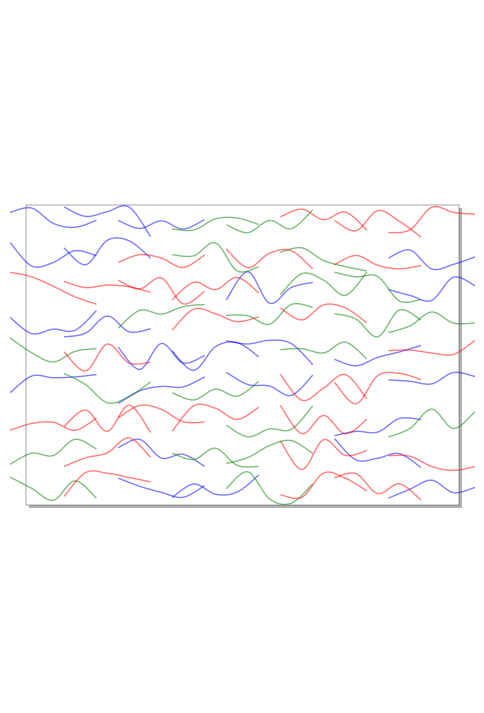

In [220]:
#D-2-2
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = uniform(-height/2, height/2)
        pts.append([x, y])
    return pts
    
margin = 10 
width = 420 - margin*2
height = 297 - margin*2

rows, cols = 9, 8

cell_size_x = width / cols
cell_size_y = height / rows

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

for r in range(rows):
    for c in range(cols):
        with vsk.pushMatrix():
            pts = make_scribble(width=cell_size_x * 2, height=cell_size_y, steps=5, stddev=0) # ask chatgpt: how to make width=cell_size_x*1.5 while keeps the margin
            vsk.translate(c * cell_size_x, r * cell_size_y)
            vsk.stroke(choice([1, 2, 3]))
            smooth = (
                bezmerizing.Polyline(pts)
                .augment()
                .catmull_spline(tightness=0)
                .to_polyline(20)
            )
            vsk.polygon(smooth)


vsk.display(fig_size=(6, 9))
vsk.save("D-2-03.svg")

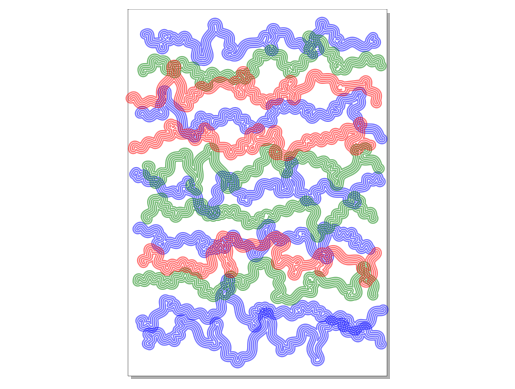

In [158]:
#D-3-1
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = normal(0, height/1.2)
        pts.append([x, y])
    return pts
    
vsk = vsketch.Vsketch()
vsk.size("210mm", "297mm")
vsk.scale("1mm")

vsk.penWidth("1.5mm")
vsk.strokeWeight(6)

for i in range(13):
    with vsk.pushMatrix():
        pts = make_scribble(width=200, height=10, steps=20, stddev=5)
        curve_spline = Polyline(pts).augment().catmull_spline()
        stroke_pen = choice([1, 2, 3])
        vsk.stroke(stroke_pen)
        vsk.translate(0, i * 20)
        offset_pline = curve_spline.offsets(
            distances=np.sin(np.linspace(0, 200, num=1000))*2,
            samples_per= 48).vertices
        vsk.polygon(offset_pline)
vsk.display()
vsk.save("D-3-01.svg")

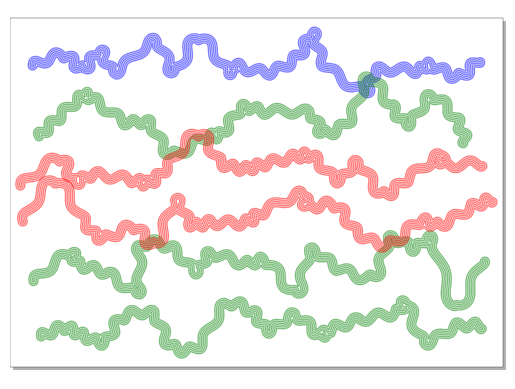

In [618]:
#D-3-2
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = normal(0, height/1.2)
        pts.append([x, y])
    return pts
    
vsk = vsketch.Vsketch()
vsk.size("420mm", "297mm")
vsk.scale("1mm")

vsk.penWidth("1.5mm")
vsk.strokeWeight(6)

for i in range(6):
    with vsk.pushMatrix():
        pts = make_scribble(width=420-16, height=18, steps=20, stddev=5)
        curve_spline = Polyline(pts).augment().catmull_spline()
        stroke_pen = choice([1, 2, 3])
        vsk.stroke(stroke_pen)
        vsk.translate(0, i * (297-8-22)/6)
        offset_pline = curve_spline.offsets(
            distances=np.sin(np.linspace(0, 200, num=1000))*3,
            samples_per= 48).vertices
        vsk.polygon(offset_pline)
vsk.display()
vsk.save("D-3-01.svg")

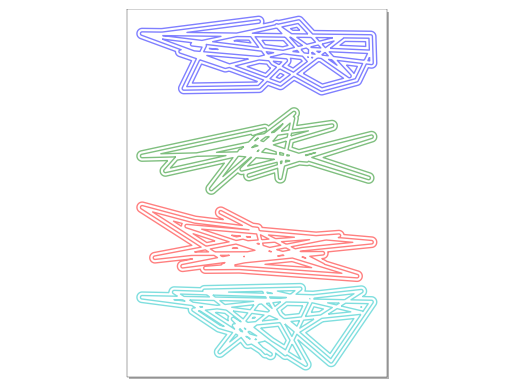

In [634]:
#D-3-3

from numpy.random import uniform, normal
import vsketch

# ---- 1. 生成统一宽度的 scribble（归一化到 [0,1]） ----
def make_scribble_normalized(steps, stddev=0):
    pts = []

    for i in range(steps):
        # base_x 保证首尾分别在序列两端
        base_x = i / (steps - 1)  # 0 → 1

        if i == 0 or i == steps - 1:
            x = base_x
        else:
            x = base_x + normal(0, stddev)

        y = uniform(-0.5, 0.5)  # 统一用归一化高度
        pts.append([x, y])

    # 再做一次归一化，确保 x 范围完全映射到 [0,1]
    xs = [p[0] for p in pts]
    min_x = min(xs)
    max_x = max(xs)
    span = max_x - min_x if max_x > min_x else 1.0

    norm_pts = [ [(x - min_x) / span, y] for (x, y) in pts ]
    return norm_pts


# ---- 2. 页面 & 排版参数 ----
page_width  = 297
page_height = 420

margin_left   = 22
margin_right  = 8
margin_top    = 8
margin_bottom = 8

rows, cols = 4, 1

# 12pt gutter → mm
gutter_mm = 12 * 25.4 / 72.0  # ≈ 4.233mm

cell_width  = (page_width  - margin_left - margin_right) / cols
cell_height = (page_height - margin_top  - margin_bottom - gutter_mm*(rows-1)) / rows

# ---- 3. 线宽 & strokeWeight 补偿 ----
pen_width_mm   = 4     # vsk.penWidth("2mm")
stroke_weight  = 4      # vsk.strokeWeight(4)
effective_thickness = pen_width_mm + stroke_weight * 0.2  # 可微调
padding = effective_thickness / 2

content_width  = cell_width  - 2 * padding
content_height = cell_height - 2 * padding

# ---- 4. vsk 初始化 ----
vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")

vsk.penWidth(f"{pen_width_mm}mm")
vsk.strokeWeight(stroke_weight)

# ---- 5. 画 4 行 scribble ----
steps  = 25
stddev = 15  # 即使很大也没关系，归一化会保证宽度一致

for r in range(rows):
    pts = make_scribble_normalized(steps=steps, stddev=stddev)

    with vsk.pushMatrix():
        # cell 左上角
        ox = margin_left
        oy = margin_top + r * (cell_height + gutter_mm)

        # 把原点移到 cell 内部、留出 padding，并在垂直方向居中
        vsk.translate(
            ox + padding,
            oy + padding + content_height / 2.0
        )

        # 让 x ∈ [0,1] → content_width, y ∈ [-0.5,0.5] → content_height
        vsk.scale(content_width, content_height)

        # 主线
        vsk.stroke(r + 1)
        vsk.polygon(pts)

        # 如果还想要端点圈圈：
        # vsk.stroke(2)
        # for x, y in pts:
        #     vsk.circle(x, y, 0.02)  # 0.02 在归一化空间里是很小的点

vsk.display()
vsk.save("D-3-06.svg")

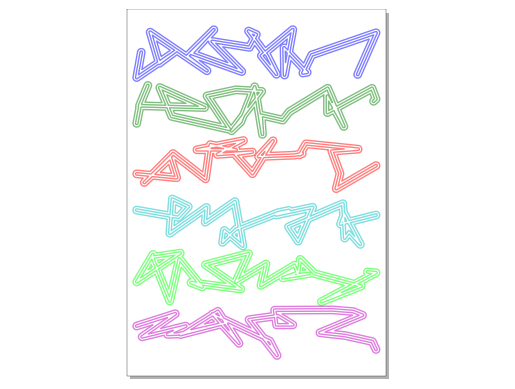

In [381]:
#D-3-4
from numpy.random import uniform

# ----------------------------------------------------
# 1. Scribble generator
# ----------------------------------------------------
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        base_x = (width / steps) * i

        # 首尾不加 noise
        if i == 0 or i == steps - 1:
            x = base_x
        else:
            x = base_x + uniform(-stddev/2, stddev/2)

        y = uniform(-height/2, height/2)
        pts.append([x, y])
    return pts

def normalize_width(pts, target_width):
    """把 scribble 的 x 范围缩放到统一的 target_width"""
    xs = [p[0] for p in pts]
    minx, maxx = min(xs), max(xs)
    width = maxx - minx if maxx > minx else 1e-6
    scale = target_width / width
    return [[(x - minx)*scale, y] for (x, y) in pts]


# ----------------------------------------------------
# 2. Page / layout parameters
# ----------------------------------------------------
page_width  = 210     # mm
page_height = 297     # mm

margin_top    = 8
margin_left   = 8
margin_right  = 8
margin_bottom = 22

rows = 6
cols = 1

# 12pt gutter -> mm
gutter_mm = 12 * 25.4 / 72.0   # ≈ 4.233 mm

# 计算单列 cell 尺寸
cell_width  = (page_width  - margin_left - margin_right - (cols - 1) * gutter_mm) / cols
available_h =  page_height - margin_top - margin_bottom - (rows - 1) * gutter_mm
cell_height =  available_h / rows

vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")

vsk.penWidth("2mm")
vsk.strokeWeight(4)

for r in range(rows):
    vsk.stroke(int(1 + r))
    with vsk.pushMatrix():
        # 每一行的 cell 起点（左上）
        ox = margin_left
        oy = margin_top + r * (cell_height + gutter_mm)

        # 把 scribble 放在 cell 的垂直中线
        baseline_y = oy + cell_height / 2.0
        vsk.translate(ox, baseline_y)

        # 宽度填满 cell，竖直高度控制在一个带子里
        scribble_width  = cell_width
        scribble_height = cell_height   # 控制上下抖动带宽（可调）

        raw = make_scribble(
            width=scribble_width,
            height=scribble_height,
            steps=25,
            stddev=50
        )
        pts = normalize_width(raw, target_width=cell_width)

        vsk.polygon(pts)

vsk.display()
vsk.save("D-3-06.svg")

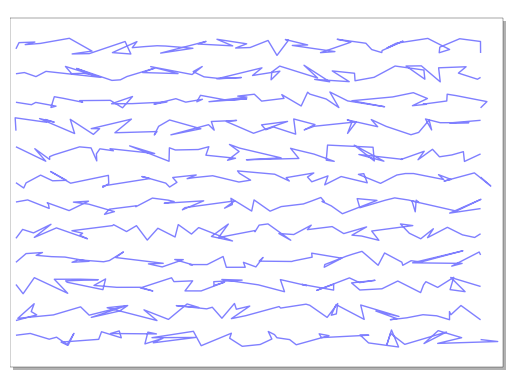

In [309]:
#D-4-2
from numpy.random import uniform, normal, choice
import vsketch

def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        base_x = (width / steps) * i

        # first & last point no noise
        if i == 0 or i == steps - 1:
            x = base_x
        else:
            x = base_x + normal(0, stddev)

        y = uniform(-height/2, height/2)
        pts.append([x, y])
    return pts

# --- page & layout ---
page_width  = 420  # mm (landscape A4)
page_height = 297  # mm

margin_left   = 8
margin_right  = 8
margin_top    = 8
margin_bottom = 22

rows, cols = 12, 1

# gutter 12pt -> mm
gutter_mm = 12 * 25.4 / 72.0

cell_width  = (page_width  - margin_left - margin_right - (cols - 1) * gutter_mm) / cols
cell_height = (page_height - margin_top  - margin_bottom - (rows - 1) * gutter_mm) / rows

# --- vsk init ---
vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")

# vsk.penWidth("1mm")
# vsk.strokeWeight(2)

# --- draw rows of scribbles ---
for r in range(rows):
    with vsk.pushMatrix():
        # 这一行 cell 的左上角
        ox = margin_left
        oy = margin_top + r * (cell_height + gutter_mm)
        vsk.translate(ox, oy)

        # 把 scribble 放在 cell 垂直中线附近
        vsk.translate(0, cell_height / 2)
        
        pts = make_scribble(
            width=cell_width,
            height=cell_height * 0.8,  # 留一点上下空间
            steps=50,
            stddev=10
        )
        vsk.stroke(1)
        vsk.polygon(pts)

vsk.display()
vsk.save("D-4-01.svg")

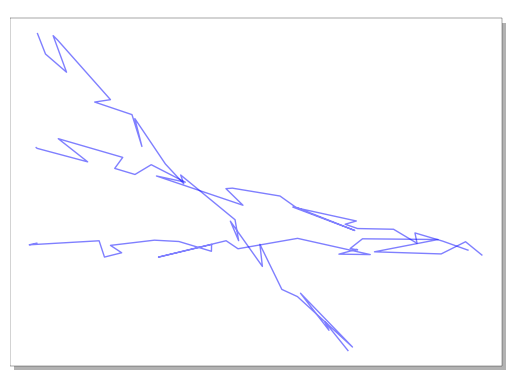

In [339]:
#D-4-3
vsk = vsketch.Vsketch()
vsk.size("297mm", "210mm")
vsk.scale("1mm")


for i in range(3):
    with vsk.pushMatrix():
        r = choice([15,45,0])
        vsk.translate(0, i * 65)
        vsk.rotate(r,True)
        pts = make_scribble(width=280, height=12, steps=25, stddev=15)
        vsk.polygon(pts)
vsk.display()
vsk.save("D-4-02.svg")

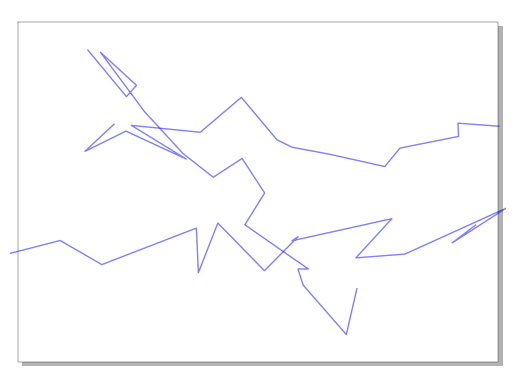

In [355]:
#D-4-4
vsk = vsketch.Vsketch()
vsk.size("297mm", "210mm")
vsk.scale("1mm")


for i in range(3):
    with vsk.pushMatrix():
        r = choice([15,45,0])
        vsk.translate(0, i * 65)
        vsk.rotate(r,True)
        pts = make_scribble(width=280, height=12, steps=15, stddev=15)
        vsk.polygon(pts)
vsk.display()
vsk.save("D-4-02.svg")

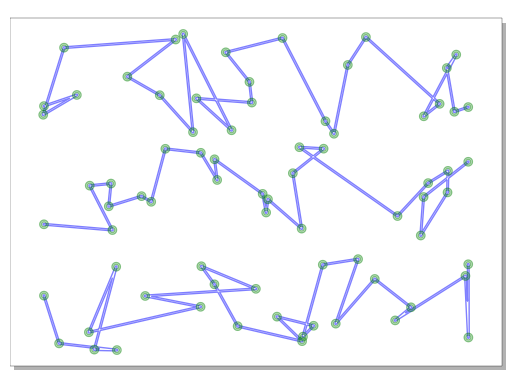

In [291]:
#D-4-5
import numpy as np
from numpy.random import normal, uniform
import vsketch
import bezmerizing

# -------------------------------------------------------
# 1) Scribble generator (first/last point no noise)
# -------------------------------------------------------
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):

        base_x = (width / steps) * i

        # first & last point no noise
        if i == 0 or i == steps - 1:
            x = base_x
        else:
            x = base_x + normal(0, stddev)

        y = uniform(-height/2, height/2)
        pts.append([x, y])
    return pts


# -------------------------------------------------------
# 2) Page + layout system
# -------------------------------------------------------
page_width  = 297
page_height = 210

margin_left   = 22
margin_right  = 8
margin_top    = 8
margin_bottom = 8

rows = 3
cols = 1

gutter_mm = 12 * 25.4 / 72.0   # 12pt gutter

cell_width  = (page_width  - margin_left - margin_right  - (cols-1)*gutter_mm) / cols
cell_height = (page_height - margin_top  - margin_bottom - (rows-1)*gutter_mm) / rows


# -------------------------------------------------------
# 3) vsketch init
# -------------------------------------------------------
vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")

vsk.penWidth("1mm")
vsk.strokeWeight(2)


# -------------------------------------------------------
# 4) Draw scribbles inside grid system
# -------------------------------------------------------
for r in range(rows):
    for c in range(cols):

        # 生成 scribble（使用 cell 尺寸）
        scr_w = cell_width * 1
        scr_h = cell_height * 1

        pts = make_scribble(
            width=scr_w,
            height=scr_h,
            steps=25,
            stddev=15
        )

        # 坐标偏移，使 scribble 完美居中
        ox = margin_left + c*(cell_width + gutter_mm)
        oy = margin_top  + r*(cell_height + gutter_mm)

        with vsk.pushMatrix():
            vsk.translate(ox, oy + cell_height/2)

            # ---- draw polygon ----
            vsk.stroke(1)
            vsk.polygon(pts)

            # ---- draw points ----
            vsk.stroke(2)
            for pt in pts:
                vsk.circle(pt[0], pt[1], 4)


# -------------------------------------------------------
# 5) Output
# -------------------------------------------------------
vsk.display()
vsk.save("D-4-02.svg")

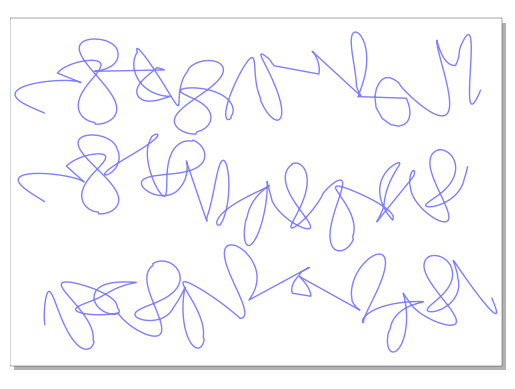

In [278]:
#D-4-6
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        base_x = (width / steps) * i

        # 第一个和最后一个点不加 stddev
        if i == 0 or i == steps - 1:
            x = base_x
        else:
            x = base_x + normal(0, stddev)

        y = normal(0, height)
        pts.append([x, y])
    return pts
    
vsk = vsketch.Vsketch()
vsk.size("297mm", "210mm")
vsk.scale("1mm")

vsk.penWidth("1mm")
vsk.strokeWeight(2)

for i in range(3):
    pts = make_scribble(width=280, height=10, steps=20, stddev=5)
    curve_spline = Polyline(pts).augment().catmull_spline()
    with vsk.pushMatrix():
        vsk.translate(0, i * 65)
        offset_pline = curve_spline.offsets(
            distances=np.sin(np.linspace(0, 100, num=1000))*20,
            samples_per= 48).vertices
        vsk.polygon(offset_pline)
vsk.display()
vsk.save("D-4-03.svg")

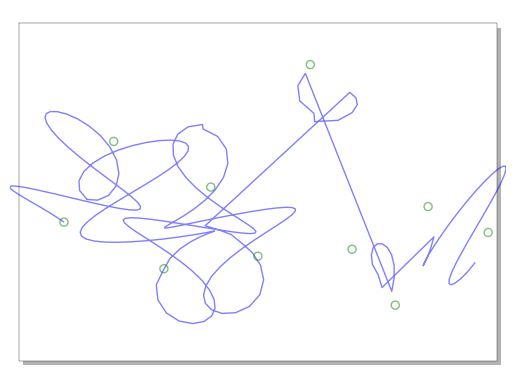

In [269]:
#D-4-7
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = normal(0, height)
        pts.append([x, y])
    return pts
    
vsk = vsketch.Vsketch()
vsk.size("297mm", "210mm")
vsk.scale("1mm")

vsk.penWidth("1mm")
vsk.strokeWeight(1)

for i in range(1):
    pts = make_scribble(width=280, height=30, steps=10, stddev=5)
    curve_spline = Polyline(pts).augment().catmull_spline()
    with vsk.pushMatrix():
        vsk.translate(0, i * 65)
        offset_pline = curve_spline.offsets(
            distances=np.sin(np.linspace(0, 100, num=1000))*40,
            samples_per= 48).vertices
        vsk.stroke(1)
        vsk.polygon(offset_pline)
        vsk.stroke(2)
        for pt in pts:
            vsk.circle(pt[0], pt[1], 5)
vsk.display()
vsk.save("D-3-04.svg")

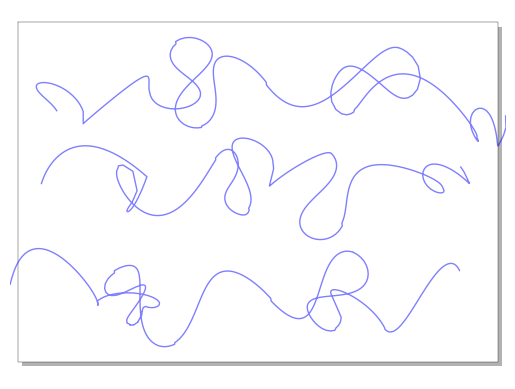

In [544]:
#D-4-8
vsk = vsketch.Vsketch()
vsk.size("297mm", "210mm")
vsk.scale("1mm")

vsk.penWidth("2mm")
vsk.strokeWeight(1)

for i in range(3):
    pts = make_scribble(width=280, height=10, steps=10, stddev=20)
    curve_spline = Polyline(pts).augment().catmull_spline()
    with vsk.pushMatrix():
        vsk.translate(0, i * 65)
        offset_pline = curve_spline.offsets(
            distances=np.sin(np.linspace(0, 40, num=1000))*20,
            samples_per= 48).vertices
        vsk.polygon(offset_pline)
vsk.display()
vsk.save("D-3-04.svg")

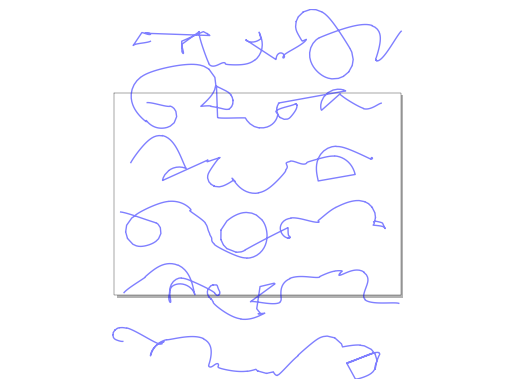

In [223]:
#D-4-9
vsk = vsketch.Vsketch()
vsk.size("297mm", "210mm")
vsk.scale("1mm")

vsk.penWidth("2mm")
#vsk.strokeWeight(10)

for i in range(6):
    n = uniform(0,100)
    pts = make_scribble(width=280, height=10, steps=20, stddev=10)
    curve_spline = Polyline(pts).augment().catmull_spline()
    with vsk.pushMatrix():
        vsk.translate(0, i * 65)
        offset_pline = curve_spline.offsets(
            distances=np.sin(np.linspace(0, 10, num=1000))*20,
            samples_per= 24).vertices
        vsk.polygon(offset_pline)
vsk.display()
vsk.save("D-3-04.svg")

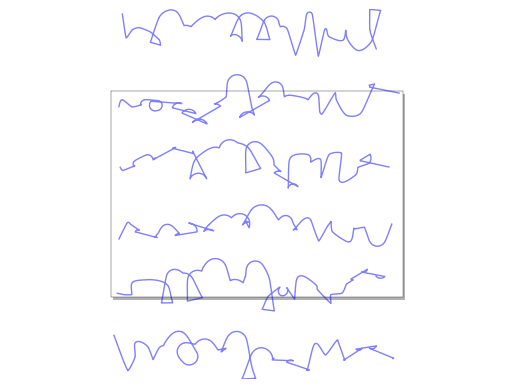

In [222]:
#E-2-1
vsk = vsketch.Vsketch()
vsk.size("297mm", "210mm")
vsk.scale("1mm")

vsk.penWidth("2mm")
#vsk.strokeWeight(10)

def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = normal(0, height)
        pts.append([x, y])
    return pts

for i in range(6):
    n = uniform(0, 100)
    pts = make_scribble(width=280, height=10, steps=40, stddev=3)
    curve_spline = (
        Polyline(pts)
        .augment()
        .catmull_spline(tightness=0.4)
        
    )

    with vsk.pushMatrix():
        vsk.translate(0, i * 65)
        offset_pline = curve_spline.offsets(
            distances=np.sin(np.linspace(0, 4, num=1000)) * 10,
            samples_per=200
        ).vertices
        vsk.polygon(offset_pline)

vsk.display()
vsk.save("D-3-04.svg")

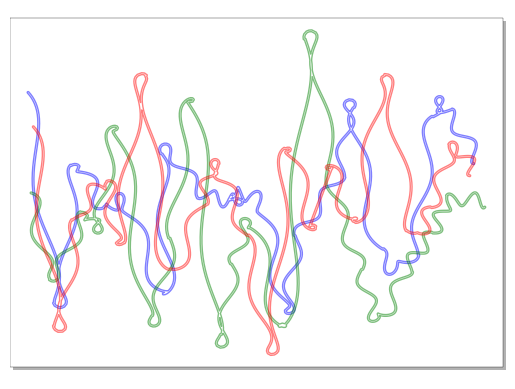

In [457]:
#E-2-2
from bezmerizing import Polyline

vsk = vsketch.Vsketch()
vsk.size("420mm", "297mm")
vsk.scale("1mm")

vsk.penWidth("1.5mm")
vsk.strokeWeight(2)

vsk.stroke(2)
for i in range(3):
    vsk.stroke(int(1+i))
    pts = make_scribble(width=400, height=70, steps=20, stddev=5)
    curve_spline = Polyline(pts).augment().catmull_spline()
    curve_pts = bezmerizing.Polyline(pts).catmull_spline(tightness=-0.5).to_polyline(10)
    offset_pline = curve_spline.offsets(
        distances=np.sin(np.linspace(0, 200, num=2000))*6,
        samples_per= 48).vertices
    vsk.polygon(offset_pline)
vsk.display()

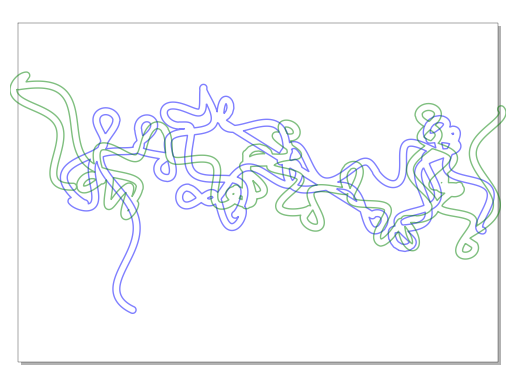

In [160]:
#E-2-3
vsk = vsketch.Vsketch()
vsk.size("420mm", "297mm")
vsk.scale("1mm")

vsk.penWidth("6mm")
vsk.strokeWeight(2)

vsk.stroke(2)
for i in range(2):
    vsk.stroke(int(1+i))
    pts = make_scribble(width=400, height=60, steps=20, stddev=30)
    curve_spline = Polyline(pts).augment().catmull_spline()
    curve_pts = bezmerizing.Polyline(pts).catmull_spline(tightness=-10).to_polyline(10)
    offset_pline = curve_spline.offsets(
        distances=np.sin(np.linspace(0, 200, num=500))*12,
        samples_per= 180).vertices
    vsk.polygon(offset_pline)
vsk.display()

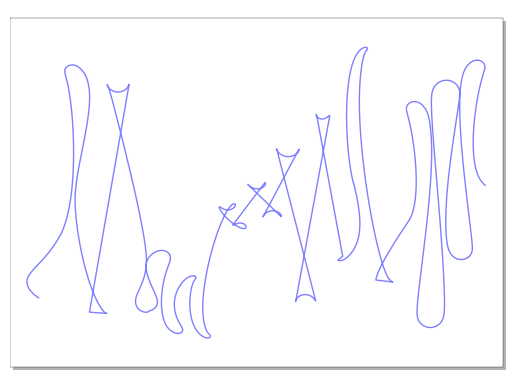

In [247]:
#E-2-4
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = uniform(0, height)
        pts.append([x, y])
    return pts
    
vsk = vsketch.Vsketch()
vsk.size("420mm", "297mm")
vsk.scale("1mm")

vsk.penWidth("6mm")
vsk.strokeWeight(1)

vsk.stroke(3)
vsk.stroke(int(1+i))
pts = make_scribble(width=400, height=250, steps=30, stddev=0)
curve_spline = Polyline(pts).augment().catmull_spline()
offset_pline = curve_spline.offsets(
    distances=np.sin(np.linspace(0, 100, num=50))*12,
    samples_per= 180).vertices
vsk.polygon(offset_pline)
vsk.display()
vsk.save("D-3-06.svg")

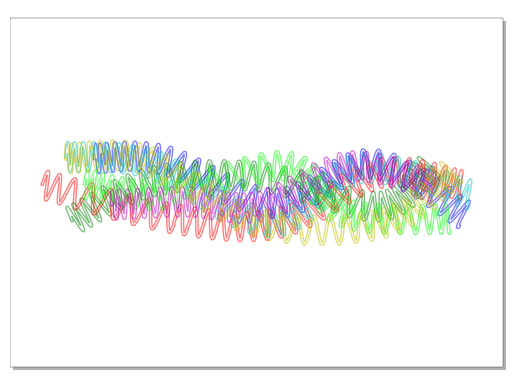

In [163]:
#E-2-5
vsk = vsketch.Vsketch()
vsk.size("420mm", "297mm")
vsk.scale("1mm")

vsk.penWidth("2mm")
vsk.strokeWeight(2)

vsk.stroke(2)
for i in range(7):
    vsk.stroke(int(1+i))
    pts = make_scribble(width=400, height=60, steps=5, stddev=15)
    curve_spline = Polyline(pts).augment().catmull_spline()
    curve_pts = bezmerizing.Polyline(pts).catmull_spline(tightness=-10).to_polyline(10)
    offset_pline = curve_spline.offsets(
        distances=np.sin(np.linspace(0, 200, num=500))*12,
        samples_per= 180).vertices
    vsk.polygon(offset_pline)
vsk.display()

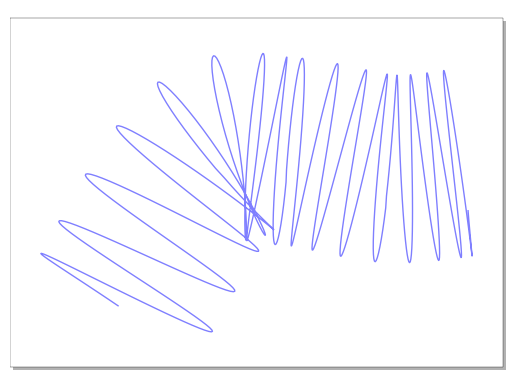

In [99]:
#E-2-6
vsk = vsketch.Vsketch()
vsk.size("420mm", "297mm")
vsk.scale("1mm")

vsk.penWidth("2mm")
#vsk.strokeWeight(2)

for i in range(1):
    vsk.stroke(int(1+i))
    pts = make_scribble(width=400, height=60, steps=5, stddev=15)
    curve_spline = Polyline(pts).augment().catmull_spline()
    offset_pline = curve_spline.offsets(
        distances=np.sin(np.linspace(0, 100, num=400))*80,
        samples_per= 180).vertices
    vsk.polygon(offset_pline)
vsk.display()
vsk.save("G-4-4.svg")

In [6]:
#G-4-6
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        base_x = (width / steps) * i

        # 第一个和最后一个点不加 stddev
        if i == 0 or i == steps - 1:
            x = base_x
        else:
            x = base_x + normal(0, stddev)

        y = uniform(-height/2, height/2)
        pts.append([x, y])
    return pts
    
vsk = vsketch.Vsketch()
vsk.size("297mm", "210mm")
vsk.scale("1mm")

vsk.penWidth("2mm")
vsk.strokeWeight(2)

for i in range(3):
    with vsk.pushMatrix():
        r = choice([15,30,0])
        vsk.translate(0, i * 65)
        pts = make_scribble(width=280, height=13, steps=25, stddev=30)
        curve_spline = bezmerizing.Polyline(pts).augment().catmull_spline()
        
        offset_vertices = curve_spline.offsets(
            distances=[j * 1, j * 1], samples_per=96
        ).vertices
    
        vsk.polygon(offset_vertices)
        
        #vsk.polygon(pts)
vsk.display()
vsk.save("G-4-5.svg")

NameError: name 'j' is not defined

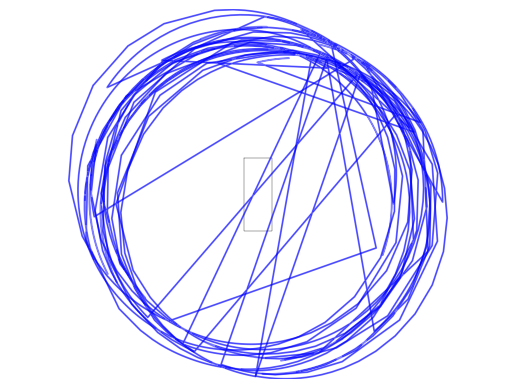

In [262]:
#G-4-7
vsk = vsketch.Vsketch()
vsk.size("420", "297mm")
vsk.scale("1mm")

vsk.penWidth("2mm")
vsk.strokeWeight(2)

def make_scribble(width, height, steps, stddev=0, closed=False):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = uniform(0, height)
        pts.append([x, y])
    if closed:
        pts.append(pts[0])
    return pts

for i in range(3):
    with vsk.pushMatrix():
        r = choice([15,30,0])
        vsk.translate(0, i * 65)
        vsk.rotate(r,True)
        pts = make_scribble(width=280, height=12, steps=25, stddev=15)
        curve_spline = bezmerizing.Polyline(pts).augment().catmull_spline()
        
        offset_vertices = curve_spline.offsets(
            distances=[j * 1, j * 1], samples_per=96
        ).vertices
    
        vsk.polygon(offset_vertices)
        
        #vsk.polygon(pts)
vsk.display()
vsk.save("G-4-5.svg")

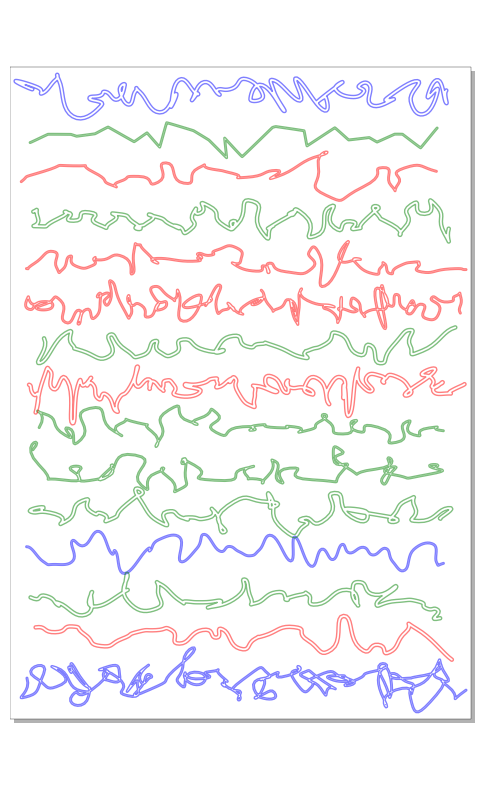

In [204]:
#D-5-1
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = normal(0, height)
        pts.append([x, y])
    return pts

width = 297
height = 420

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

for i in range(15):
    pts = make_scribble(width=290, height=6, steps=int(uniform(20, 100)), stddev=uniform(3, 6))
    curve_pts = bezmerizing.Polyline(pts).catmull_spline(tightness=uniform(-4, 1)).to_polyline(10)
    pen_width = choice([1, 2])
    vsk.penWidth(f"{pen_width}mm")
    vsk.strokeWeight(2)
    with vsk.pushMatrix():
        stroke_pen = choice([1, 2, 3])
        vsk.stroke(stroke_pen)
        vsk.translate(0, i * 27)
        vsk.polygon(curve_pts)
vsk.display(fig_size=(6, 10))

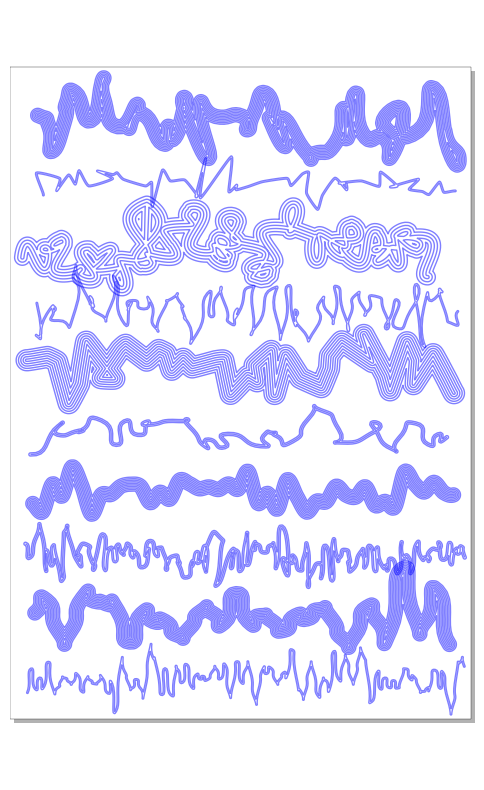

In [194]:
#D-5-2
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = normal(0, height)
        pts.append([x, y])
    return pts

vsk = vsketch.Vsketch()
vsk.size("297mm", "420mm")
vsk.scale("1mm")

for i in range(10):
    with vsk.pushMatrix():
        vsk.translate(0, i * 40)
        
        if i % 2 == 1:
            vsk.penWidth("1mm")
            vsk.strokeWeight(choice([2,3]))
            pts = make_scribble(width=290, height=8, steps=int(uniform(36, 120)), stddev=uniform(0, 5))
            curve_pts = bezmerizing.Polyline(pts).catmull_spline(tightness=uniform(-4, 1)).to_polyline(10)
            vsk.polygon(curve_pts)
        else:
            if i != 2:
                vsk.penWidth(f"{choice([1,1.5])}mm")
                vsk.strokeWeight(10)
                pts = make_scribble(width=290, height=uniform(7,14), steps=int(uniform(35, 50)), stddev=choice([0,5]))
                curve_pts = bezmerizing.Polyline(pts).catmull_spline(tightness=uniform(-4, 1)).to_polyline(10)
                vsk.polygon(curve_pts)
            else:
                vsk.translate(5, 0)
                vsk.penWidth("2mm")
                vsk.strokeWeight(6)
                pts = make_scribble(width=270, height=12, steps=30, stddev=5)
                curve_spline = Polyline(pts).augment().catmull_spline()            
                curve_pts = bezmerizing.Polyline(pts).catmull_spline(tightness=-0.5).to_polyline(100)
                offset_pline = curve_spline.offsets(
                    distances=np.sin(np.linspace(0, 200, num=1000))*8,
                    samples_per= 48).vertices
                vsk.polygon(offset_pline)

vsk.display(fig_size=(6, 10))

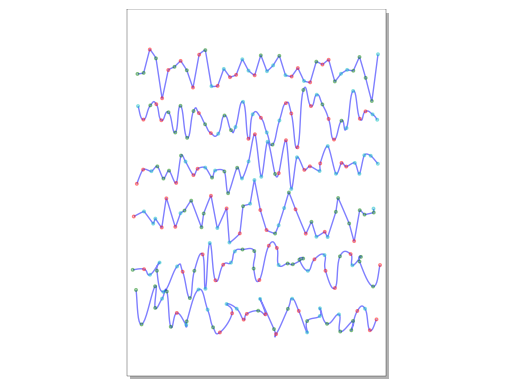

In [367]:
#D-6-1
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = normal(0, height)
        pts.append([x, y])
    return pts

vsk = vsketch.Vsketch()
vsk.size("210mm", "297mm")
vsk.scale("1mm")
vsk.penWidth("1mm")
for i in range(6):
    pts = make_scribble(width=200, height=10, steps=40, stddev=i * 0.5)
    padded = [pts[0]] + pts + [pts[-1]]

    curve_pts = bezmerizing.Polyline(padded).catmull_spline(tightness=uniform(-2, 1)).to_polyline(10)
    with vsk.pushMatrix():
        vsk.stroke(1)
        vsk.translate(0, i * 40)
        vsk.strokeWeight(1)
        vsk.polygon(curve_pts)
        for pt in pts:
            vsk.stroke(choice([2,3,4]))
            vsk.circle(pt[0], pt[1], 2)
vsk.display()
vsk.save("D-6-02.svg")

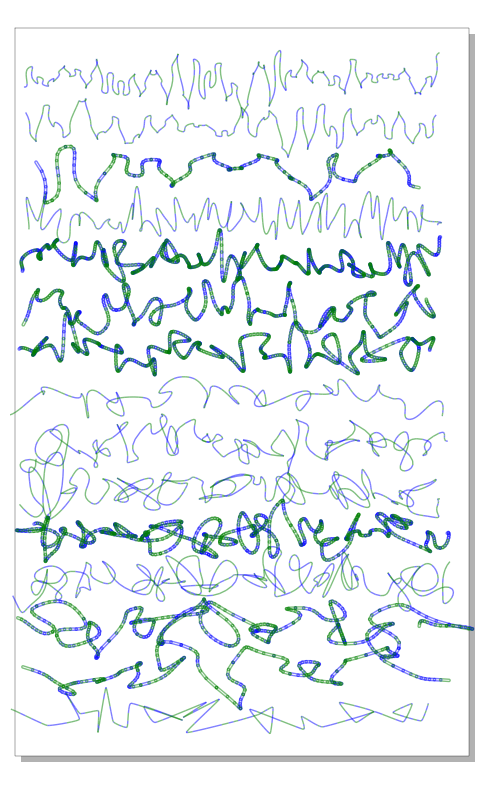

In [32]:
#D-8-1
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = normal(0, height)
        pts.append([x, y])
    return pts

vsk = vsketch.Vsketch()
vsk.size("210mm", "297mm")
vsk.scale("1mm")
vsk.penWidth("1mm")
for i in range(15):
    pts = make_scribble(width=190, height=5, steps=int(uniform(25, 100)), stddev=i * 0.5)
    curve_pts = bezmerizing.Polyline(pts).catmull_spline(tightness=uniform(-4, 1)).to_polyline(10)
    vsk.strokeWeight(choice([1, 2]))
    
    with vsk.pushMatrix():
        vsk.translate(0, i * 20)
        #for pt in pts:
            #vsk.circle(pt[0], pt[1], 1)
    
        for j in range(len(curve_pts) - 1):
            stroke_pen = choice([1, 2])
            vsk.stroke(stroke_pen)
            vsk.line(curve_pts[j][0], curve_pts[j][1], curve_pts[j + 1][0], curve_pts[j + 1][1])

vsk.display(fig_size=(6, 10))
vsk.save("D-8-01.svg")

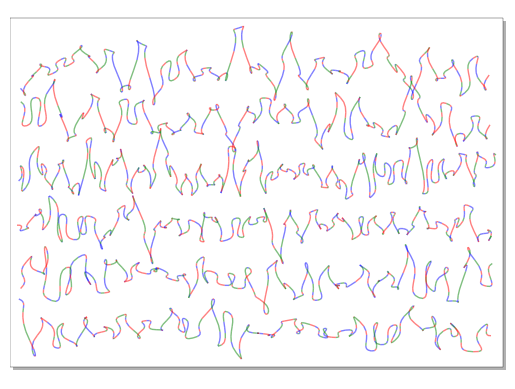

In [250]:
#D-8-2
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = normal(0, height)
        pts.append([x, y])
    return pts

vsk = vsketch.Vsketch()
vsk.size("420mm", "297mm")
vsk.scale("1mm")
vsk.penWidth("1mm")
for i in range(6):
    pts = make_scribble(width=420, height=10, steps=int(uniform(25, 100)), stddev=i * 0.5)
    curve_pts = bezmerizing.Polyline(pts).catmull_spline(tightness=-4).to_polyline(10)
    #vsk.strokeWeight(choice([1, 2]))
    
    with vsk.pushMatrix():
        vsk.translate(0, i * 45)
    
        for j in range(len(curve_pts) - 1):
            stroke_pen = choice([1, 2, 3])
            vsk.stroke(stroke_pen)
            vsk.line(curve_pts[j][0], curve_pts[j][1], curve_pts[j + 1][0], curve_pts[j + 1][1])

vsk.display()
vsk.save("D-8-01.svg")

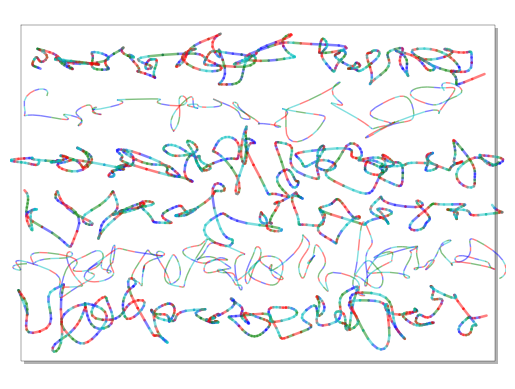

In [258]:
#D-8-3
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = normal(0, height)
        pts.append([x, y])
    return pts

vsk = vsketch.Vsketch()
vsk.size("420mm", "297mm")
vsk.scale("1mm")
vsk.penWidth("1mm")

for i in range(6):
    pts = make_scribble(width=420, height=10, steps=int(uniform(25, 100)), stddev=10)
    curve_pts = bezmerizing.Polyline(pts).catmull_spline(tightness=-4).to_polyline(10)
    vsk.strokeWeight(choice([1, 2]))
    
    with vsk.pushMatrix():
        vsk.translate(0, i * 45)
    
        for j in range(len(curve_pts) - 1):
            stroke_pen = choice([1, 2, 3, 4 ])
            vsk.stroke(stroke_pen)
            vsk.line(curve_pts[j][0], curve_pts[j][1], curve_pts[j + 1][0], curve_pts[j + 1][1])

vsk.display()
vsk.save("D-8-01.svg")

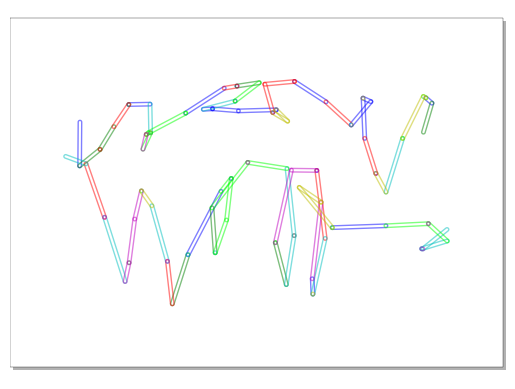

In [443]:
#D-8-4
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = normal(0, height)
        pts.append([x, y])
    return pts

vsk = vsketch.Vsketch()
vsk.size("420mm", "297mm")
vsk.scale("1mm")
vsk.penWidth("3mm")

for i in range(2):
    pts = make_scribble(width=350, height=30, steps=20, stddev=15)
    curve_pts = bezmerizing.Polyline(pts).catmull_spline(tightness=-4).to_polyline(3)
    vsk.strokeWeight(2)
    
    with vsk.pushMatrix():
        vsk.translate(0, i * 90)
        for j in range(len(curve_pts) - 1):
            stroke_pen = choice([1, 2, 3, 4, 5, 6, 7])
            vsk.stroke(stroke_pen)
            vsk.line(curve_pts[j][0], curve_pts[j][1], curve_pts[j + 1][0], curve_pts[j + 1][1])

vsk.display()
vsk.save("D-8-01.svg")

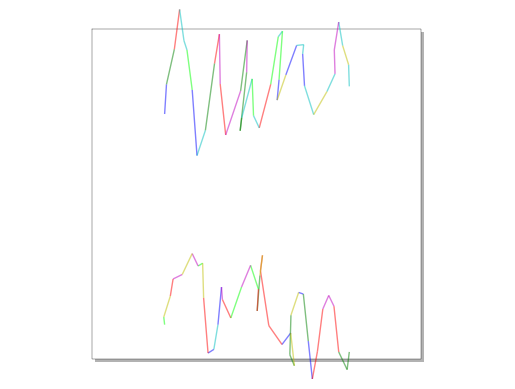

In [464]:
#D-8-5
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        base_x = (width / steps) * i

        # 第一个和最后一个点不加 stddev
        if i == 0 or i == steps - 1:
            x = base_x
        else:
            x = base_x + normal(0, stddev)

        y = uniform(-height/2, height/2)
        pts.append([x, y])
    return pts

vsk = vsketch.Vsketch()
vsk.size("297mm", "297mm")
vsk.scale("1mm")
vsk.penWidth("1mm")

for i in range(2):
    pts = make_scribble(width=175, height=93, steps=20, stddev=5)
    padded = [pts[0]] + list(pts) + [pts[-1]]
    curve_pts = bezmerizing.Polyline(padded).catmull_spline(tightness=-4).to_polyline(3)
    
    with vsk.pushMatrix():
        vsk.translate(0, i * 200)

        for j in range(len(curve_pts) - 1):
            stroke_pen = choice([1, 2, 3, 4, 5, 6, 7])
            vsk.stroke(stroke_pen)
            vsk.line(curve_pts[j][0], curve_pts[j][1], curve_pts[j + 1][0], curve_pts[j + 1][1])

vsk.display()
vsk.save("D-8-01.svg")

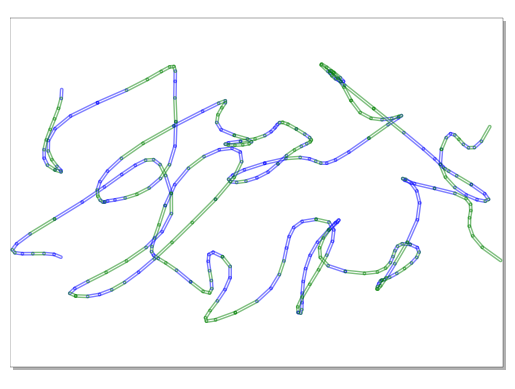

In [125]:
#D-8-6
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = normal(0, height)
        pts.append([x, y])
    return pts

vsk = vsketch.Vsketch()
vsk.size("420mm", "297mm")
vsk.scale("1mm")
vsk.penWidth("2mm")

for i in range(2):
    pts = make_scribble(width=420, height=30, steps=20, stddev=30)
    curve_pts = bezmerizing.Polyline(pts).catmull_spline(tightness=-4).to_polyline(10)
    vsk.strokeWeight(2)
    
    with vsk.pushMatrix():
        vsk.translate(0, i * 100)
    
        for j in range(len(curve_pts) - 1):
            stroke_pen = choice([1, 2])
            vsk.stroke(stroke_pen)
            vsk.line(curve_pts[j][0], curve_pts[j][1], curve_pts[j + 1][0], curve_pts[j + 1][1])

vsk.display()
vsk.save("D-8-01.svg")

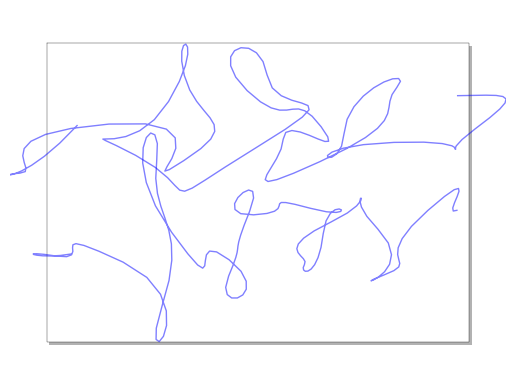

In [347]:
#D-8-7
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = normal(0, height)
        pts.append([x, y])
    return pts

vsk = vsketch.Vsketch()
vsk.size("420mm", "297mm")
vsk.scale("1mm")

for i in range(2):
    pts = make_scribble(width=420, height=30, steps=20, stddev=30)
    curve_pts = bezmerizing.Polyline(pts).catmull_spline(tightness=-4).to_polyline(10)
    
    with vsk.pushMatrix():
        vsk.translate(0, i * 100)
    
        

        vsk.polygon(curve_pts)

vsk.display()
vsk.save("D-8-01.svg")

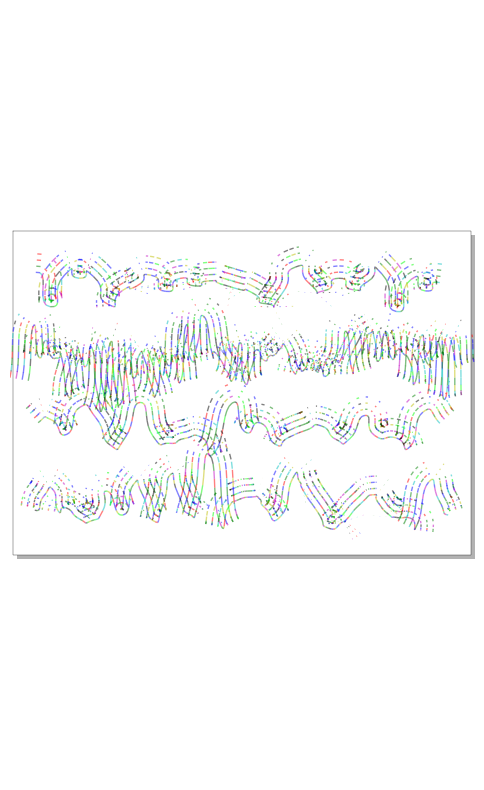

In [211]:
#D-9-1
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = normal(0, height)
        pts.append([x, y])
    return pts

vsk = vsketch.Vsketch()
vsk.size("297mm", "210mm")
vsk.scale("1mm")
vsk.penWidth("1mm")

for i in range(4):
    pts = make_scribble(width=290, height=10, steps=int(uniform(25, 100)), stddev=i * 0.5)
    curve_pts = bezmerizing.Polyline(pts).catmull_spline(tightness=uniform(-4, 1)).to_polyline(10)
    
    with vsk.pushMatrix():
        vsk.translate(0, i * 47)
    
        # get spline from original points
        curve_spline = bezmerizing.Polyline(pts).augment().catmull_spline()
        # draw offsets for each segment
        stroke_offset = 4
        for k in range(len(curve_pts) - 1):
            segment_pts = [curve_pts[k], curve_pts[k + 1]]
            segment_spline = bezmerizing.Polyline(segment_pts).augment().catmull_spline()

            for j in range(stroke_offset):
                # Offset the small spline
                offset_vertices = segment_spline.offsets(
                    distances=[j * 4, j * 4], samples_per=4  # fewer samples since it's just a short segment
                ).vertices
                
                # Draw the offset polygon with random stroke
                vsk.stroke(choice([1, 2, 3, 4 , 5, 6, 7, 8, 9, 10]))
                vsk.polygon(offset_vertices)
vsk.save("D-8-01.svg")

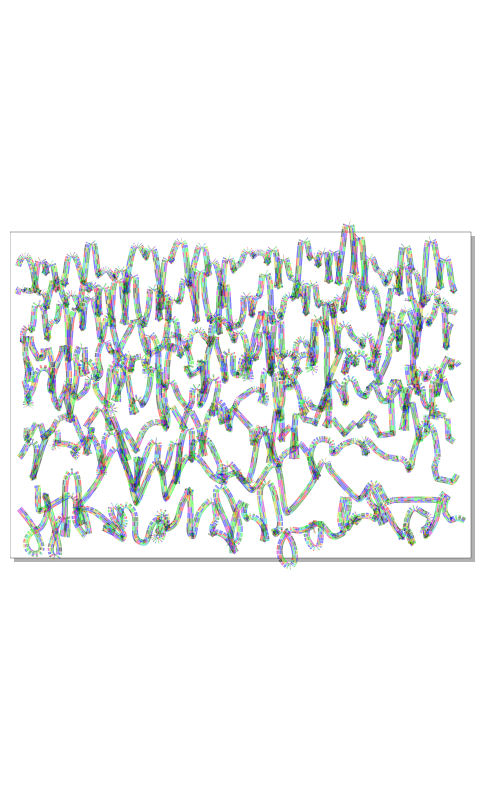

In [202]:
#D-9-2
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = normal(0, height)
        pts.append([x, y])
    return pts

vsk = vsketch.Vsketch()
vsk.size("297mm", "210mm")
vsk.scale("1mm")
vsk.penWidth("1mm")

for i in range(9):
    pts = make_scribble(width=290, height=10, steps=int(uniform(25, 100)), stddev=i * 0.5)
    curve_pts = bezmerizing.Polyline(pts).catmull_spline(tightness=uniform(-4, 1)).to_polyline(10)
    
    with vsk.pushMatrix():
        vsk.translate(0, i * 20)
    
        # get spline from original points
        curve_spline = bezmerizing.Polyline(pts).augment().catmull_spline()
        # draw offsets for each segment
        stroke_offset = 4
        for k in range(len(curve_pts) - 1):
            segment_pts = [curve_pts[k], curve_pts[k + 1]]
            segment_spline = bezmerizing.Polyline(segment_pts).augment().catmull_spline()

            for j in range(stroke_offset):
                # Offset the small spline
                offset_vertices = segment_spline.offsets(
                    distances=[j * 1, j * 1], samples_per=4  # fewer samples since it's just a short segment
                ).vertices
                
                # Draw the offset polygon with random stroke
                vsk.stroke(choice([1, 2, 3, 4 , 5, 6, 7, 8, 9, 10]))
                vsk.polygon(offset_vertices)
vsk.save("D-8-01.svg")

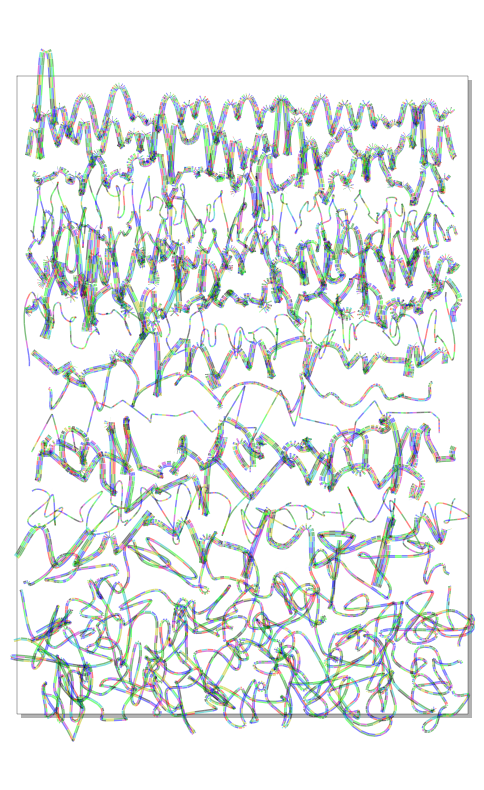

In [237]:
#D-9-3
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = normal(0, height)
        pts.append([x, y])
    return pts

vsk = vsketch.Vsketch()
vsk.size("297mm", "420mm")
vsk.scale("1mm")
vsk.penWidth("1mm")

for i in range(20):
    pts = make_scribble(width=290, height=10, steps=int(uniform(25, 100)), stddev=i * 0.5)
    curve_pts = bezmerizing.Polyline(pts).catmull_spline(tightness=uniform(-4, 1)).to_polyline(10)
    
    with vsk.pushMatrix():
        vsk.translate(0, i * 20)
    
        # get spline from original points
        curve_spline = bezmerizing.Polyline(pts).augment().catmull_spline()
        # draw offsets for each segment
        stroke_offset = choice([1, 2, 4])
        for k in range(len(curve_pts) - 1):
            segment_pts = [curve_pts[k], curve_pts[k + 1]]
            segment_spline = bezmerizing.Polyline(segment_pts).augment().catmull_spline()

            for j in range(stroke_offset):
                # Offset the small spline
                offset_vertices = segment_spline.offsets(
                    distances=[j * 1, j * 1], samples_per=4  # fewer samples since it's just a short segment
                ).vertices
                
                # Draw the offset polygon with random stroke
                vsk.stroke(choice([1, 2, 3, 4 , 5, 6, 7, 8, 9, 10]))
                vsk.polygon(offset_vertices)

vsk.save("D-8-01.svg")

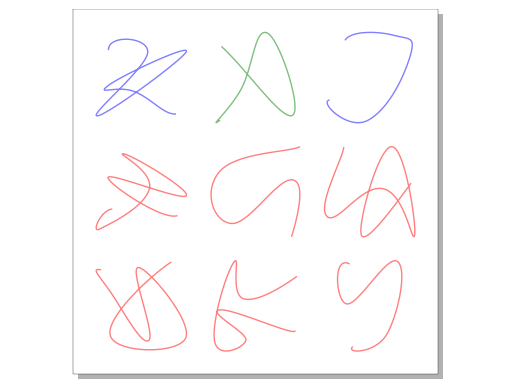

In [609]:
#G-3-1
# KMeans looping glyph with professional layout grid
import numpy as np
import random
from sklearn.cluster import MiniBatchKMeans
import vsketch
import bezmerizing
from bezmerizing import Polyline

# -----------------------------
# 1. KMeans glyph generator
# -----------------------------
def kmeans_glyph(n_clusters=6, low=-0.5, high=0.5):
    data = np.random.uniform(low=low, high=high, size=(100, 2))
    km = MiniBatchKMeans(n_clusters=n_clusters, n_init="auto", max_iter=25)
    km.fit(data)
    centers = km.cluster_centers_
    # 打乱连接顺序，增加变化
    np.random.shuffle(centers)
    return centers


# -----------------------------
# 2. Page & grid layout
# -----------------------------
page_width  = 194  # mm
page_height = 194  # mm

margin_left   = 8
margin_right  = 8
margin_top    = 8
margin_bottom = 8

rows, cols = 3, 3

# 12pt gutter → mm
gutter_mm = 12 * 25.4 / 72.0  # ≈ 4.233mm

cell_width  = (page_width  - margin_left - margin_right - gutter_mm * (cols - 1)) / cols
cell_height = (page_height - margin_top  - margin_bottom - gutter_mm * (rows - 1)) / rows


# -----------------------------
# 3. vsketch setup
# -----------------------------
vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")

vsk.penWidth("2mm")
vsk.strokeWeight(1)


# -----------------------------
# 4. Draw glyphs into grid
# -----------------------------
for r in range(rows):
    for c in range(cols):

        # 每格生成一个单独的 glyph
        n_clusters = random.randrange(7, 10)
        glyph_pts = kmeans_glyph(n_clusters=n_clusters, low=-5, high=5)

        # 平滑曲线
        spline = Polyline(glyph_pts).catmull_spline(-0.5).to_polyline(40)
        pts = np.array(spline)

        # 计算 glyph 原始 bbox
        minx, miny = pts.min(axis=0)
        maxx, maxy = pts.max(axis=0)
        gw, gh = maxx - minx, maxy - miny

        # 等比缩放，稍微留一点内边距（0.85）
        scale_val = 0.85 * min(cell_width / gw, cell_height / gh)

        # 计算在「缩放前坐标系」中的平移量，使 glyph 居中到 cell
        tx = -minx + (cell_width / scale_val - gw) / 2.0
        ty = -miny + (cell_height / scale_val - gh) / 2.0

        # 该 cell 左上角在页面上的坐标
        cell_x = margin_left + c * (cell_width  + gutter_mm)
        cell_y = margin_top  + r * (cell_height + gutter_mm)

        with vsk.pushMatrix():
            # 先移到 cell 左上
            vsk.translate(cell_x, cell_y)
            # 再缩放
            vsk.scale(scale_val)
            # 再在缩放后的局部坐标系里平移，完成居中
            vsk.translate(tx, ty)

            vsk.stroke(random.choice([1, 2, 3]))
            vsk.polygon(pts)

vsk.display()
vsk.save("asemic_kmeans.svg")

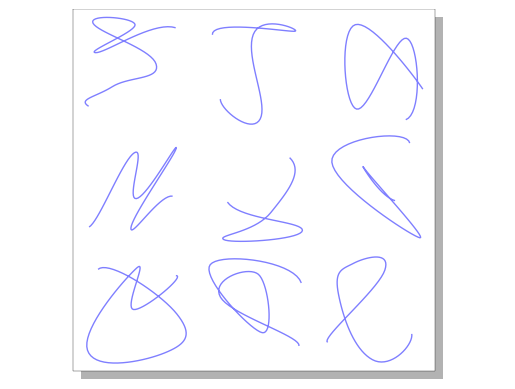

In [607]:
#G-3-2
def kmeans_glyph(n_clusters=6, low=-0.5, high=0.5):
    data = np.random.uniform(low=low, high=high, size=(100, 2))
    km = MiniBatchKMeans(n_clusters=n_clusters, n_init="auto", max_iter=25)
    km.fit(data)
    np.random.shuffle(km.cluster_centers_)
    return km.cluster_centers_
    
width = 120
height = 120
vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")
grid_size = 3
cell_size_x = width / grid_size
cell_size_y = height / grid_size

vsk.penWidth("2mm")
vsk.strokeWeight(1)
for i in range(grid_size):
    for j in range(grid_size):
        with vsk.pushMatrix():
            scale_val = (width / grid_size) * 0.1
            x = i * cell_size_x + (cell_size_x * 0.5)
            y = j * cell_size_y + (cell_size_y * 0.5)
            vsk.translate(x, y)
            glyph = kmeans_glyph(random.randrange(7, 10), low=-5, high=5)
            vsk.scale(scale_val)
            vsk.polygon(Polyline(glyph).catmull_spline(-0.5).to_polyline(20))
vsk.display()
vsk.save("asemic_kmeans.svg")

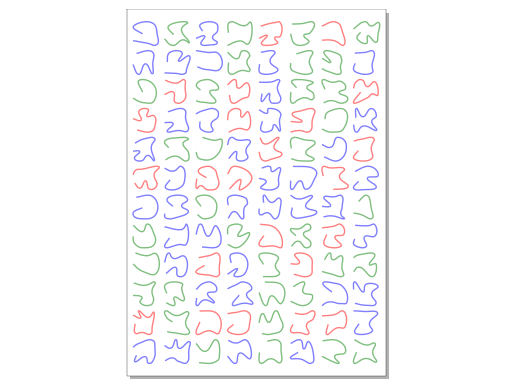

In [105]:
#D-3-5

import numpy as np
from sklearn.cluster import MiniBatchKMeans
from numpy.random import uniform, choice
import vsketch
import bezmerizing
import random

# -----------------------------
# 1. KMeans glyph generator
# -----------------------------
def kmeans_glyph(n_clusters=6, radius=5.0):
    """
    生成带 looping 倾向的 glyph。
    """
    # 在圆形附近的 domain 采样点
    data = np.random.uniform(-radius, radius, size=(100, 2))

    km = MiniBatchKMeans(n_clusters=n_clusters, n_init="auto", max_iter=25)
    km.fit(data)
    centers = km.cluster_centers_

    # --- 关键：按角度排序，让点绕原点一圈 ---
    angles = np.arctan2(centers[:, 1], centers[:, 0])
    order = np.argsort(angles)
    centers = centers[order]

    return centers


# -----------------------------
# 2. Page & grid layout
# -----------------------------

page_width  = 210
page_height = 297

margin_left   = 5
margin_right  = 5
margin_top    = 5
margin_bottom = 15

rows, cols = 12, 8

# gutter 12pt → mm
gutter_mm = 12 * 25.4 / 72.0    # 4.233 mm

# cell sizes
cell_width  = (page_width  - margin_left - margin_right - gutter_mm*(cols-1)) / cols
cell_height = (page_height - margin_top  - margin_bottom - gutter_mm*(rows-1)) / rows


# -----------------------------
# 3. vsk setup
# -----------------------------

vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")

vsk.penWidth("1mm")   # physical pen width
vsk.strokeWeight(1)

# -----------------------------
# 4. Draw grid of looping glyphs
# -----------------------------

for r in range(rows):
    for c in range(cols):

        # 每格一个独立 random glyph
        n_clusters = random.randrange(6, 11)
        radius = random.uniform(2.0, 6.0)
        glyph_pts = kmeans_glyph(n_clusters=n_clusters, radius=radius)

        # Catmull spline smoothing
        padded = [glyph_pts[0]] + list(glyph_pts) + [glyph_pts[-1]]
        curve = bezmerizing.Polyline(padded).catmull_spline(-0.5).to_polyline(40)
        curve = np.array(curve)

        # --- Fit glyph into cell ---
        # glyph 原始范围
        minx, miny = curve.min(axis=0)
        maxx, maxy = curve.max(axis=0)
        gw = maxx - minx
        gh = maxy - miny

        # scale so glyph fits cell tightly
        sx = cell_width  / gw
        sy = cell_height / gh
        scale_val = min(sx, sy)

        # center glyph inside cell
        with vsk.pushMatrix():

            ox = margin_left + c*(cell_width + gutter_mm)
            oy = margin_top  + r*(cell_height + gutter_mm)
            vsk.translate(ox, oy)

            vsk.scale(scale_val)

            # shift to left-top origin inside cell
            vsk.translate(-minx, -miny)

            # random 3-color strokes
            vsk.stroke(choice([1, 2, 3]))

            vsk.polygon(curve)

vsk.display()
vsk.save("asemic_kmeans_looping_matrix.svg")

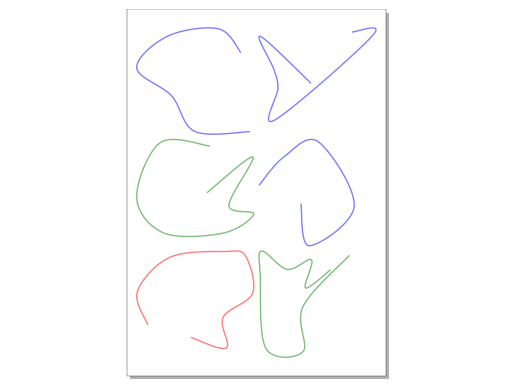

In [524]:
#D-3-6

import numpy as np
from sklearn.cluster import MiniBatchKMeans
from numpy.random import uniform, choice
import vsketch
import bezmerizing
import random

# -----------------------------
# 1. KMeans glyph generator
# -----------------------------
import math
import numpy as np
from sklearn.cluster import MiniBatchKMeans

def kmeans_glyph(
    n_clusters=6,
    radius=5.0,
    skip_prob=0.5,   # 每个点被“跳过”的概率，0~1 之间，自己调
    min_points=3,    # 至少保留几个点
):
    """
    生成带 looping 倾向的 glyph：
    1. KMeans 得到 centers
    2. 按角度排序 → 绕原点一圈
    3. 随机选择一个起点 → 从第 n 个 center 开始连
    4. 随机跳过若干 center（按 skip_prob），保持 loop 的方向感
    """
    # 在圆形附近的 domain 采样点
    data = np.random.uniform(-radius, radius, size=(100, 2))

    km = MiniBatchKMeans(n_clusters=n_clusters, n_init="auto", max_iter=25)
    km.fit(data)
    centers = km.cluster_centers_

    # 1) 按角度排序，让点绕原点一圈
    angles = np.arctan2(centers[:, 1], centers[:, 0])
    order = np.argsort(angles)
    centers = centers[order]

    # 2) 随机从第 n 个开始：循环位移
    n = len(centers)
    if n == 0:
        return centers

    start_idx = np.random.randint(0, n)   # 0 ~ n-1
    centers = np.roll(centers, -start_idx, axis=0)

    # 3) 随机跳过一些 center（还保持原来的顺序）
    if 0 < skip_prob < 1 and n > min_points:
        mask = np.random.rand(n) > skip_prob
        # 确保至少保留 min_points 个
        if mask.sum() < min_points:
            # 强行保留前 min_points 个
            mask[:] = False
            mask[:min_points] = True
        centers = centers[mask]

    return centers

# -----------------------------
# 2. Page & grid layout
# -----------------------------

page_width  = 210
page_height = 297

margin_left   = 8
margin_right  = 8
margin_top    = 8
margin_bottom = 22

rows, cols = 3, 2

# gutter 12pt → mm
gutter_mm = 12 * 25.4 / 72.0    # 4.233 mm

# cell sizes
cell_width  = (page_width  - margin_left - margin_right - gutter_mm*(cols-1)) / cols
cell_height = (page_height - margin_top  - margin_bottom - gutter_mm*(rows-1)) / rows


# -----------------------------
# 3. vsk setup
# -----------------------------

vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")

vsk.penWidth("1mm")   # physical pen width
vsk.strokeWeight(1)

# -----------------------------
# 4. Draw grid of looping glyphs
# -----------------------------

for r in range(rows):
    for c in range(cols):

        # 每格一个独立 random glyph
        n_clusters = 16
        radius = random.uniform(2.0, 6.0)
        glyph_pts = kmeans_glyph(n_clusters=n_clusters, radius=radius)

        # Catmull spline smoothing
        padded = [glyph_pts[0]] + list(glyph_pts) + [glyph_pts[-1]]
        curve = bezmerizing.Polyline(padded).catmull_spline(0).to_polyline(40)
        curve = np.array(curve)

        # --- Fit glyph into cell ---
        # glyph 原始范围
        minx, miny = curve.min(axis=0)
        maxx, maxy = curve.max(axis=0)
        gw = maxx - minx
        gh = maxy - miny

        # scale so glyph fits cell tightly
        sx = cell_width  / gw
        sy = cell_height / gh
        scale_val = min(sx, sy)

        # center glyph inside cell
        with vsk.pushMatrix():

            ox = margin_left + c*(cell_width + gutter_mm)
            oy = margin_top  + r*(cell_height + gutter_mm)
            vsk.translate(ox, oy)

            vsk.scale(scale_val)

            # shift to left-top origin inside cell
            vsk.translate(-minx, -miny)

            # random 3-color strokes
            vsk.stroke(choice([1, 2, 3]))

            vsk.polygon(curve)

vsk.display()
vsk.save("asemic_kmeans_looping_matrix.svg")

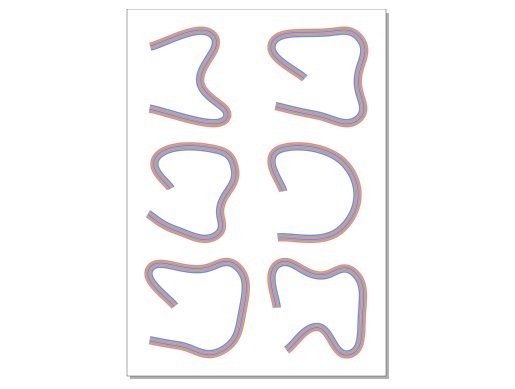

In [526]:
#D-3-7
import numpy as np
from numpy.random import uniform, choice
from sklearn.cluster import MiniBatchKMeans
import vsketch
import bezmerizing
import random

def kmeans_glyph(n_clusters=6, low=-0.5, high=0.5):
    data = np.random.uniform(low=low, high=high, size=(300, 2))

    km = MiniBatchKMeans(n_clusters=n_clusters, n_init="auto", max_iter=25)
    km.fit(data)
    centers = km.cluster_centers_

    center_of_mass = centers.mean(axis=0)
    rel = centers - center_of_mass

    angles = np.arctan2(rel[:, 1], rel[:, 0])
    order = np.argsort(angles)
    centers = centers[order]

    return centers

# ----- Page & grid -----
page_width  = 210
page_height = 297

margin_left   = 5
margin_right  = 5
margin_top    = 5
margin_bottom = 15

rows, cols = 3, 2
gutter_mm = 12 * 25.4 / 72.0  # 12pt

cell_width  = (page_width  - margin_left - margin_right - (cols-1)*gutter_mm) / cols
cell_height = (page_height - margin_top  - margin_bottom - (rows-1)*gutter_mm) / rows

vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")

vsk.penWidth("1mm")
vsk.strokeWeight(1)

for r in range(rows):
    for c in range(cols):

        # 每格一个 glyph
        n_clusters = random.randrange(4, 9)
        domain = random.uniform(3, 8)
        pts = kmeans_glyph(n_clusters=n_clusters, low=-domain, high=domain)

        # --- Catmull-Rom spline，保留首尾 ---
        padded = [pts[0]] + list(pts) + [pts[-1]]

        # 这里先保留成 Polyline 对象（很重要，offsets 用得到）
        spline = bezmerizing.Polyline(padded).catmull_spline(-0.5)
        curve_poly = spline.to_polyline(50)     # Polyline 对象
        base_vertices = curve_poly.vertices     # (N,2) numpy array

        # 手动把首尾点拉回原来的节点（可选）
        base_vertices[0]  = pts[0]
        base_vertices[-1] = pts[-1]

        # --- 用原始 polyline 计算 bbox，fit 到 cell ---
        minx, miny = base_vertices.min(axis=0)
        maxx, maxy = base_vertices.max(axis=0)
        gw, gh = maxx - minx, maxy - miny

        sx = cell_width  / gw
        sy = cell_height / gh
        scale_val = min(sx, sy)

        with vsk.pushMatrix():
            ox = margin_left + c*(cell_width + gutter_mm)
            oy = margin_top  + r*(cell_height + gutter_mm)
            vsk.translate(ox, oy)

            vsk.scale(scale_val*0.75)
            vsk.translate(-minx, -miny)

            # ------ 这里加上你要的 offset 多重笔画 ------
            stroke_offset = 6
            base_offset_mm = 1.5  # 每条之间相隔 0.8mm，你可以自己改
            
            for j in range(1, stroke_offset+1):
                # 想要的真实偏移距离（mm）
                desired_mm = j * base_offset_mm
                # 换算成 glyph 原始坐标里的距离
                offset_in_domain = desired_mm / scale_val
            
                off_poly = spline.offsets(
                    distances=[offset_in_domain, offset_in_domain],
                    samples_per=24
                )
                offset_vertices = off_poly.vertices
            
                vsk.stroke(1 + (j % 3))
                vsk.polygon(offset_vertices)


vsk.display()
vsk.save("asemic_kmeans_looping_matrix.svg")

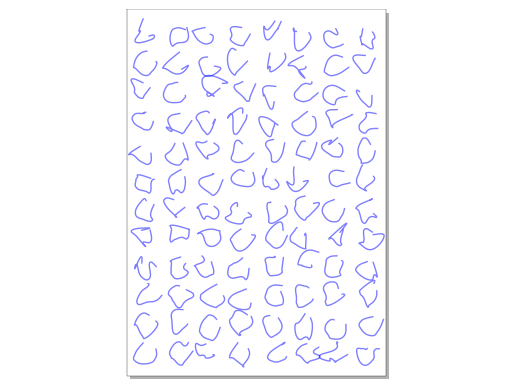

In [117]:
#G-3-4
import numpy as np
from numpy.random import uniform, choice
from sklearn.cluster import MiniBatchKMeans
import vsketch
import bezmerizing
import random

def kmeans_glyph(n_clusters=6, low=-0.5, high=0.5):
    data = np.random.uniform(low=low, high=high, size=(300, 2))

    km = MiniBatchKMeans(n_clusters=n_clusters, n_init="auto", max_iter=25)
    km.fit(data)
    centers = km.cluster_centers_

    # center
    com = centers.mean(axis=0)
    rel = centers - com

    # sort by angle
    ang = np.arctan2(rel[:,1], rel[:,0])
    order = np.argsort(ang)
    rel = rel[order]

    # --- 统一半径（真正形成 loop） ---
    R = np.mean(np.linalg.norm(rel, axis=1))
    dir = rel / np.linalg.norm(rel, axis=1, keepdims=True)
    rel = dir * R

    # --- 加一点小噪声让它不死板 ---
    rel += np.random.normal(scale=1, size=rel.shape)

    return rel


# ----- Page & grid -----
page_width  = 210
page_height = 297

margin_left   = 5
margin_right  = 5
margin_top    = 5
margin_bottom = 15

rows, cols = 12, 8
gutter_mm = 12 * 25.4 / 72.0  # 12pt

cell_width  = (page_width  - margin_left - margin_right - (cols-1)*gutter_mm) / cols
cell_height = (page_height - margin_top  - margin_bottom - (rows-1)*gutter_mm) / rows

vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")

vsk.penWidth("1mm")
vsk.strokeWeight(1)

stroke_offset = 3   # 想要几条偏移线就改这里

for r in range(rows):
    for c in range(cols):

        # 每格一个 glyph
        n_clusters = random.randrange(6, 10)
        domain = random.uniform(3, 8)
        pts = kmeans_glyph(n_clusters=n_clusters, low=-domain, high=domain)

        # --- Catmull-Rom spline，保留首尾 ---
        padded = [pts[0]] + list(pts) + [pts[-1]]

        # 这里先保留成 Polyline 对象（很重要，offsets 用得到）
        spline = bezmerizing.Polyline(padded).catmull_spline(-0.5)
        curve_poly = spline.to_polyline(50)     # Polyline 对象
        base_vertices = curve_poly.vertices     # (N,2) numpy array

        # 手动把首尾点拉回原来的节点（可选）
        base_vertices[0]  = pts[0]
        base_vertices[-1] = pts[-1]

        # --- 用原始 polyline 计算 bbox，fit 到 cell ---
        minx, miny = base_vertices.min(axis=0)
        maxx, maxy = base_vertices.max(axis=0)
        gw, gh = maxx - minx, maxy - miny

        sx = cell_width  / gw
        sy = cell_height / gh
        scale_val = min(sx, sy)
        
        with vsk.pushMatrix():
            ox = margin_left + c*(cell_width + gutter_mm)
            oy = margin_top  + r*(cell_height + gutter_mm)
            vsk.translate(ox, oy)

            vsk.scale(scale_val*0.9)
            vsk.translate(-minx, -miny)
            vsk.rotate(135, degrees=True)

            vsk.polygon(base_vertices)

vsk.display()
vsk.save("asemic_kmeans_looping_matrix.svg")

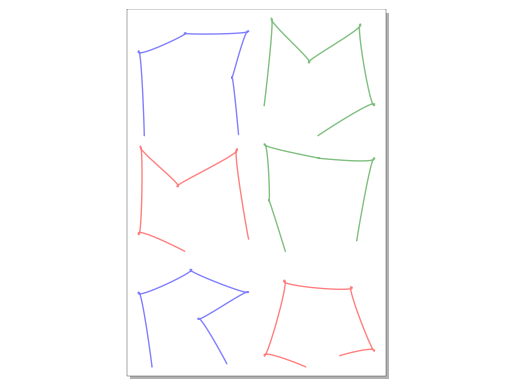

In [60]:
#D-3-8

import numpy as np
from numpy.random import uniform, choice
from sklearn.cluster import MiniBatchKMeans
import vsketch
import bezmerizing
import random


# -----------------------------
# 1. KMeans glyph generator
# -----------------------------
def kmeans_glyph(n_clusters=6, low=-0.5, high=0.5):
    """
    基于 KMeans + 极角排序生成 looping glyph。
    """
    # 1) 采样 domain
    data = np.random.uniform(low=low, high=high, size=(300, 2))

    km = MiniBatchKMeans(n_clusters=n_clusters, n_init="auto", max_iter=25)
    km.fit(data)
    centers = km.cluster_centers_

    # 2) use centroid of mass as rotation center
    center_of_mass = centers.mean(axis=0)
    rel = centers - center_of_mass

    # 3) sort by angle
    angles = np.arctan2(rel[:, 1], rel[:, 0])
    order = np.argsort(angles)
    centers = centers[order]

    return centers


# -----------------------------
# 2. Page & grid layout
# -----------------------------

page_width  = 210
page_height = 297

margin_left   = 5
margin_right  = 5
margin_top    = 5
margin_bottom = 15

rows, cols = 3, 2

# gutter 12pt → mm
gutter_mm = 12 * 25.4 / 72.0  # ≈ 4.233 mm

# cell sizes
cell_width  = (page_width  - margin_left - margin_right - (cols-1)*gutter_mm) / cols
cell_height = (page_height - margin_top  - margin_bottom - (rows-1)*gutter_mm) / rows


# -----------------------------
# 3. vsk init
# -----------------------------

vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")

vsk.penWidth("1mm")
vsk.strokeWeight(1)


# -----------------------------
# 4. Draw looping glyphs
# -----------------------------

for r in range(rows):
    for c in range(cols):

        # 每格随机一个 glyph
        n_clusters = 6
        domain = random.uniform(3, 6)
        pts = kmeans_glyph(n_clusters=n_clusters, low=-domain, high=domain)

        # --- Catmull-Rom: keep endpoints ---
        padded = [pts[0]] + list(pts) + [pts[-1]]
        curve = bezmerizing.Polyline(padded).catmull_spline(1.5).to_polyline(20)
        curve = np.array(curve)
        curve[0]  = pts[0]
        curve[-1] = pts[-1]

        # --- Fit glyph into cell ---
        minx, miny = curve.min(axis=0)
        maxx, maxy = curve.max(axis=0)
        gw, gh = maxx - minx, maxy - miny

        sx = cell_width  / gw
        sy = cell_height / gh
        scale_val = min(sx, sy)

        # --- Drawing ---
        with vsk.pushMatrix():

            ox = margin_left + c*(cell_width + gutter_mm)
            oy = margin_top  + r*(cell_height + gutter_mm)
            vsk.translate(ox, oy)

            vsk.scale(scale_val)
            vsk.rotate(-90, degrees=True)
            vsk.translate(-minx, -miny)

            vsk.stroke(choice([1, 2, 3]))
            vsk.polygon(curve)

vsk.display()
vsk.save("asemic_kmeans_looping_matrix.svg")

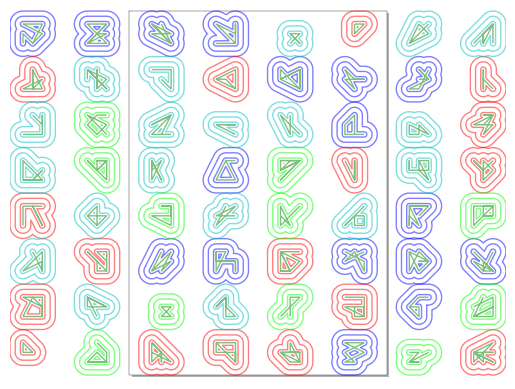

In [106]:
#D-7-11
#A_2_3\n#A-2-3
def grid_glyph():
    pts = []
    for i in range(int(t_normal(4, 12, 8, 2))):
        x = (choice([-0.5, 0, 0.5]))
        y = (choice([-0.5, 0, 0.5]))
        pts.append([x, y])
    return pts

width = 297
height = 420
grid_size = 8
pen_size = 6

cell_size_x = width / grid_size *2
cell_size_y = height / grid_size

scale_val = (width / grid_size) * 0.6

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

for i in range(grid_size):
    for j in range(grid_size):
        glyph = grid_glyph()
        with vsk.pushMatrix():
            stroke_pen = choice([1, 2, 3, 4])
            vsk.stroke(stroke_pen)
            vsk.penWidth(f"{pen_size}mm")
            vsk.strokeWeight(int(cell_size_x / pen_size / 2))
            vsk.translate(i * cell_size_x, j * cell_size_y)
            vsk.scale(scale_val)
            vsk.polygon(glyph)

            vsk.stroke(5)
            vsk.penWidth("1mm")
            vsk.strokeWeight(1)
            vsk.polygon(glyph)
vsk.display()
# vsk.save("A-2-3.svg")

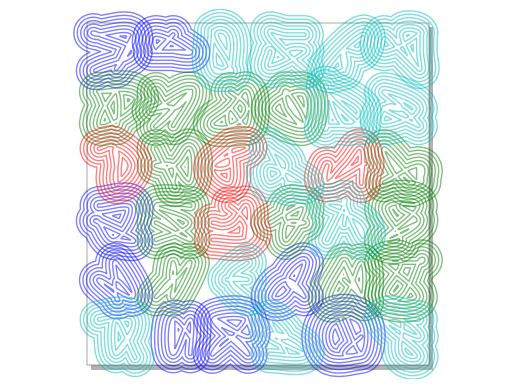

In [635]:
#D-7-12
#C_2_1\n#C-2-1
def grid_glyph():
    pts = []
    for i in range(int(t_normal(8, 10, 9, 1))):
        x = (choice([-0.5, 0, 0.5]))
        y = (choice([-0.5, 0, 0.5]))
        pts.append([x, y])
    return pts
    
width = 210
height = 210
grid_size = 6

cell_size_x = width / grid_size
cell_size_y = height / grid_size

scale_val = (width / grid_size) * 0.6

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

pen_width = width / 100 
vsk.penWidth(f"{pen_width}mm")
vsk.strokeWeight(12)

for i in range(grid_size):
    for j in range(grid_size):
        glyph = grid_glyph()
        smooth = (
            bezmerizing.Polyline(glyph)
            .augment()
            .catmull_spline(tightness=-0.5)
            .to_polyline(10)
        )
        with vsk.pushMatrix():
            stroke_pen = choice([1, 2, 3, 4])
            vsk.stroke(stroke_pen)
            vsk.translate(i * cell_size_x, j * cell_size_y)
            vsk.scale(scale_val)
            vsk.polygon(smooth)
vsk.display()
vsk.save("C-2-1.svg")

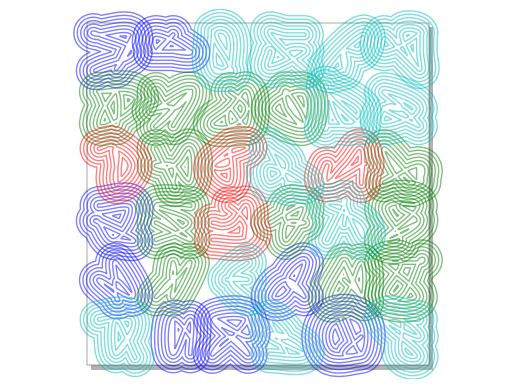

In [635]:
#D-7-12
#C_2_1\n#C-2-1
def grid_glyph():
    pts = []
    for i in range(int(t_normal(8, 10, 9, 1))):
        x = (choice([-0.5, 0, 0.5]))
        y = (choice([-0.5, 0, 0.5]))
        pts.append([x, y])
    return pts
    
width = 210
height = 210
grid_size = 6

cell_size_x = width / grid_size
cell_size_y = height / grid_size

scale_val = (width / grid_size) * 0.6

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

pen_width = width / 100 
vsk.penWidth(f"{pen_width}mm")
vsk.strokeWeight(12)

for i in range(grid_size):
    for j in range(grid_size):
        glyph = grid_glyph()
        smooth = (
            bezmerizing.Polyline(glyph)
            .augment()
            .catmull_spline(tightness=-0.5)
            .to_polyline(10)
        )
        with vsk.pushMatrix():
            stroke_pen = choice([1, 2, 3, 4])
            vsk.stroke(stroke_pen)
            vsk.translate(i * cell_size_x, j * cell_size_y)
            vsk.scale(scale_val)
            vsk.polygon(smooth)
vsk.display()
vsk.save("C-2-1.svg")

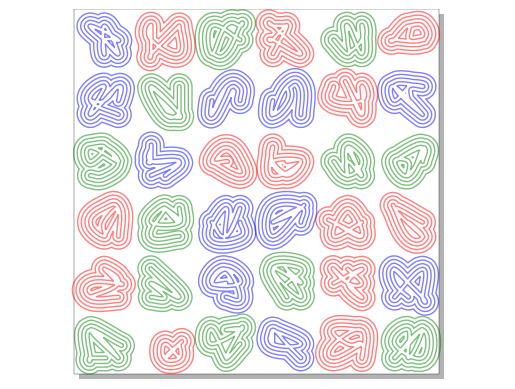

In [15]:
#D-9-3
def grid_glyph():
    pts = []
    for i in range(int(t_normal(8, 10, 9, 1))):
        x = (choice([-0.5, 0, 0.5]))
        y = (choice([-0.5, 0, 0.5]))
        pts.append([x, y])
    return pts
    
width = 210
height = 210
grid_size = 6

cell_size_x = width / grid_size
cell_size_y = height / grid_size

scale_val = (width / grid_size) * 0.46

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

pen_width = width / 100 
vsk.penWidth(f"{pen_width}mm")
vsk.strokeWeight(8)

for i in range(grid_size):
    for j in range(grid_size):
        glyph = grid_glyph()
        smooth = (
            bezmerizing.Polyline(glyph)
            .augment()
            .catmull_spline(tightness=-0.5)
            .to_polyline(10)
        )
        with vsk.pushMatrix():
            stroke_pen = choice([1, 2, 3])
            vsk.stroke(stroke_pen)
            vsk.translate(i * cell_size_x, j * cell_size_y)
            vsk.scale(scale_val)
            vsk.polygon(smooth)
vsk.display()
vsk.save("C-2-1.svg")

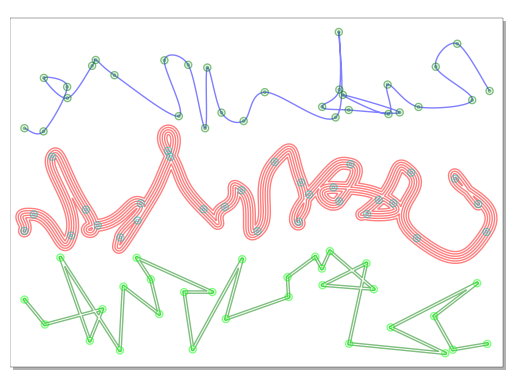

In [241]:
#D-6-8
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        base_x = (width / steps) * i

        # 第一个和最后一个点不加 stddev
        if i == 0 or i == steps - 1:
            x = base_x
        else:
            x = base_x + normal(0, stddev)

        y = uniform(-height/2, height/2)
        pts.append([x, y])
    return pts


# --- Page + layout settings ---
page_width  = 420   # mm
page_height = 297   # mm

# Margins (mm)
margin_left   = 5
margin_right  = 5
margin_top    = 5
margin_bottom = 15

rows = 3

# Gutter: 12 pt -> mm (1pt ≈ 0.35278 mm)
gutter_pt = 12
gutter_mm = gutter_pt * 25.4 / 72.0   # ≈ 4.23 mm

# Cell size (only 1 column, full width)
cell_width = page_width - margin_left - margin_right
available_height = page_height - margin_top - margin_bottom - gutter_mm * (rows - 1)
cell_height = available_height / rows

pen_width = 2
# --- vsketch setup ---
vsk = vsketch.Vsketch()
vsk.size(f"{page_width}mm", f"{page_height}mm")
vsk.scale("1mm")
vsk.penWidth(f"{pen_width}mm")

stroke_weights_by_row = [1, 6, 2]  # row 0, 1, 2
tightness_by_row = [0, -2, 1]
width_by_row = [0, -2, 1]

for i in range(rows):
    # origin (top-left) of this row's cell
    origin_x = margin_left
    origin_y = margin_top + i * (cell_height + gutter_mm)

    # Make scribble that already lives in [0, cell_width] × [0, cell_height]
    steps = 30
    pts = make_scribble(
        width=cell_width - (stroke_weights_by_row[i]-1)* pen_width,
        height=cell_height - (stroke_weights_by_row[i]-1)* pen_width,
        steps=steps,
        stddev=20
    )

    # 在首尾各加一份，使 spline 端点贴住原始首尾点
    padded = [pts[0]] + pts + [pts[-1]]
    
    curve_pts = bezmerizing.Polyline(padded).catmull_spline(
        tightness=tightness_by_row[i]
    ).to_polyline(20)

    with vsk.pushMatrix():
        # Move to the cell
        vsk.translate(origin_x, origin_y)

        # Shape fills the cell: no extra scaling
        vsk.stroke(i+1)
        vsk.strokeWeight(stroke_weights_by_row[i])
        vsk.polygon(curve_pts)

        # Draw the points themselves
        vsk.stroke(i+3)
        vsk.strokeWeight(2)
        for pt in pts:
            vsk.circle(pt[0], pt[1], 4)

vsk.display()
vsk.save("D-3-5.svg")

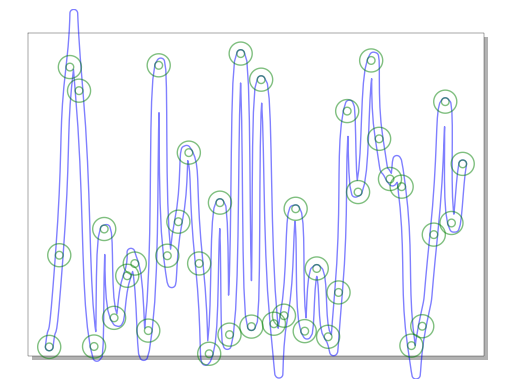

In [289]:
#E-1-2
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = uniform(-height/2, height/2)
        pts.append([x, y])
    return pts

vsk = vsketch.Vsketch()
vsk.size("297mm", "210mm")
vsk.scale("1mm")
vsk.penWidth("5mm")

pts = make_scribble(width=277, height=200, steps=40, stddev=i * 0.5)
padded = [pts[0]] + pts + [pts[-1]]
curve_pts = bezmerizing.Polyline(padded).catmull_spline(tightness=uniform(-4, 1)).to_polyline(10)
vsk.strokeWeight(choice([1, 2, 5]))
with vsk.pushMatrix():
    vsk.stroke(1)
    vsk.strokeWeight(2)
    vsk.translate(0, i * 40)
    vsk.polygon(curve_pts)
    vsk.stroke(2)
    vsk.strokeWeight(4)
    for pt in pts:
        vsk.circle(pt[0], pt[1], 0)
vsk.display()
# vsk.save("D-3-6.svg")

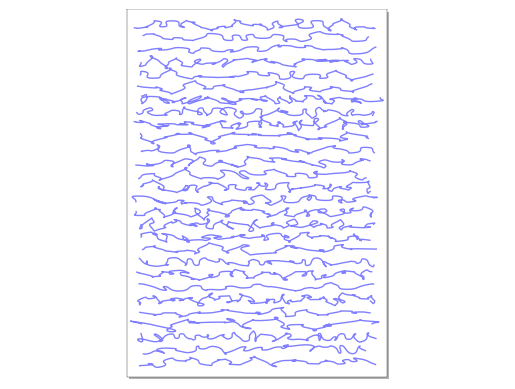

In [439]:
#B-4-2
#TYPE G, V5
def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + normal(0, stddev)
        y = uniform(-height/2, height/2)
        pts.append([x, y])
    return pts

width = 297
height = 420

margin = 10
rows = 28

line_width = width-margin*2
# “Em” box for glyph sizing and layout rhythm
em_width = width-margin*2  # width of glyph
em_height = (height-margin*2)/rows -4 # height of glyph
line_height = (height-margin*2)/rows  # spacing between lines

vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")

for i in range(rows):
    pts = make_scribble(width=em_width, height=em_height, steps=int(uniform(20,60)), stddev=uniform(3, 5))
    
    padded = [pts[0]] + pts + [pts[-1]]
    curve_pts = bezmerizing.Polyline(padded).catmull_spline(tightness=uniform(-4, -1)).to_polyline(10)
    with vsk.pushMatrix():
        vsk.translate(0, i * line_height)
        vsk.polygon(curve_pts)
vsk.display()
vsk.save("Code_Example_2.svg")

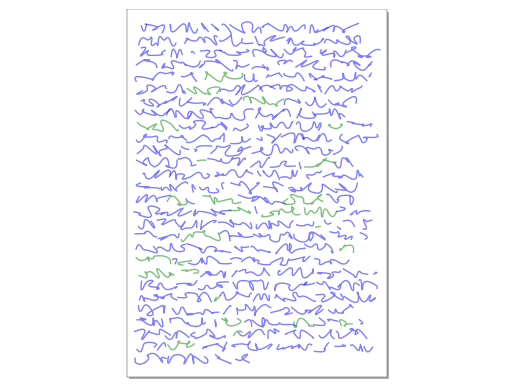

In [198]:
#B-4-3
# Code Example 2 (comments aligned with Example 1)

from numpy.random import uniform, normal, choice

def baseline_glyph_varwidth(n=10, width=1.0):
    pts = [[0, 0], [width, 0]]
    # Generate a polyline by sampling points uniformly within the unit box
    for i in range(n):
        pts.append([uniform(0, width), uniform(0, -1)])
    return pts

def make_scribble(width, height, steps, stddev=0):
    pts = []
    for i in range(steps):
        x = ((width / steps) * i) + uniform(0, stddev)
        y = uniform(-height/2, height/2)
        pts.append([x, y])
    return pts

# Physical page size in millimeters (matches vsketch units after vsk.scale("1mm"))
glyph_count = 250
glyph_widths = [random.randrange(1, 5) for i in range(glyph_count)]

width = 297
height = 420

# Outer margin in mm
margin = 10

# Initialize vsketch drawing
vsk = vsketch.Vsketch()
vsk.size(f"{width}mm", f"{height}mm")
vsk.scale("1mm")  # interpret coordinates as millimeters

# Cursor for flow layout (x advances across line; y advances line by line)
current_x = 0
current_y = 0

# “Em” box for glyph sizing and layout rhythm
em_width = 12   # width of glyph
em_height = 12  # height of glyph
line_height = 14  # spacing between lines
kerning = 0      # spacing between glyphs

# Iterate over the list of width multipliers (one glyph per step)
for width_factor in glyph_widths:

    # Generate one glyph with the given width factor
    glyph = make_scribble( width_factor, em_height, 3*width_factor, stddev=1)#baseline_glyph_varwidth(random.randrange(3, 6), width_factor)

    # The actual width of the glyph on screen
    g_width = em_width * width_factor

    smooth = (
        bezmerizing.Polyline(glyph)
        .augment()
        .catmull_spline(tightness=-0.5)
        .to_polyline(10)
    )

    # If this glyph would overflow the line, move to the next line
    # margin*2 because there are left and right margins
    if current_x + g_width > (width - margin * 2):
        current_x = 0
        current_y += line_height

    # Stop if we exceed the page height
    if current_y > height:
        break

    with vsk.pushMatrix():
        # Randomly choose which physical pen to use
        stroke_pen = choice([2, 1], p=[0.1, 0.9])
        vsk.stroke(stroke_pen)

        # Move to the current cursor position with margins
        vsk.translate(current_x + margin, current_y + margin + em_height)

        # Scale up the unit glyph to the em size
        vsk.scale(em_width, 1)

        if width_factor != 6:
            # Draw the polygon defined by the sampled points
            vsk.polygon(smooth)

    # Advance the cursor and add kerning
    current_x += g_width + kerning

# Preview on screen and export to SVG
vsk.display()
vsk.save("Code_Example_2.svg")